## Blosum strategies
* This file compares using the original blosum rows as features vs. doing eigenvalue decomposition and then constructing features

In [1]:
import os, sys
import numpy as np
import json
import random
import torch
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
import torch.nn as nn
import torch.nn.functional as F
from torch.optim import SGD, Adam
from torch.optim.lr_scheduler import StepLR, CosineAnnealingLR
import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from numpy import linalg as LA

## Preliminary

In [2]:
torch.manual_seed(12345)
k = 10000
device = torch.device("cuda:0" if torch.cuda.is_available() else 'cpu')
na_list = ['A', 'C', 'G', 'T'] #nucleic acids
aa_list = ['R', 'L', 'S', 'A', 'G', 'P', 'T', 'V', 'N', 'D', 'C', 'Q', 'E', 'H', 'I', 'K', 'M', 'F', 'W', 'Y'] #amino acids

NNK_freq = [0.09375]*3 + [0.0625]*5 + [0.03125]*12 #freq of 21 NNK codons including the stop codon
sum_20 = 0.0625*5 + 0.09375*3 + 0.03125*12 #sum of freq without the stop codon
pvals = [0.09375/sum_20]*3 + [0.0625/sum_20]*5 + [0.03125/sum_20]*12 #normalize freq for 20 codons
pvals = [0.09375/sum_20]*3 + [0.0625/sum_20]*5 + [0.03125/sum_20]*11 + \
        [1- sum([0.09375/sum_20]*3 + [0.0625/sum_20]*5 + [0.03125/sum_20]*11)] 
        #adjust sum to 1 due to numerical issue

aa_dict = dict(zip(aa_list, pvals))
encoding_style = 'clipped'
lambda_val = 3

In [3]:
# New distribution (not NNK exactly)
#aa_list = ["A", "C", "D", "E", "F", "G", "H",  "I",  "K",  "L",  "M",  "N", "P", "Q", "R", "S", "T", "V",  "W", "Y"]
#pvals = [0.07593866356305902, 0.03631684619058439, 0.024513616151124667, 0.041131394815058675, 0.023547479168888497, 0.13123048459865624, 0.01854949620472682, 0.02172407877104557, 0.030274641454491498, 0.08833837978698246, 0.03053708795667314, 0.01740975503447508, 0.03779878792375141, 0.02613447832961611, 0.12025187445227044, 0.07884449349216138, 0.03949105780778344, 0.0859082921038843, 0.05098231963758271, 0.021076772557184122]
#aa_dict = dict(zip(aa_list, pvals))

In [4]:
# Original BLOSUM62 matrix
original_blosum62 = {}
with open('blosum62.txt', 'r') as f:
    for line in f:
        split_line = line.strip().split()
        aa = split_line[0]
        encoding = [int(x) for x in split_line[1:-3]]
        original_blosum62[aa] = encoding

In [5]:
blosum_matrix = np.zeros((20, 20))
for i, aa in enumerate(original_blosum62.keys()):
    sims = original_blosum62[aa]
    for j, s in enumerate(sims):
        blosum_matrix[i][j] = s   
u, V = LA.eig(blosum_matrix)
clipped_u = u
clipped_u[clipped_u < 0] = 0
lamb = np.diag(clipped_u)
T = V
clip_blosum62 = {}
for i, aa in enumerate(original_blosum62.keys()):
    clip_blosum62[aa] = np.dot(np.sqrt(lamb), V[i])

## Dataset

In [6]:
class BinaryDataset(Dataset):
    def __init__(self, filepath):
        def construct_binary_dataset(filepath):
            with open(filepath, 'r') as f:
                aptamer_data = json.load(f)
            ds = []
            for aptamer in aptamer_data:
                peptides = aptamer_data[aptamer]
                for peptide in peptides:
                    ds.append((aptamer, peptide, 1))
                    ds.append((get_x(), get_y(), 0))
            ds = list(set(ds)) #removed duplicates, random order
            return ds

        # Sample x from P_X (assume apatamers follow uniform)
        def get_x():
            x_idx = np.random.randint(0, 4, 40)
            x = ""
            for i in x_idx:
                x += na_list[i]
            return x

        # Sample y from P_y (assume peptides follow NNK)
        def get_y():
            y_idx = np.random.choice(20, 7, p=pvals)
            y = "M"
            for i in y_idx:
                y += aa_list[i]
            return y

        self.binary_ds=construct_binary_dataset(filepath)

    def __len__(self):
        return len(self.binary_ds)

    def __getitem__(self,idx):
        return(self.binary_ds[idx])

In [7]:
class EvalDataset(Dataset):
    def __init__(self, filepath):
        def construct_binary_dataset(filepath):
            with open(filepath, 'r') as f:
                aptamer_data = json.load(f)
            ds = []
            for aptamer in aptamer_data:
                peptides = aptamer_data[aptamer]
                for peptide in peptides:
                    ds.append((aptamer, peptide, 1))
            ds = list(set(ds)) #removed duplicates, random order
            return ds

        self.binary_ds=construct_binary_dataset(filepath)

    def __len__(self):
        return len(self.binary_ds)

    def __getitem__(self,idx):
        return(self.binary_ds[idx])

In [8]:
class HalfDataset(Dataset):
    def __init__(self, filepath):
        def construct_half_dataset(filepath):
            with open(filepath, 'r') as f:
                aptamer_data = json.load(f)
            ds = []
            for aptamer in aptamer_data:
                peptides = aptamer_data[aptamer]
                for peptide in peptides:
                    ds.append((get_x(), peptide, 0))
            ds = list(set(ds)) #removed duplicates, random order
            return ds

        # Sample x from P_X (assume apatamers follow uniform)
        def get_x():
            x_idx = np.random.randint(0, 4, 40)
            x = ""
            for i in x_idx:
                x += na_list[i]
            return x
        
         # Sample y from P_y (assume peptides follow NNK)
        def get_y():
            y_idx = np.random.choice(20, 7, p=pvals)
            y = "M"
            for i in y_idx:
                y += aa_list[i]
            return y

        self.binary_ds=construct_half_dataset(filepath)

    def __len__(self):
        return len(self.binary_ds)

    def __getitem__(self,idx):
        return(self.binary_ds[idx])

In [9]:
class GeneratedDataset(Dataset):
    def __init__(self, n):
        def construct_generated_dataset(k):
            S_new = []
            for _, i in enumerate(tqdm.tqdm(range(k))):
                pair = (get_x(), get_y())
                S_new.append(pair)
            np.random.shuffle(S_new)
            return S_new
        
        # Sample x from P_X (assume apatamers follow uniform)
        def get_x():
            x_idx = np.random.randint(0, 4, 40)
            x = ""
            for i in x_idx:
                x += na_list[i]
            return x

        # Sample y from P_y (assume peptides follow NNK)
        def get_y():
            y_idx = np.random.choice(20, 7, p=pvals)
            y = "M"
            for i in y_idx:
                y += aa_list[i]
            return y
        self.gen_ds = construct_generated_dataset(n)
    def __len__(self):
        return len(self.gen_ds)
    
    def __getitem__(self, idx):
        return (self.gen_ds[idx])

In [10]:
binary_ds=BinaryDataset(filepath="../data/higher_quality_data.json")
n = len(binary_ds)
m = int(0.8*n) #length of train
binary_train = binary_ds[:m]
binary_val = binary_ds[m:]
#eval_ds = EvalDataset(filepath="../data/no_peptide_data.json")

half_ds = HalfDataset(filepath="../data/aptamer_dataset.json")
len(half_ds)

## NN Model

In [11]:
# Expects peptides to be encoding according to BLOSUM62 matrix
# Expects aptamers to be one hot encoded
class BlosumNet(nn.Module):
    def __init__(self):
        super(BlosumNet, self).__init__()
        self.name = "BlosumNet"
        self.single_alphabet = False
        
        self.cnn_apt_1 = nn.Conv1d(4, 25, 3, padding=2) 
        self.cnn_apt_2 = nn.Conv1d(25, 50, 3, padding=2) 
        self.cnn_apt_3 = nn.Conv1d(50, 25, 3, padding=2) 
        self.cnn_apt_4 = nn.Conv1d(25, 10, 3) 
        
        # There are 20 channels
        self.cnn_pep_1 = nn.Conv1d(20, 40, 3, padding=2)
        self.cnn_pep_2 = nn.Conv1d(40, 80, 3, padding=2)
        self.cnn_pep_3 = nn.Conv1d(80, 150, 3, padding=2)
        self.cnn_pep_4 = nn.Conv1d(150, 50, 3, padding=2)
        self.cnn_pep_5 = nn.Conv1d(50, 10, 3, padding=2)
        
        self.relu = nn.ReLU()
        self.maxpool = nn.MaxPool1d(2) 
        
        self.cnn_apt = nn.Sequential(self.cnn_apt_1, self.maxpool, self.relu, 
                                     self.cnn_apt_2, self.maxpool, self.relu)
        self.cnn_pep = nn.Sequential(self.cnn_pep_1, self.maxpool, self.relu,
                                     self.cnn_pep_2, self.maxpool, self.relu)
        
        self.fc1 = nn.Linear(790, 500)
        self.fc2 = nn.Linear(500, 200)
        self.fc3 = nn.Linear(200, 1)
    
    def forward(self, apt, pep):
        apt = self.cnn_apt(apt)
        pep = self.cnn_pep(pep)
        
        apt = apt.view(-1, 1).T
        pep = pep.view(-1, 1).T
        x = torch.cat((apt, pep), 1)
        x = self.fc1(x)
        x = self.fc2(x)
        x = self.fc3(x)
        x = torch.sigmoid(x)
        return x

In [12]:
# Expects peptides to be encoding according to BLOSUM62 matrix
# Expects aptamers to be one hot encoded
class BlosumLinearNet(nn.Module):
    def __init__(self):
        super(BlosumLinearNet, self).__init__()
        self.name = "BlosumLinearNet"
        self.single_alphabet = False
        
        self.fc_apt_1 = nn.Linear(160, 200) 
        self.fc_apt_2 = nn.Linear(200, 250)
        self.fc_apt_3 = nn.Linear(250, 300)
        
        self.fc_pep_1 = nn.Linear(160, 200)
        self.fc_pep_2 = nn.Linear(200, 250)
        
        self.relu = nn.ReLU()
        
        self.fc_apt = nn.Sequential(self.fc_apt_1, self.fc_apt_2, self.fc_apt_3)
        self.fc_pep = nn.Sequential(self.fc_pep_1, self.fc_pep_2)
        
        self.fc1 = nn.Linear(550, 600)
        self.fc2 = nn.Linear(600, 1)
        
    def forward(self, apt, pep):
        apt = apt.view(-1, 1).T
        pep = pep.view(-1, 1).T
        
        apt = self.fc_apt(apt)
        pep = self.fc_pep(pep)
        x = torch.cat((apt, pep), 1)
        x = self.fc2(self.fc1(x))
        x = torch.sigmoid(x)
        return x

In [13]:
def weights_init(m):
    if isinstance(m, nn.Conv1d):
        nn.init.xavier_uniform_(m.weight.data, gain=nn.init.calculate_gain('relu'))
        nn.init.zeros_(m.bias.data)
    if isinstance(m, nn.Linear):
        nn.init.kaiming_normal_(m.weight.data, nonlinearity='sigmoid')
        nn.init.zeros_(m.bias.data)

## Helper methods

In [14]:
## Takes a peptide and aptamer sequence and converts to one-hot matrix
def one_hot(sequence, seq_type='peptide', single_alphabet=False):
    if single_alphabet:
        apt = sequence[0]
        pep = sequence[1]
        one_hot = np.zeros((len(apt) + len(pep), 24))
        # Encode the aptamer first
        for i in range(len(apt)):
            char = apt[i]
            for _ in range(len(na_list)):
                idx = na_list.index(char)
                one_hot[i][idx] = 1
            
        # Encode the peptide second
        for i in range(len(pep)):
            char = pep[i]
            for _ in range(len(aa_list)):
                idx = aa_list.index(char) + len(na_list)
                one_hot[i+len(apt)][idx] = 1
        
        return one_hot       
    else:
        if seq_type == 'peptide':
            letters = aa_list
        else:
            letters = na_list
        one_hot = np.zeros((len(sequence), len(letters)))
        for i in range(len(sequence)):
            char = sequence[i]
            for _ in range(len(letters)):
                idx = letters.index(char)
                one_hot[i][idx] = 1
        return one_hot
    
## For aptamer sequence, translate
## For peptide sequence, translate and add additional biological properties
def extract_features(sequence, seq_type='peptide', single_alphabet=False):
    if single_alphabet:
        pass
    else:
        if seq_type == 'peptide':
            letters = aa_list
            encoding = np.zeros((4, len(sequence)))
            for i in range(len(sequence)):
                char = sequence[i]
                
                idx = letters.index(char)
                char_hydro = hydrophobicity[char]
                char_polar = polarity[char]
                char_vol = volume[char]
                char_charge = charge[char]
                
                # Put in the biological features of the amino acids
                encoding[0][i] = char_polar
                encoding[1][i] = char_vol
                encoding[2][i] = char_charge
                encoding[3][i] = char_hydro
        else:
            letters = na_list
            encoding = np.zeros(len(sequence))
            for i in range(len(sequence)):
                char = sequence[i]
                idx = letters.index(char)
                encoding[i] = idx
        return encoding 

def blosum62_encoding(sequence, seq_type='peptide', single_alphabet=False, style=encoding_style):
    if single_alphabet:
        pass
    else:
        if seq_type == 'peptide':
            encoding = []
            for i in range(len(sequence)):
                if style == "clipped":
                    encoding.append(clip_blosum62[sequence[i]])
                else:
                    encoding.append(original_blosum62[sequence[i]])
            encoding = np.asarray(encoding)
        else:
            #Translation
            letters = na_list
            encoding = np.zeros(len(sequence))
            for i in range(len(sequence)):
                char = sequence[i]
                idx = letters.index(char)
                encoding[i] = idx
        return encoding 

## Takes a peptide and aptamer sequence and converts to directly translated sequence
def translate(sequence, seq_type='peptide', single_alphabet=False):
    if single_alphabet:
        apt = sequence[0]
        pep = sequence[1]
        
        encoding = np.zeros(len(apt) + len(pep))
        
        # Encode the aptamer first
        for i in range(len(apt)):
            char = apt[i]
            idx = na_list.index(char)
            encoding[i] = idx
            
        # Encode the peptide second
        for i in range(len(pep)):
            char = pep[i]
            idx = aa_list.index(char)
            encoding[i+len(apt)] = idx
        return encoding     
    else:
        if seq_type == 'peptide':
            letters = aa_list
        else:
            letters = na_list
        
        encoding = np.zeros(len(sequence))
        for i in range(len(sequence)):
            char = sequence[i]
            idx = letters.index(char)
            encoding[i] = idx
        return encoding

# Convert a pair to one-hot tensor
def convert(apt, pep, label, single_alphabet=False): 
    if single_alphabet:
        pair = translate([apt, pep], single_alphabet=True) #(2, 40)
        pair = torch.FloatTensor(np.reshape(pair, (-1, pair.shape[0], pair.shape[1]))).to(device)
        label = torch.FloatTensor([[label]]).to(device)
        return pair, label
    else:
        apt = one_hot(apt, seq_type='aptamer') 
        pep = blosum62_encoding(pep, seq_type='peptide') 
        apt = torch.FloatTensor(np.reshape(apt, (-1, apt.shape[1], apt.shape[0]))).to(device) #(1, 1, 40)
        pep = torch.FloatTensor(np.reshape(pep, (-1, pep.shape[1], pep.shape[0]))).to(device) #(1, 1, 8)
        
        label = torch.FloatTensor([[label]]).to(device)
        return apt, pep, label

# Getting the output of the model for a pair (aptamer, peptide)
def update(x, y, p, single_alphabet=False):
    if single_alphabet:
        p.requires_grad=True
        p = p.to(device)
        out = model(p)
        return out
    else:
        x.requires_grad=True
        y.requires_grad=True
        x = x.to(device)
        y = y.to(device)
        out = model(x, y)
        return out

## Plotting functions
def plot_loss(iters, train_losses, val_losses, model_name, model_id):
    plt.title("Loss Curve")
    plt.plot(train_losses, label="Train")
    plt.plot(val_losses, label="Validation")
    plt.xlabel("%d Iterations" %iters)
    plt.ylabel("Loss")
    plt.legend(loc='best')
    plt.savefig('plots/binary/%s/%s/loss.png' % (model_name, model_id), bbox_inches='tight')
    plt.show()

def plot_accuracy(iters, train_acc, val_acc, model_name, model_id):
    plt.title("Training Accuracy Curve")
    plt.plot(train_acc, label="Train")
    plt.plot(val_acc, label="Validation")
    plt.xlabel("%d Iterations" %iters)
    plt.ylabel("Accuracy")
    plt.legend(loc='best')
    plt.savefig('plots/binary/%s/%s/accuracy.png' % (model_name, model_id), bbox_inches='tight')
    plt.show()

def plot_histogram(train_gen_scores, train_scores, val_gen_scores, val_scores, model_name, model_id):
    fig, ax = plt.subplots()
    plt.xlim(0, 1.1)
    
    sns.distplot(train_gen_scores , color="skyblue", label='Generated Train Samples', ax=ax)
    sns.distplot(val_gen_scores, color='dodgerblue', label='Generated Validation Samples')
    sns.distplot(train_scores , color="lightcoral", label='Dataset Train Samples', ax=ax)
    sns.distplot(val_scores, color='red', label='Dataset Validation Samples', ax=ax)
    
    ax.set_title("Categorizing the output scores of the model")
    ax.figure.set_size_inches(7, 4)
    ax.legend()
    plt.savefig('plots/binary/%s/%s/histogram.png' % (model_name, model_id), bbox_inches='tight')
    plt.show()

def plot_ecdf_test(test_score, iters, epoch, gamma, model_name, model_id):
    test_idx = np.argsort(test_score)
    test_id = test_idx >= 10000
    test = np.sort(test_score)
    test_c = ""
    for m in test_id:
        if m:
            test_c += "y"
        else:
            test_c += "g"
    n = test_score.size
    y = np.arange(1, n+1) / n
    plt.scatter(y, test, c=test_c, label='Test CDF')
    plt.ylabel("CDF")
    plt.xlabel("Most recent 10,000 samples after training %d samples" %iters)
    plt.title('Test CDF at epoch %d' %epoch + ", Gamma:%.5f" %gamma)
    plt.legend()
    plt.savefig('plots/binary/%s/%s/test_cdf.png' %(model_name, model_id), bbox_inches='tight')
    plt.show()

def plot_ecdf_train(train_score, iters, epoch, gamma, model_name, model_id):
    train_idx = np.argsort(train_score)
    train_id = train_idx >= 10000
    train = np.sort(train_score)
    train_c = "" #colors
    for l in train_id:
        if l:
            train_c += "r"
        else:
            train_c += "b"
    n = train_score.size
    y = np.arange(1, n+1) / n
    plt.scatter(y, train, c=train_c, label='Train CDF')
    plt.ylabel("CDF")
    plt.xlabel("Most recent 10,000 samples after training %d samples" % iters)
    plt.title('Train CDF at epoch %d' %epoch+ ", Gamma:%.5f" %gamma)
    plt.legend()
    plt.savefig('plots/binary/%s/%s/train_cdf.png' % (model_name, model_id), bbox_inches='tight')
    plt.show()

def auc_cdf(train, new, model_name, model_id, val=False): 
    #train is the sorted list of outputs from the model with training pairs as inputs
    #new is the list of outputs from the model with generated pairs as inputs
    a = train + new
    n = len(a)
    m = len(train)
    train = np.asarray(train)
    new = np.asarray(new)
    y = np.arange(0, m+2)/m
    gamma = [0]
    for x in train:
        gamma.append(sum(a<=x)/n)
    gamma.append(1)
    plt.plot(gamma, y)
    if val:
        plt.title("Validation CDF")
    else:
        plt.title("Train CDF")
    plt.xlim([0,1])
    if val:
        plt.savefig('plots/binary/%s/%s/val_cdf.png' % (model_name, model_id), bbox_inches='tight')
    else:
        plt.savefig('plots/binary/%s/%s/train_cdf.png' % (model_name, model_id), bbox_inches='tight')
    plt.show()
    plt.close()
    return np.trapz(y, gamma)

## Binary Classification

In [15]:
if device == torch.cuda:
    torch.cuda.empty_cache()

In [16]:
def classifier(model, 
               train, 
               val,
               lr,
               model_id,
               num_epochs=50,
               batch_size=16,
               single_alphabet=False,
               run_from_checkpoint=None, 
               save_checkpoints=None,
               cdf=False):
    
    if run_from_checkpoint is not None:
        checkpointed_model = run_from_checkpoint
        checkpoint = torch.load(checkpointed_model)
        optimizer = SGD(model.parameters(), lr=lr)
        model.load_state_dict(checkpoint['model_state_dict'])
        optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        init_epoch = checkpoint['epoch'] +1
        print("Reloading model: ", model.name, " at epoch: ", init_epoch)
    else:
        model.apply(weights_init)
        optimizer = SGD(model.parameters(), lr=lr)
        init_epoch = 0
    
    train_losses, val_losses, train_losses_avg, val_losses_avg, train_acc, val_acc = [], [], [], [], [], []
    
    iters, train_correct, val_correct = 0, 0, 0
    criterion = nn.BCELoss()
    scheduler = StepLR(optimizer, step_size=5, gamma=0.9) #Decays lr by gamma factor every step_size epochs. 
    
    # Keep track of the scores across four classes
    train_scores, train_gen_scores, val_scores, val_gen_scores = [], [], [], []
    
    # TP, TN, FP, FN
    train_stats = [0, 0, 0, 0]
    val_stats = [0, 0, 0, 0]
    
    for epoch in range(num_epochs):
        total_train_loss = 0
        total_val_loss = 0
        full_epoch = epoch + init_epoch
        print("Starting epoch: %d" % full_epoch, " with learning rate: ", scheduler.get_lr())
        for i, (apt, pep, label) in enumerate(tqdm.tqdm(train)):
            model_name = model.name
            model.train()
            if single_alphabet:
                p, l = convert(apt, pep, label, single_alphabet=True)
                train_score = update(None, None, p, single_alphabet=True)
            else:
                a, p, l = convert(apt, pep, label, single_alphabet=False)
                train_score = update(a, p, None, single_alphabet=False)
                
            lam = 1
            if label == 0.0:
                train_gen_scores.append(train_score.item())
                if train_score.item() < 0.5:
                    train_stats[1] += 1
                    train_correct += 1
                else:
                    lam = lambda_val
                    train_stats[3] += 1
            elif label == 1.0:
                train_scores.append(train_score.item())
                if train_score.item() >= 0.5:
                    train_correct += 1
                    train_stats[0] += 1
                else:
                    train_stats[2] += 1
                
            iters += 1
            train_loss = criterion(train_score, l)
            total_train_loss += lam * train_loss

            
            if iters % batch_size == 0:
                ave_train_loss = total_train_loss/batch_size
                train_losses.append(ave_train_loss.item())
                optimizer.zero_grad()
                ave_train_loss.backward()
                optimizer.step()
                total_train_loss = 0

            if iters % 5000 == 0:
                train_acc.append(100*train_correct/iters)
                train_losses_avg.append(np.average(train_losses[-5000:]))

            with torch.no_grad():
                model.eval()
            
            if single_alphabet:
                p_val, l_val = convert(val[iters%(n-m)][0], val[iters%(n-m)][1], val[iters%(n-m)][2], single_alphabet=True)
                val_score = model(p_val)
            else:
                a_val, p_val, l_val = convert(val[iters%(n-m)][0], val[iters%(n-m)][1], val[iters%(n-m)][2])
                val_score = model(a_val, p_val)
            
            lam = 1
            if l_val.item() == 0.0:
                val_gen_scores.append(val_score.item())
                if val_score.item() < 0.5:
                    val_stats[1] += 1
                    val_correct += 1
                else:
                    lam = lambda_val
                    val_stats[3] += 1
            if l_val.item() == 1.0:
                val_scores.append(val_score.item())
                if val_score.item() >= 0.5:
                    val_stats[0] += 1
                    val_correct += 1
                else:
                    val_stats[2] += 1

            val_loss = criterion(val_score, l_val) 
            total_val_loss += lam * val_loss

            if iters % batch_size == 0:
                ave_val_loss = total_val_loss/batch_size
                val_losses.append(ave_val_loss.item())
                total_val_loss = 0
            if iters % 5000 == 0:
                val_acc.append(100*val_correct/iters)
                val_losses_avg.append(np.average(val_losses[-5000:]))
                
            if iters % 50000 == 0:
                plot_loss(iters, train_losses_avg, val_losses_avg, model_name, model_id)
                plot_accuracy(iters, train_acc, val_acc, model_name, model_id)
                plot_histogram(train_gen_scores, train_scores, val_gen_scores, val_scores, model_name, model_id)
                val_auc = auc_cdf(sorted(val_scores[-1000:]), sorted(val_gen_scores[-10000:]), model_name, model_id, val=True)
                train_auc = auc_cdf(sorted(train_scores[-1000:]), sorted(train_gen_scores[-10000:]), model_name, model_id)
                
                print("Training Accuracy at epoch %d: {}".format(train_acc[-1]) %full_epoch)
                print("Validation Accuracy epoch %d: {}".format(val_acc[-1]) %full_epoch)
                print("Training AUC at epoch %d: {}".format(train_auc) % full_epoch)
                print("Validation AUC epoch %d: {}".format(val_auc) % full_epoch)
                print("Train: Sensitivity: " + str(train_stats[0]/(train_stats[0] + train_stats[3])) + " Specificity: " + str(train_stats[2]/(train_stats[2] + train_stats[1])))
                print("Val: Sensitivity: " + str(val_stats[0]/(val_stats[0] + val_stats[3])) + " Specificity: " + str(val_stats[2]/(val_stats[2] + val_stats[1])))

        scheduler.step()
        if save_checkpoints is not None:
            print("Saving to: ", save_checkpoints)
            checkpoint_name = save_checkpoints
            torch.save({'epoch': full_epoch,
                        'model_state_dict': model.state_dict(), 
                        'optimizer_state_dict': optimizer.state_dict()}, checkpoint_name)
        
        # Clear unused gpu memory at the end of the epoch
        if device == torch.cuda:
            torch.cuda.empty_cache()

  0%|          | 0/491198 [00:00<?, ?it/s]

Starting epoch: 0  with learning rate:  [0.0005]


 10%|█         | 49997/491198 [03:15<30:40, 239.69it/s]

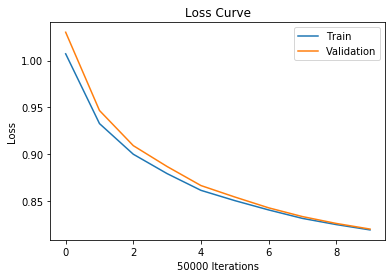

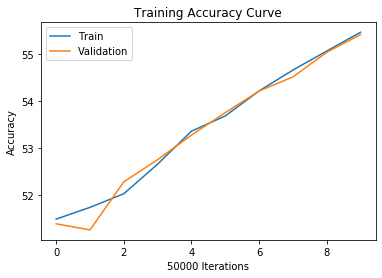

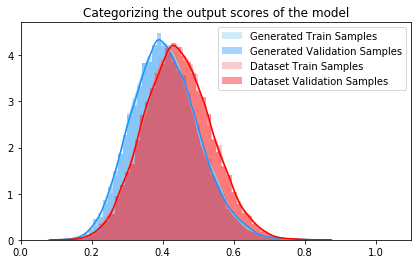

 10%|█         | 49997/491198 [03:30<30:40, 239.69it/s]

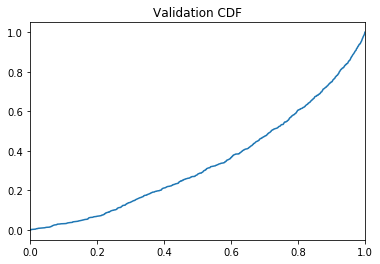

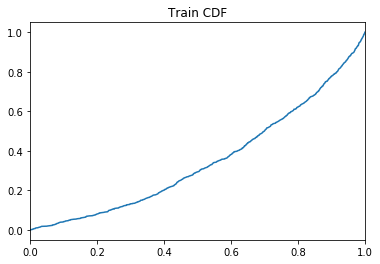

 10%|█         | 50036/491198 [04:12<492:12:09,  4.02s/it]

Training Accuracy at epoch 0: 55.458
Validation Accuracy epoch 0: 55.408
Training AUC at epoch 0: 0.35014545454545454
Validation AUC epoch 0: 0.3393190909090909
Train: Sensitivity: 0.6239653875094056 Specificity: 0.4641587075797602
Val: Sensitivity: 0.6269367183124883 Specificity: 0.46578933971389297


 20%|██        | 99971/491198 [07:20<27:40, 235.59it/s]   

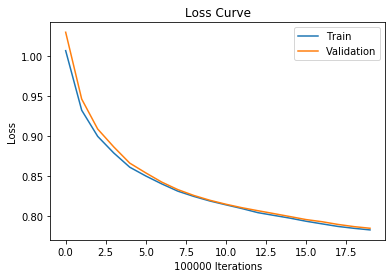

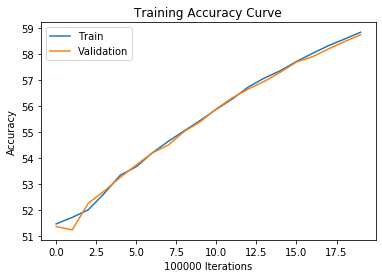

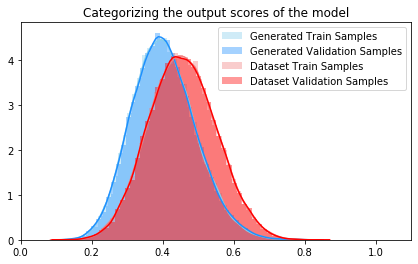

 20%|██        | 99971/491198 [07:40<27:40, 235.59it/s]

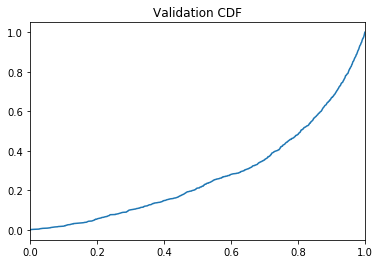

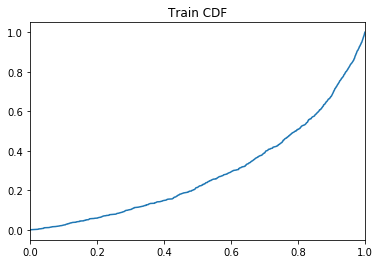

 20%|██        | 100032/491198 [08:19<46:01:03,  2.36it/s]

Training Accuracy at epoch 0: 58.842
Validation Accuracy epoch 0: 58.746
Training AUC at epoch 0: 0.28926427272727273
Validation AUC epoch 0: 0.278529
Train: Sensitivity: 0.6926327713152964 Specificity: 0.4426259296273703
Val: Sensitivity: 0.6931984502798106 Specificity: 0.4445356258955321


 31%|███       | 149996/491198 [11:25<20:47, 273.57it/s]  

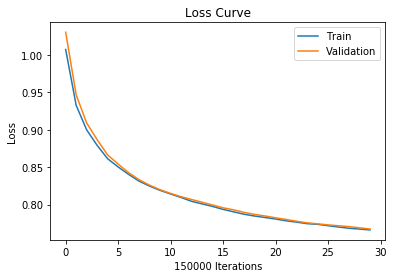

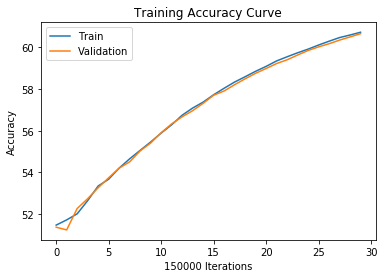

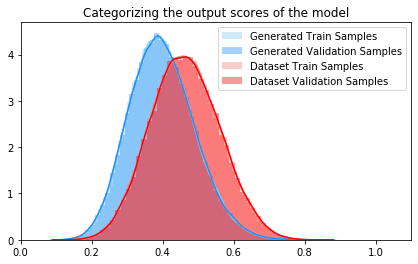

 31%|███       | 149996/491198 [11:41<20:47, 273.57it/s]

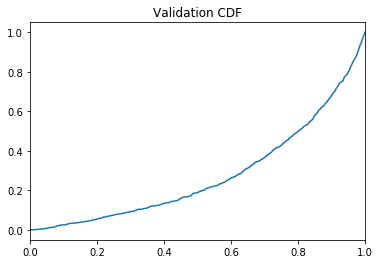

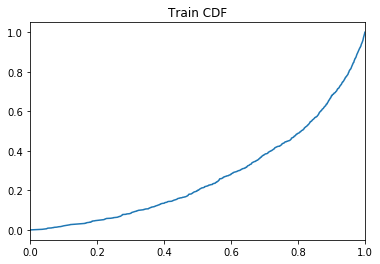

 31%|███       | 150016/491198 [12:23<290:06:48,  3.06s/it]

Training Accuracy at epoch 0: 60.712
Validation Accuracy epoch 0: 60.64266666666666
Training AUC at epoch 0: 0.2754472727272727
Validation AUC epoch 0: 0.27592581818181816
Train: Sensitivity: 0.7213534496999064 Specificity: 0.429379475360228
Val: Sensitivity: 0.7212787485984631 Specificity: 0.43059779781897684


 41%|████      | 199972/491198 [15:40<18:58, 255.73it/s]   

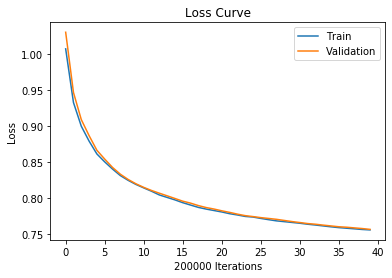

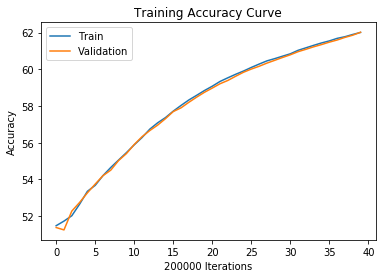

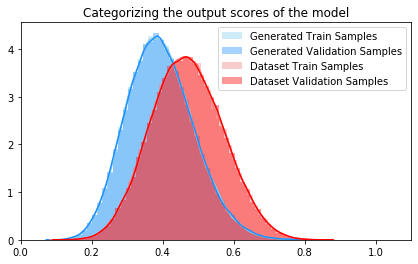

 41%|████      | 199972/491198 [15:51<18:58, 255.73it/s]

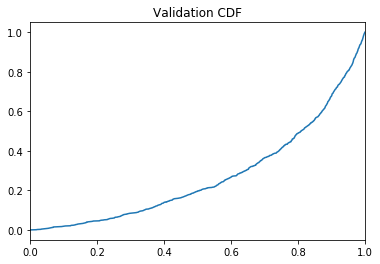

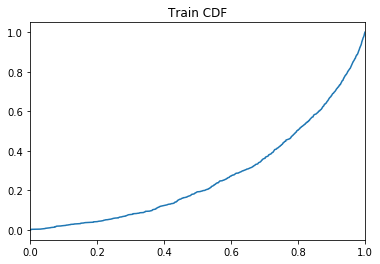

 41%|████      | 200036/491198 [16:37<34:58:33,  2.31it/s]

Training Accuracy at epoch 0: 62.0065
Validation Accuracy epoch 0: 62.0175
Training AUC at epoch 0: 0.27215118181818176
Validation AUC epoch 0: 0.2712520909090909
Train: Sensitivity: 0.7380702829908834 Specificity: 0.4198670976290378
Val: Sensitivity: 0.7389210019267822 Specificity: 0.42032211777011896


 51%|█████     | 249986/491198 [19:34<17:11, 233.95it/s]  

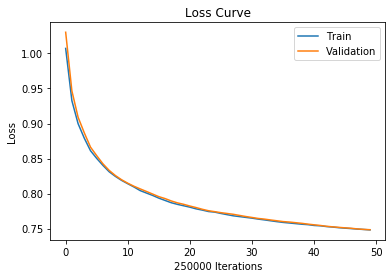

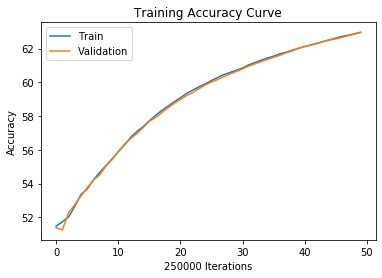

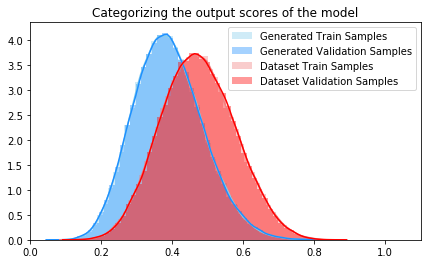

 51%|█████     | 249986/491198 [19:52<17:11, 233.95it/s]

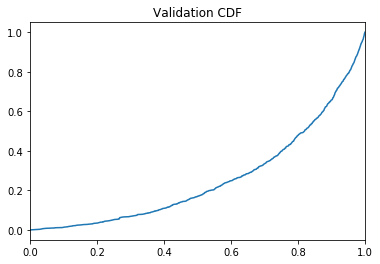

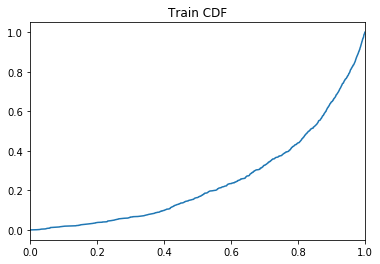

 51%|█████     | 250034/491198 [20:31<56:32:09,  1.18it/s]

Training Accuracy at epoch 0: 62.964
Validation Accuracy epoch 0: 62.936
Training AUC at epoch 0: 0.24827218181818184
Validation AUC epoch 0: 0.2570784545454545
Train: Sensitivity: 0.7493052890151224 Specificity: 0.4125226516647283
Val: Sensitivity: 0.7507801982621466 Specificity: 0.413628190129555


 61%|██████    | 299993/491198 [23:45<15:18, 208.14it/s]  

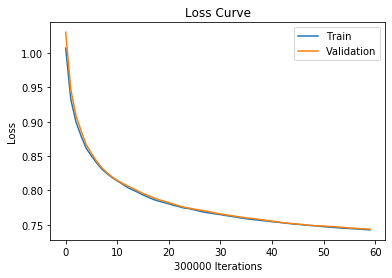

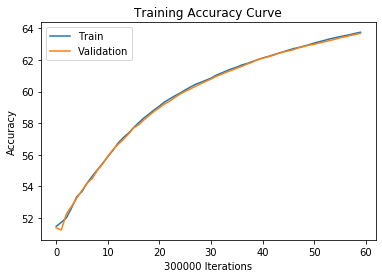

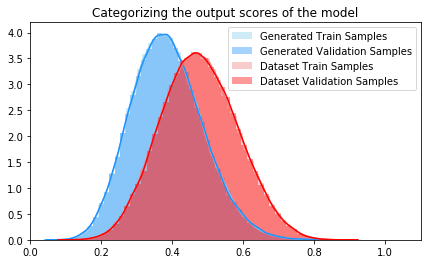

 61%|██████    | 299993/491198 [24:02<15:18, 208.14it/s]

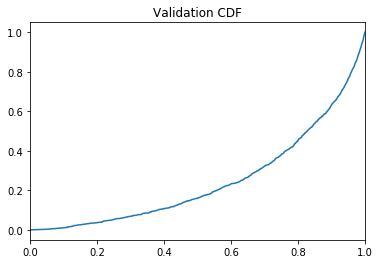

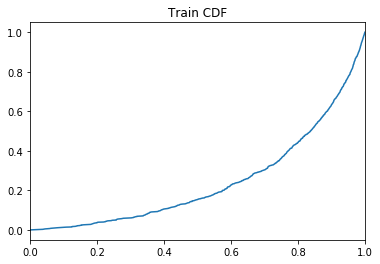

 61%|██████    | 300032/491198 [24:42<91:25:16,  1.72s/it] 

Training Accuracy at epoch 0: 63.751666666666665
Validation Accuracy epoch 0: 63.68633333333333
Training AUC at epoch 0: 0.242421
Validation AUC epoch 0: 0.24678609090909093
Train: Sensitivity: 0.7576345128453709 Specificity: 0.40650350956304687
Val: Sensitivity: 0.7574664335924425 Specificity: 0.4074879524389188


 71%|███████▏  | 349982/491198 [27:56<09:25, 249.57it/s]  

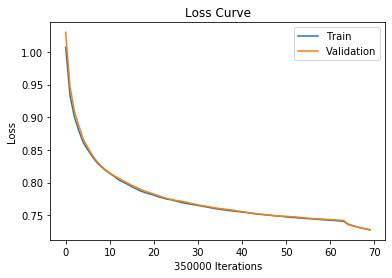

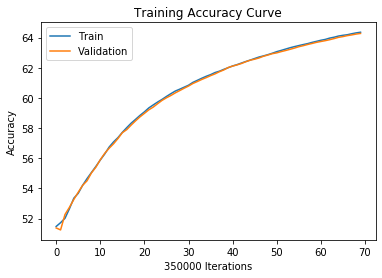

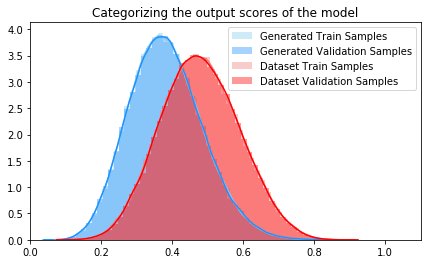

 71%|███████▏  | 349982/491198 [28:12<09:25, 249.57it/s]

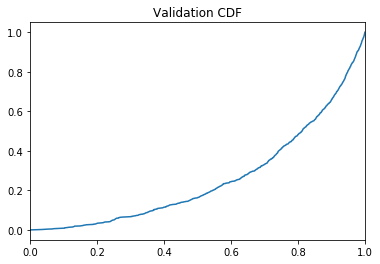

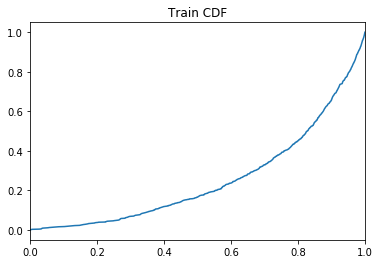

 71%|███████▏  | 350016/491198 [28:53<26:36:34,  1.47it/s]

Training Accuracy at epoch 0: 64.35685714285714
Validation Accuracy epoch 0: 64.278
Training AUC at epoch 0: 0.2541878181818182
Validation AUC epoch 0: 0.2574190909090909
Train: Sensitivity: 0.763007474717866 Specificity: 0.40126454939130296
Val: Sensitivity: 0.7641414984148173 Specificity: 0.4030152058934643


 81%|████████▏ | 399979/491198 [32:19<05:34, 272.77it/s]  

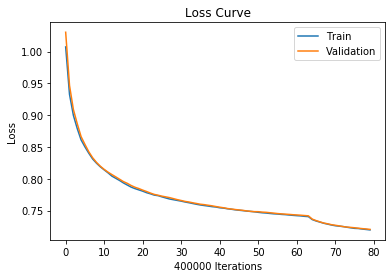

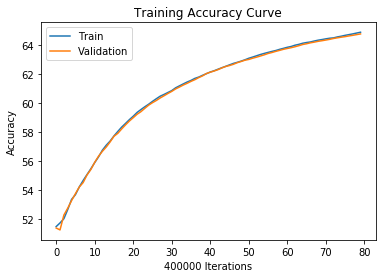

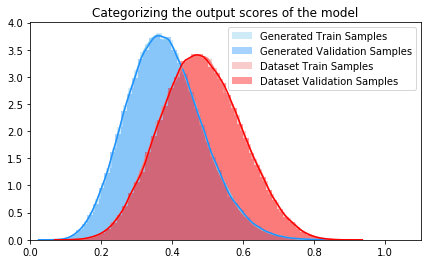

 81%|████████▏ | 399979/491198 [32:33<05:34, 272.77it/s]

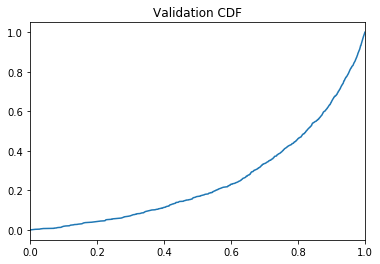

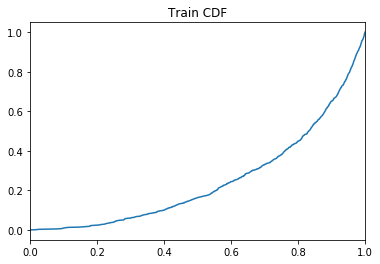

 81%|████████▏ | 400034/491198 [33:19<15:18:43,  1.65it/s]

Training Accuracy at epoch 0: 64.8605
Validation Accuracy epoch 0: 64.74375
Training AUC at epoch 0: 0.24806127272727274
Validation AUC epoch 0: 0.25456972727272725
Train: Sensitivity: 0.7675127999784043 Specificity: 0.39714124493278913
Val: Sensitivity: 0.767606771628099 Specificity: 0.39895146815249105


 92%|█████████▏| 449987/491198 [36:51<03:19, 206.98it/s]  

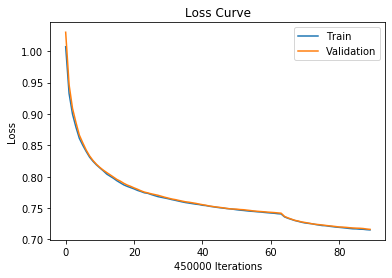

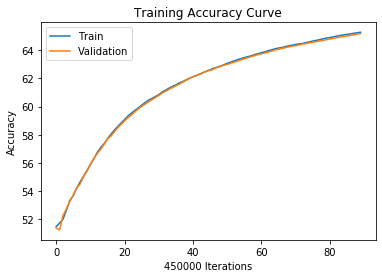

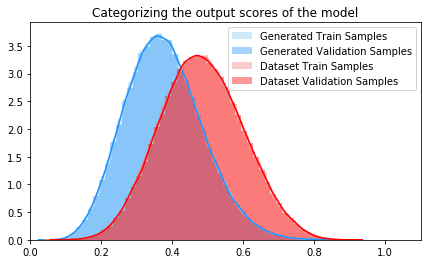

 92%|█████████▏| 449987/491198 [37:03<03:19, 206.98it/s]

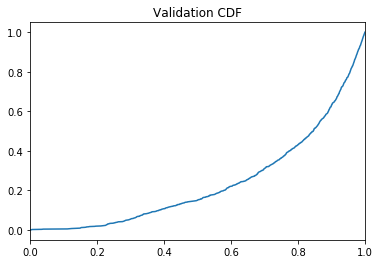

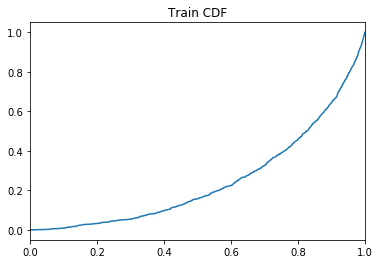

 92%|█████████▏| 450032/491198 [37:52<11:19:11,  1.01it/s]

Training Accuracy at epoch 0: 65.27555555555556
Validation Accuracy epoch 0: 65.17933333333333
Training AUC at epoch 0: 0.24743136363636364
Validation AUC epoch 0: 0.23838054545454548
Train: Sensitivity: 0.7709245195227167 Specificity: 0.39360579704763937
Val: Sensitivity: 0.7714344049881422 Specificity: 0.39542487711446794


  0%|          | 33/491198 [00:00<24:56, 328.29it/s]

Saving to:  model_checkpoints/binary/BlosumLinearNet/07292020.pth
Starting epoch: 1  with learning rate:  [0.0005]


  2%|▏         | 8788/491198 [00:34<32:48, 245.01it/s]

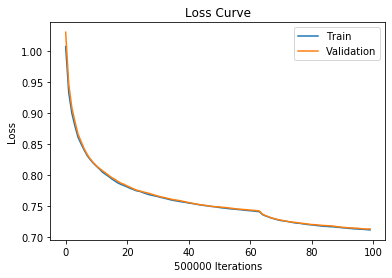

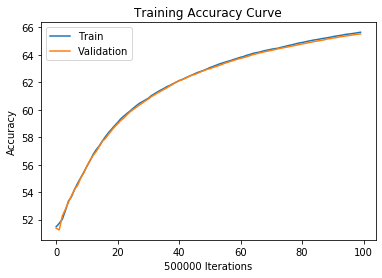

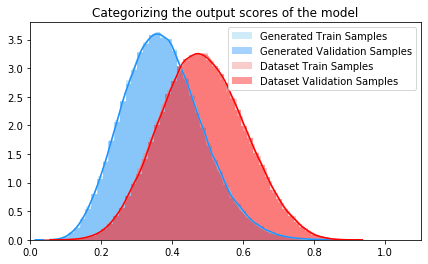

  2%|▏         | 8788/491198 [00:50<32:48, 245.01it/s]

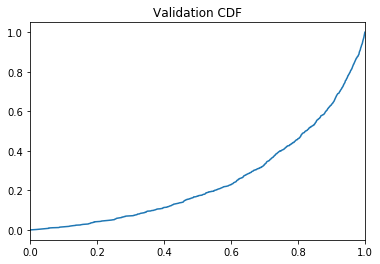

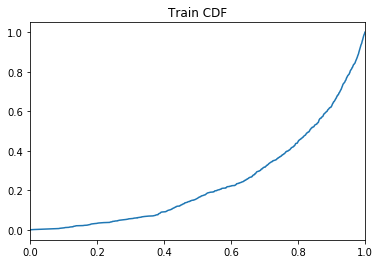

  2%|▏         | 8834/491198 [01:33<119:02:46,  1.13it/s]

Training Accuracy at epoch 1: 65.644
Validation Accuracy epoch 1: 65.5188
Training AUC at epoch 1: 0.2423370909090909
Validation AUC epoch 1: 0.25342290909090914
Train: Sensitivity: 0.7737142215106317 Specificity: 0.3902616360361973
Val: Sensitivity: 0.7742203655060639 Specificity: 0.3925589033111395


 22%|██▏       | 108781/491198 [08:59<24:43, 257.76it/s] 

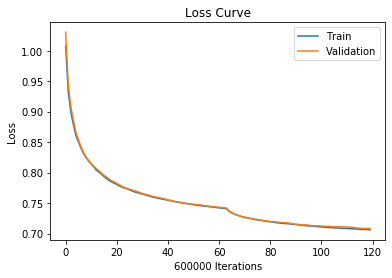

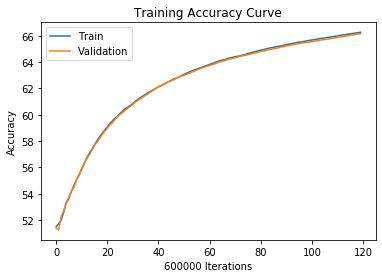

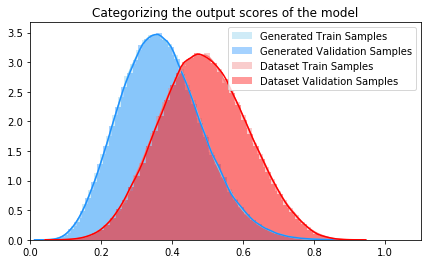

 22%|██▏       | 108781/491198 [09:10<24:43, 257.76it/s]

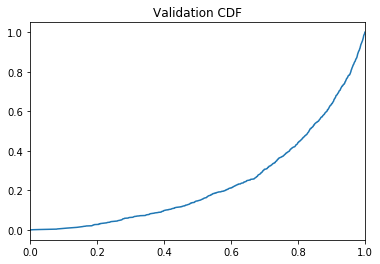

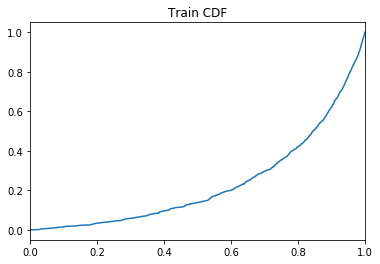

 22%|██▏       | 108848/491198 [09:58<62:59:04,  1.69it/s]

Training Accuracy at epoch 1: 66.26416666666667
Validation Accuracy epoch 1: 66.14416666666666
Training AUC at epoch 1: 0.23362209090909092
Validation AUC epoch 1: 0.23886036363636365
Train: Sensitivity: 0.7785529109461649 Specificity: 0.38498529145493493
Val: Sensitivity: 0.778770275882865 Specificity: 0.3871680216482768


 32%|███▏      | 158786/491198 [13:23<25:04, 220.92it/s]  

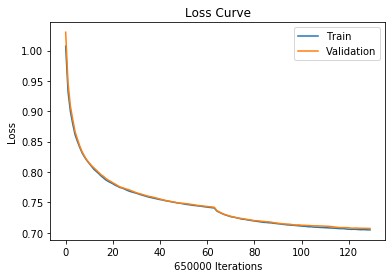

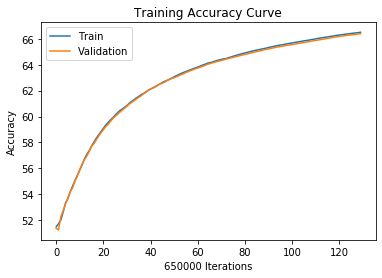

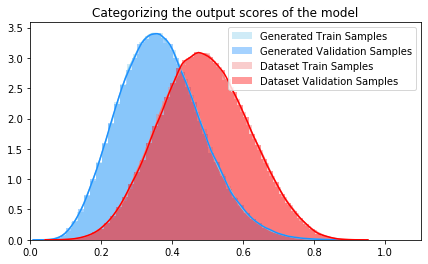

 32%|███▏      | 158786/491198 [13:41<25:04, 220.92it/s]

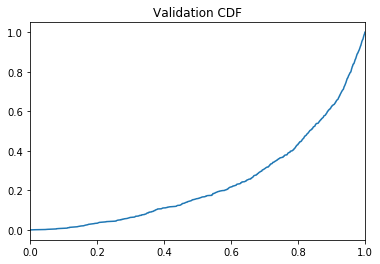

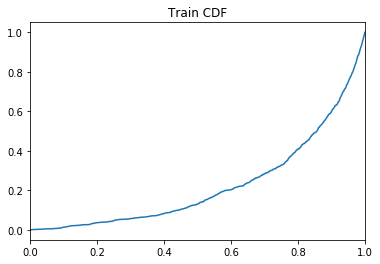

 32%|███▏      | 158831/491198 [14:22<72:08:04,  1.28it/s] 

Training Accuracy at epoch 1: 66.50138461538461
Validation Accuracy epoch 1: 66.394
Training AUC at epoch 1: 0.225835
Validation AUC epoch 1: 0.24062645454545456
Train: Sensitivity: 0.7801643376772911 Specificity: 0.38292767960255375
Val: Sensitivity: 0.7801180364726455 Specificity: 0.384815313111546


 43%|████▎     | 208784/491198 [17:28<18:59, 247.80it/s]  

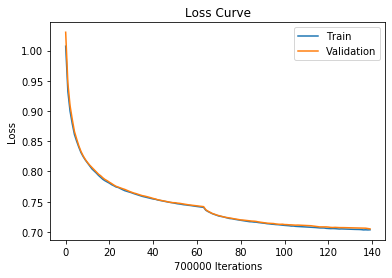

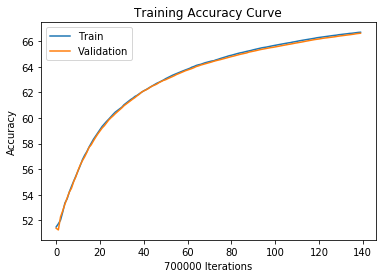

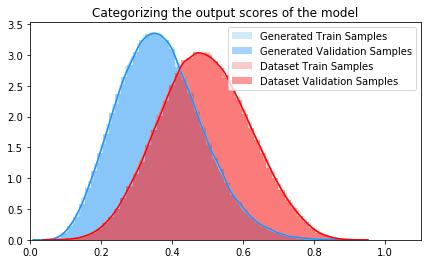

 43%|████▎     | 208784/491198 [17:41<18:59, 247.80it/s]

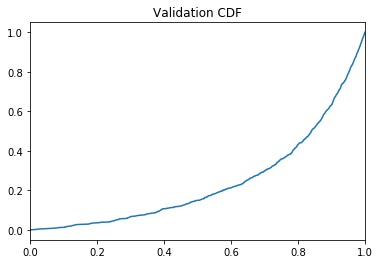

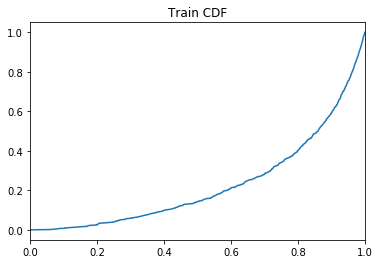

 43%|████▎     | 208834/491198 [18:29<55:52:36,  1.40it/s]

Training Accuracy at epoch 1: 66.69814285714286
Validation Accuracy epoch 1: 66.62185714285714
Training AUC at epoch 1: 0.2279360909090909
Validation AUC epoch 1: 0.24043263636363635
Train: Sensitivity: 0.7813435678365308 Specificity: 0.38116959705398124
Val: Sensitivity: 0.7820091262917729 Specificity: 0.38294408309793804


 53%|█████▎    | 258774/491198 [21:43<17:01, 227.50it/s]  

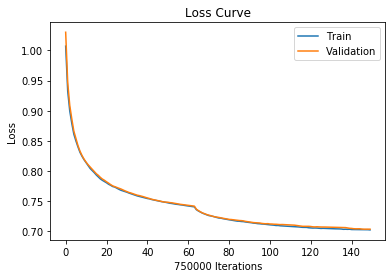

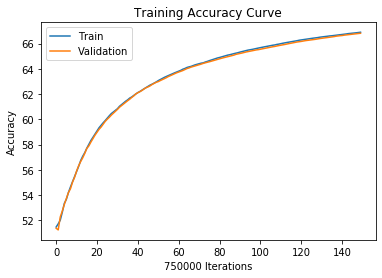

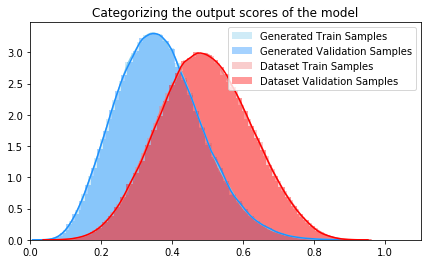

 53%|█████▎    | 258774/491198 [22:01<17:01, 227.50it/s]

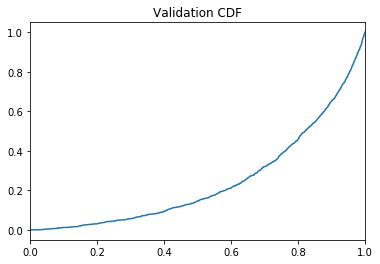

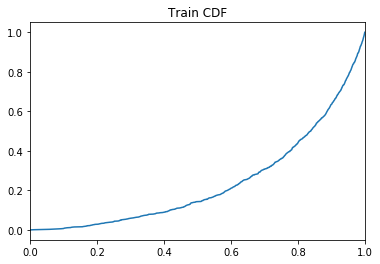

 53%|█████▎    | 258818/491198 [22:44<29:58:40,  2.15it/s]

Training Accuracy at epoch 1: 66.89493333333333
Validation Accuracy epoch 1: 66.8148
Training AUC at epoch 1: 0.23709400000000003
Validation AUC epoch 1: 0.2438530909090909
Train: Sensitivity: 0.7827763725902026 Specificity: 0.3794548349948501
Val: Sensitivity: 0.7832591130903176 Specificity: 0.38118721356815505


 63%|██████▎   | 308794/491198 [25:59<11:10, 272.02it/s]  

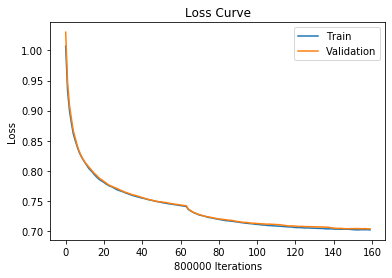

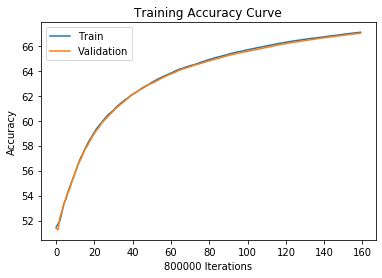

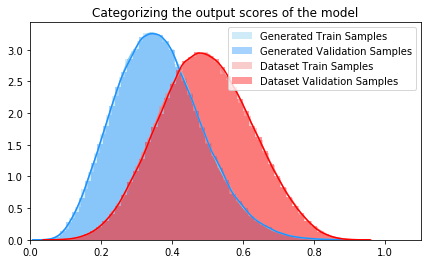

 63%|██████▎   | 308794/491198 [26:12<11:10, 272.02it/s]

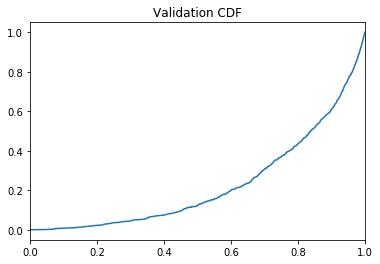

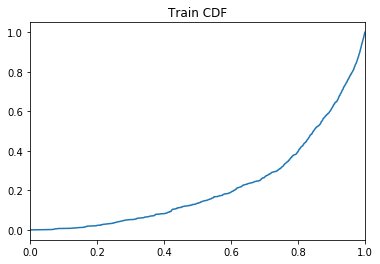

 63%|██████▎   | 308830/491198 [27:01<81:26:04,  1.61s/it] 

Training Accuracy at epoch 1: 67.084375
Validation Accuracy epoch 1: 67.001125
Training AUC at epoch 1: 0.22276754545454547
Validation AUC epoch 1: 0.22789345454545454
Train: Sensitivity: 0.7840173953534783 Specificity: 0.37781066569432825
Val: Sensitivity: 0.7841443393612578 Specificity: 0.37943426952905956


 73%|███████▎  | 358786/491198 [30:06<08:59, 245.39it/s]  

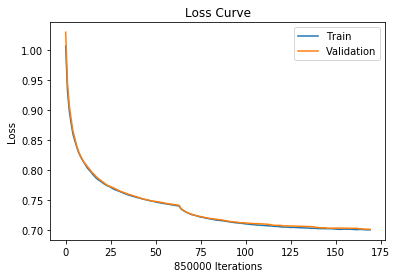

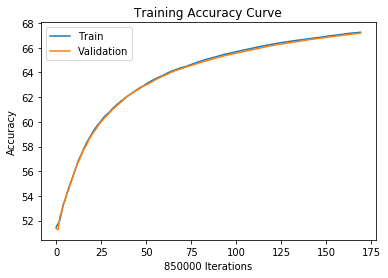

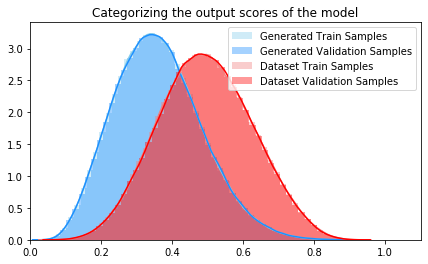

 73%|███████▎  | 358786/491198 [30:22<08:59, 245.39it/s]

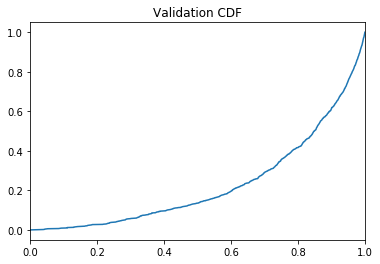

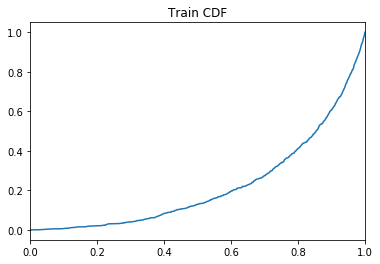

 73%|███████▎  | 358839/491198 [31:08<29:44:57,  1.24it/s]

Training Accuracy at epoch 1: 67.25235294117647
Validation Accuracy epoch 1: 67.18035294117647
Training AUC at epoch 1: 0.22132263636363636
Validation AUC epoch 1: 0.22878309090909094
Train: Sensitivity: 0.7850274457896991 Specificity: 0.3761991468986563
Val: Sensitivity: 0.7857134563806443 Specificity: 0.37794552894862726


 83%|████████▎ | 408775/491198 [34:24<05:47, 236.99it/s]  

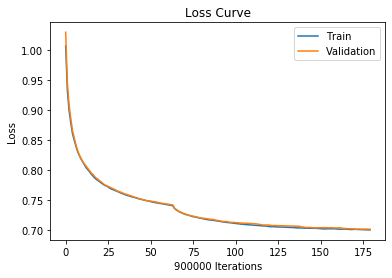

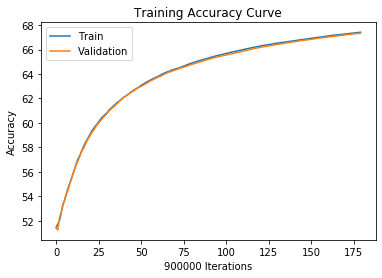

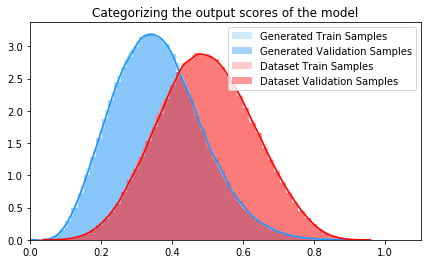

 83%|████████▎ | 408775/491198 [34:43<05:47, 236.99it/s]

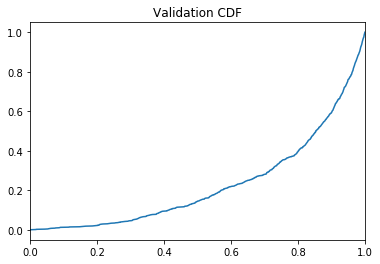

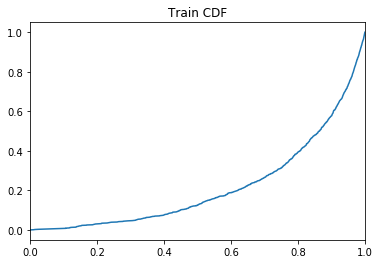

 83%|████████▎ | 408834/491198 [35:25<10:50:15,  2.11it/s]

Training Accuracy at epoch 1: 67.41255555555556
Validation Accuracy epoch 1: 67.33633333333333
Training AUC at epoch 1: 0.21637036363636364
Validation AUC epoch 1: 0.22788009090909092
Train: Sensitivity: 0.786097273731411 Specificity: 0.37473387531799307
Val: Sensitivity: 0.7864889528774873 Specificity: 0.37642471169739705


 93%|█████████▎| 458773/491198 [38:31<02:04, 260.75it/s]  

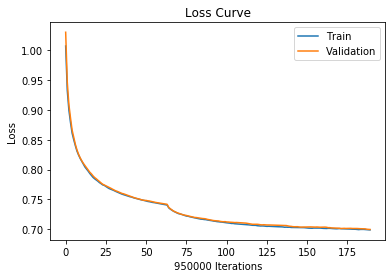

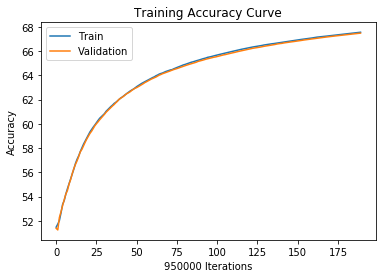

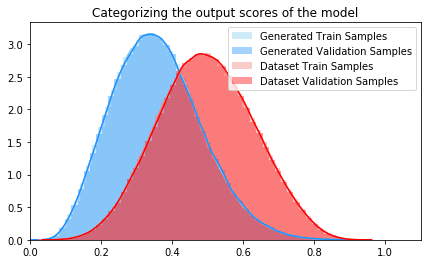

 93%|█████████▎| 458773/491198 [38:43<02:04, 260.75it/s]

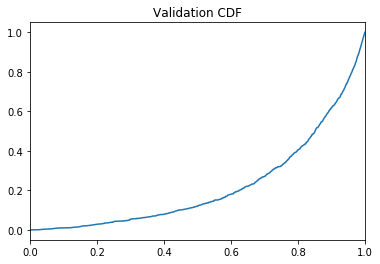

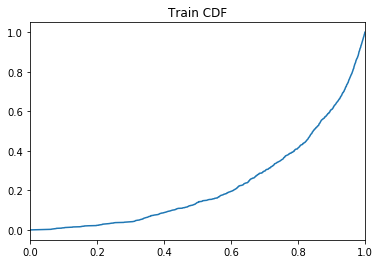

 93%|█████████▎| 458818/491198 [39:33<4:02:40,  2.22it/s]

Training Accuracy at epoch 1: 67.55547368421053
Validation Accuracy epoch 1: 67.48136842105264
Training AUC at epoch 1: 0.22692672727272728
Validation AUC epoch 1: 0.2207760909090909
Train: Sensitivity: 0.7869891668362402 Specificity: 0.3733950249751158
Val: Sensitivity: 0.7875621038204557 Specificity: 0.37518346881410014


  0%|          | 46/491198 [00:00<17:52, 457.98it/s]

Saving to:  model_checkpoints/binary/BlosumLinearNet/07292020.pth
Starting epoch: 2  with learning rate:  [0.0005]


  4%|▎         | 17600/491198 [00:56<30:23, 259.69it/s]

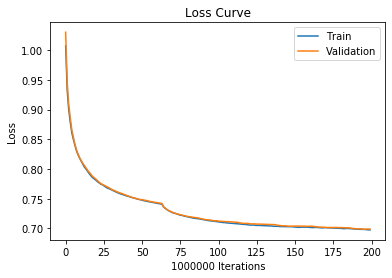

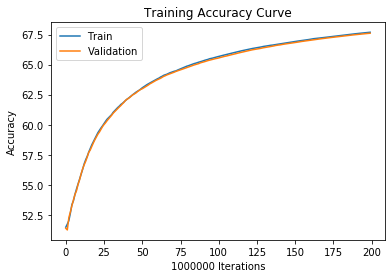

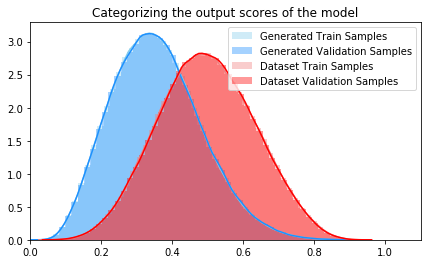

  4%|▎         | 17600/491198 [01:10<30:23, 259.69it/s]

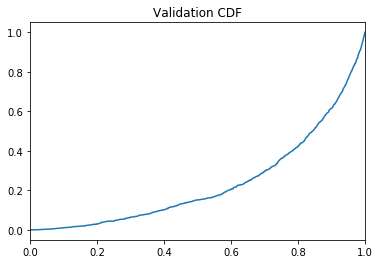

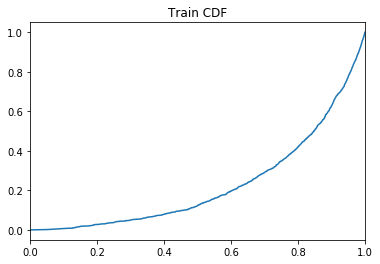

  4%|▎         | 17631/491198 [01:59<437:47:03,  3.33s/it]

Training Accuracy at epoch 2: 67.6885
Validation Accuracy epoch 2: 67.6064
Training AUC at epoch 2: 0.22682863636363637
Validation AUC epoch 2: 0.23503972727272726
Train: Sensitivity: 0.7877223253280451 Specificity: 0.3721212960278969
Val: Sensitivity: 0.7883049616885558 Specificity: 0.37401587329133623


 14%|█▍        | 67602/491198 [05:16<30:34, 230.96it/s]   

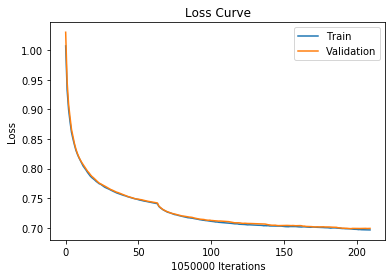

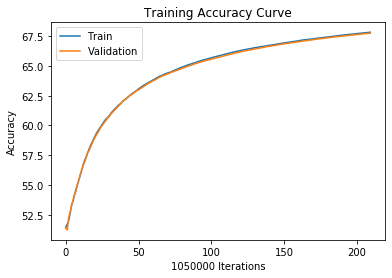

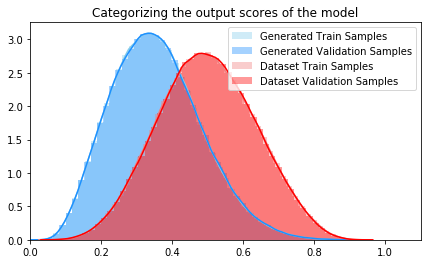

 14%|█▍        | 67602/491198 [05:30<30:34, 230.96it/s]

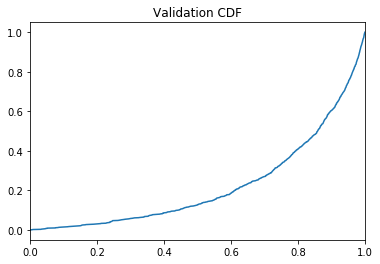

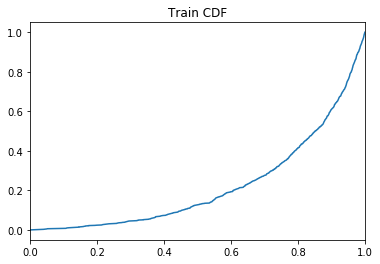

 14%|█▍        | 67641/491198 [06:19<769:52:16,  6.54s/it] 

Training Accuracy at epoch 2: 67.81438095238096
Validation Accuracy epoch 2: 67.73333333333333
Training AUC at epoch 2: 0.22131445454545456
Validation AUC epoch 2: 0.22298063636363638
Train: Sensitivity: 0.7885213099240135 Specificity: 0.37097211461316476
Val: Sensitivity: 0.7889609990535541 Specificity: 0.37280215078694734


 24%|██▍       | 117590/491198 [09:27<23:16, 267.59it/s]  

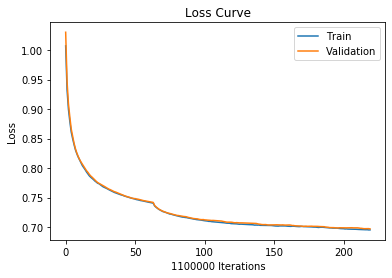

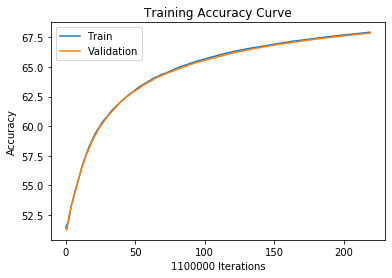

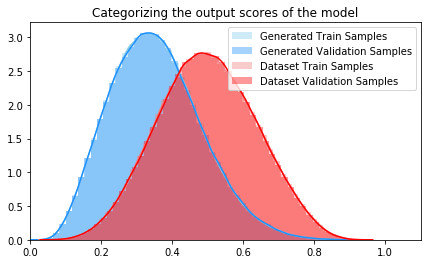

 24%|██▍       | 117590/491198 [09:40<23:16, 267.59it/s]

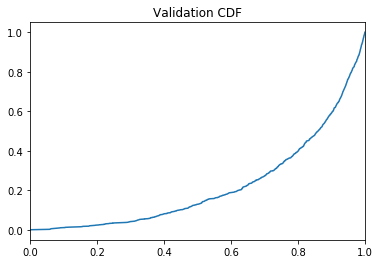

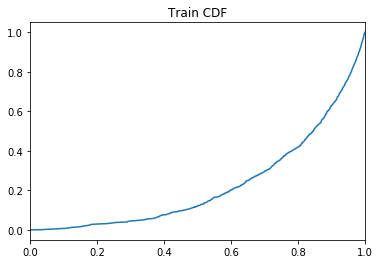

 24%|██▍       | 117636/491198 [10:29<97:55:17,  1.06it/s] 

Training Accuracy at epoch 2: 67.92936363636363
Validation Accuracy epoch 2: 67.86136363636363
Training AUC at epoch 2: 0.2275569090909091
Validation AUC epoch 2: 0.21950190909090908
Train: Sensitivity: 0.7892072116571993 Specificity: 0.36990251143595604
Val: Sensitivity: 0.7899093152645337 Specificity: 0.37168577292916494


 34%|███▍      | 167603/491198 [13:35<18:46, 287.38it/s]  

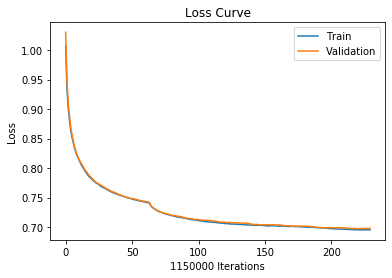

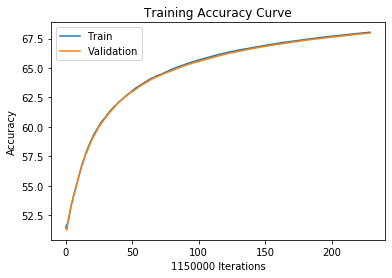

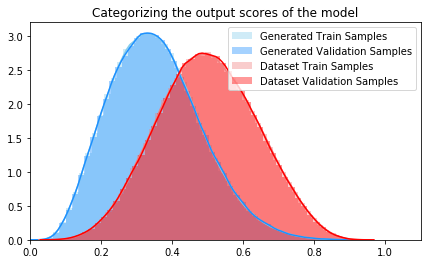

 34%|███▍      | 167603/491198 [13:51<18:46, 287.38it/s]

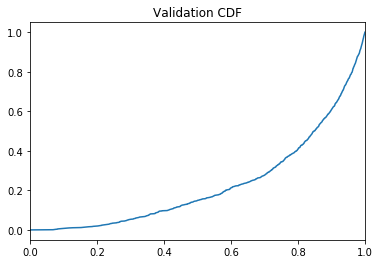

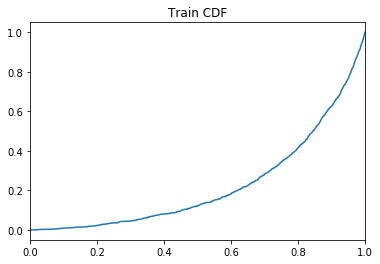

 34%|███▍      | 167620/491198 [14:39<1194:08:59, 13.29s/it]

Training Accuracy at epoch 2: 68.03834782608696
Validation Accuracy epoch 2: 67.97278260869565
Training AUC at epoch 2: 0.22362872727272726
Validation AUC epoch 2: 0.2283498181818182
Train: Sensitivity: 0.7898301572990922 Specificity: 0.36891905868226615
Val: Sensitivity: 0.7902383402397308 Specificity: 0.370543881178599


 44%|████▍     | 217593/491198 [17:47<16:58, 268.67it/s]    

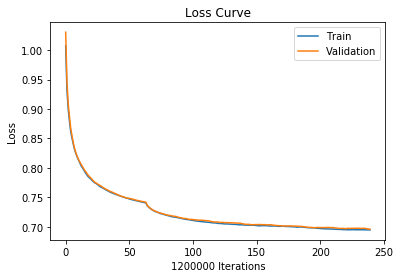

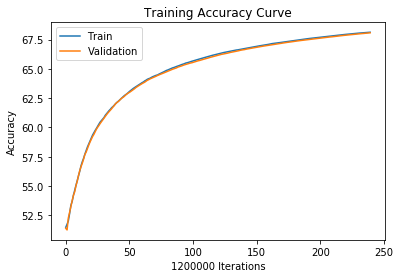

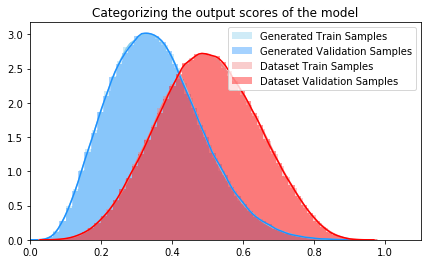

 44%|████▍     | 217593/491198 [18:01<16:58, 268.67it/s]

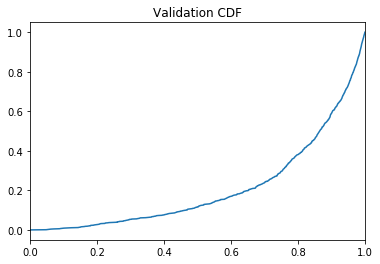

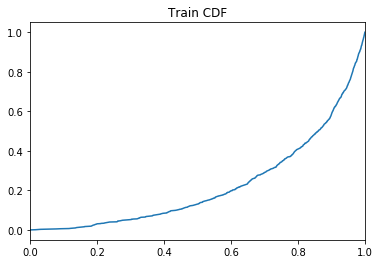

 44%|████▍     | 217638/491198 [18:50<91:37:19,  1.21s/it] 

Training Accuracy at epoch 2: 68.12208333333334
Validation Accuracy epoch 2: 68.07483333333333
Training AUC at epoch 2: 0.22304290909090907
Validation AUC epoch 2: 0.20900181818181818
Train: Sensitivity: 0.7902710683849845 Specificity: 0.36812742541875165
Val: Sensitivity: 0.7911565800837043 Specificity: 0.3696955716757216


 54%|█████▍    | 267586/491198 [21:56<13:44, 271.05it/s]  

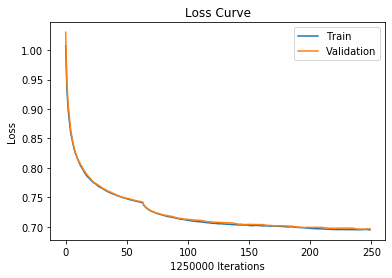

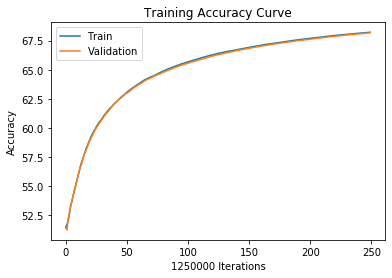

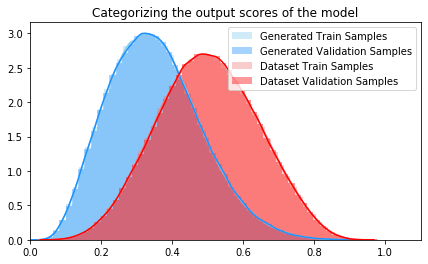

 54%|█████▍    | 267586/491198 [22:12<13:44, 271.05it/s]

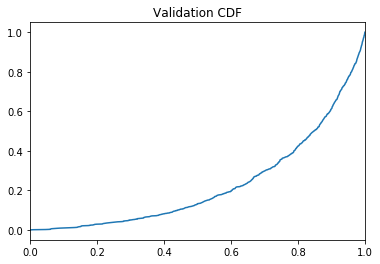

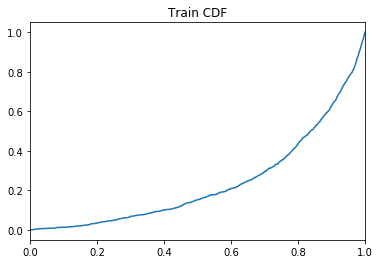

 54%|█████▍    | 267636/491198 [23:03<48:50:43,  1.27it/s]

Training Accuracy at epoch 2: 68.21792
Validation Accuracy epoch 2: 68.16912
Training AUC at epoch 2: 0.23747072727272728
Validation AUC epoch 2: 0.228082
Train: Sensitivity: 0.7908966689013874 Specificity: 0.367270407985121
Val: Sensitivity: 0.7915235026226976 Specificity: 0.36876657886871406


 65%|██████▍   | 317600/491198 [26:17<11:48, 244.85it/s]  

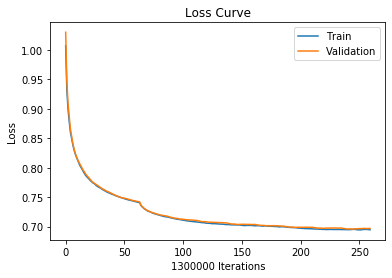

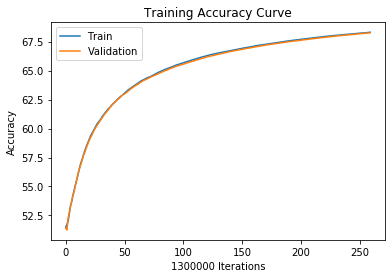

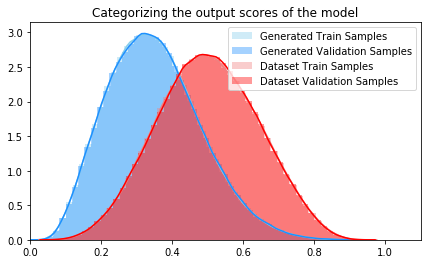

 65%|██████▍   | 317600/491198 [26:32<11:48, 244.85it/s]

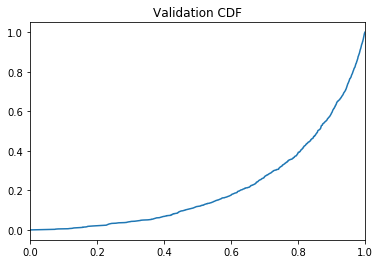

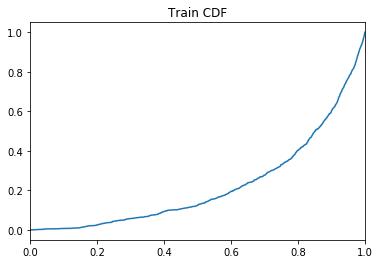

 65%|██████▍   | 317636/491198 [27:22<162:28:43,  3.37s/it]

Training Accuracy at epoch 2: 68.31053846153846
Validation Accuracy epoch 2: 68.26184615384615
Training AUC at epoch 2: 0.22318990909090908
Validation AUC epoch 2: 0.21224972727272728
Train: Sensitivity: 0.7914610498652919 Specificity: 0.36644206075457275
Val: Sensitivity: 0.7920135218731886 Specificity: 0.3678837336379561


 75%|███████▍  | 367591/491198 [30:37<08:05, 254.56it/s]   

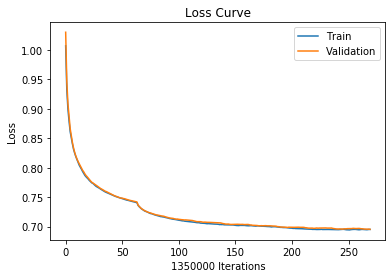

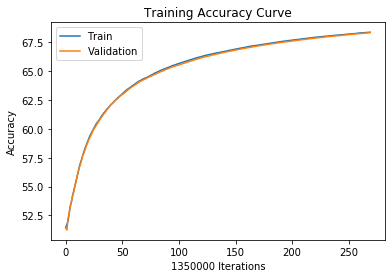

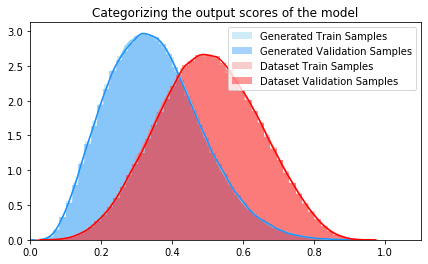

 75%|███████▍  | 367591/491198 [30:53<08:05, 254.56it/s]

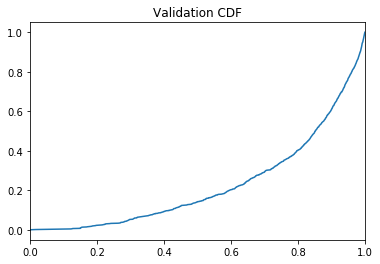

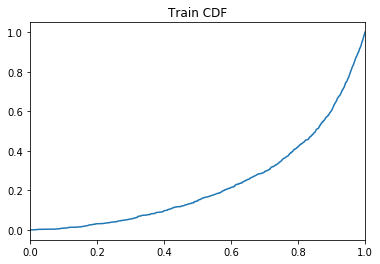

 75%|███████▍  | 367620/491198 [31:42<35:50:13,  1.04s/it]

Training Accuracy at epoch 2: 68.38392592592592
Validation Accuracy epoch 2: 68.34437037037037
Training AUC at epoch 2: 0.2331069090909091
Validation AUC epoch 2: 0.2270710909090909
Train: Sensitivity: 0.7917690374282423 Specificity: 0.36566823089831124
Val: Sensitivity: 0.7926687191196287 Specificity: 0.3671651433427566


 85%|████████▌ | 417578/491198 [34:39<04:39, 263.29it/s]  

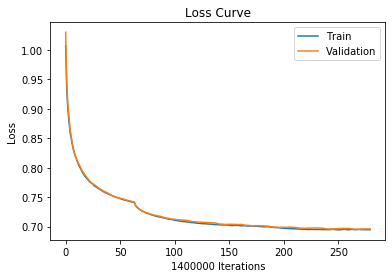

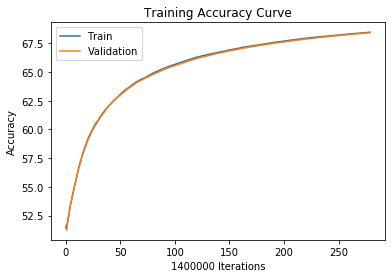

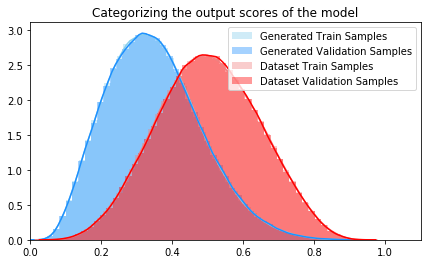

 85%|████████▌ | 417578/491198 [34:53<04:39, 263.29it/s]

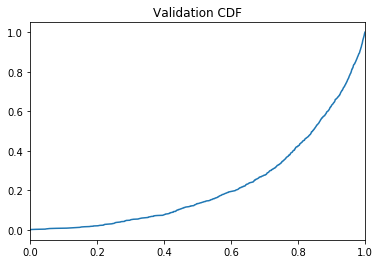

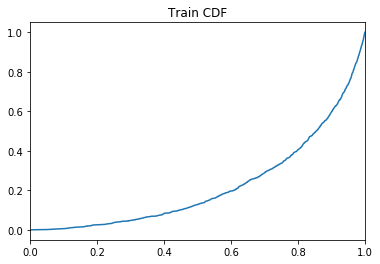

 85%|████████▌ | 417638/491198 [35:45<10:47:11,  1.89it/s]

Training Accuracy at epoch 2: 68.46778571428571
Validation Accuracy epoch 2: 68.42092857142858
Training AUC at epoch 2: 0.2221957272727273
Validation AUC epoch 2: 0.2260467272727273
Train: Sensitivity: 0.7922766171002875 Specificity: 0.36486101650360564
Val: Sensitivity: 0.7929028151686695 Specificity: 0.3663762739788543


 95%|█████████▌| 467595/491198 [38:58<01:35, 246.72it/s]  

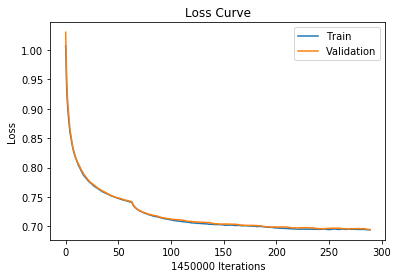

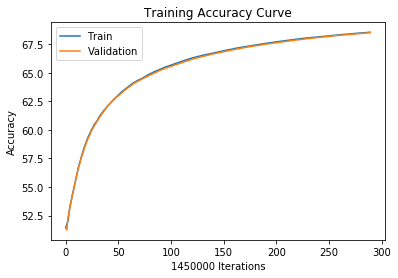

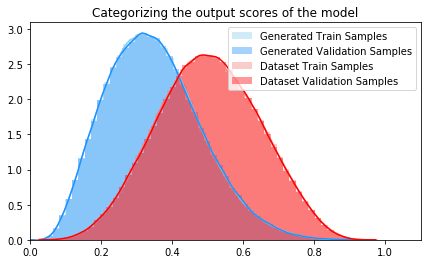

 95%|█████████▌| 467595/491198 [39:14<01:35, 246.72it/s]

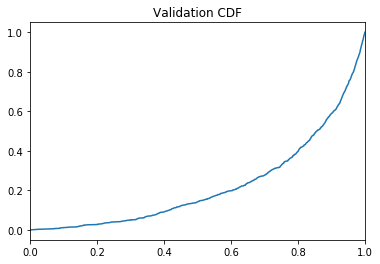

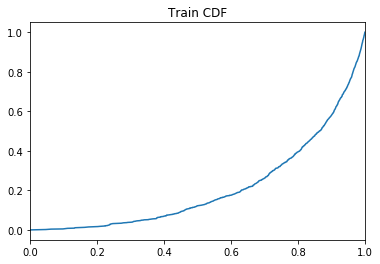

 95%|█████████▌| 467634/491198 [40:04<10:10:38,  1.55s/it]

Training Accuracy at epoch 2: 68.53827586206897
Validation Accuracy epoch 2: 68.49475862068965
Training AUC at epoch 2: 0.2117961818181818
Validation AUC epoch 2: 0.22345163636363635
Train: Sensitivity: 0.792666717592239 Specificity: 0.36417880350670234
Val: Sensitivity: 0.7934464016082875 Specificity: 0.3657246980193061


  0%|          | 27/491198 [00:00<30:35, 267.61it/s]

Saving to:  model_checkpoints/binary/BlosumLinearNet/07292020.pth
Starting epoch: 3  with learning rate:  [0.0005]


  5%|▌         | 26383/491198 [01:39<31:03, 249.48it/s]

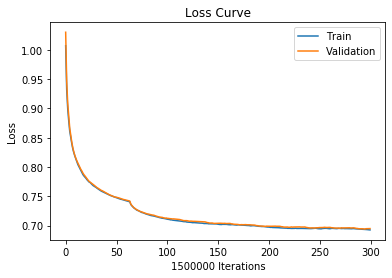

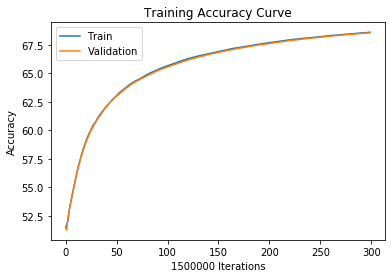

  5%|▌         | 26383/491198 [01:50<31:03, 249.48it/s]

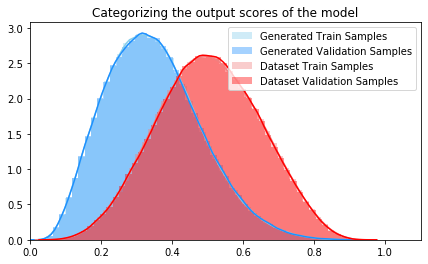

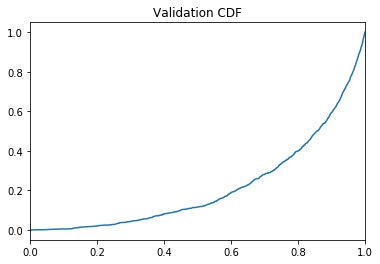

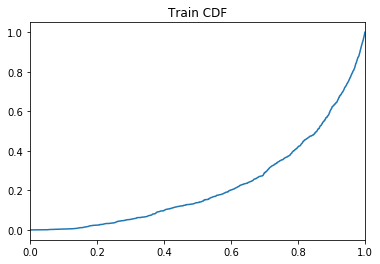

  5%|▌         | 26438/491198 [02:45<79:06:07,  1.63it/s] 

Training Accuracy at epoch 3: 68.61253333333333
Validation Accuracy epoch 3: 68.5594
Training AUC at epoch 3: 0.2276290909090909
Validation AUC epoch 3: 0.21635727272727273
Train: Sensitivity: 0.7930567016385712 Specificity: 0.36343555600652516
Val: Sensitivity: 0.7936999089062905 Specificity: 0.36506581343526157


 16%|█▌        | 76377/491198 [06:00<28:35, 241.86it/s]  

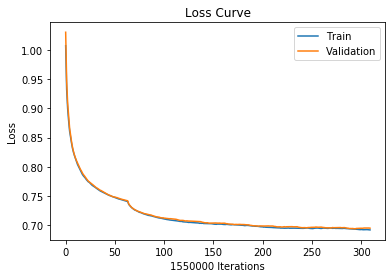

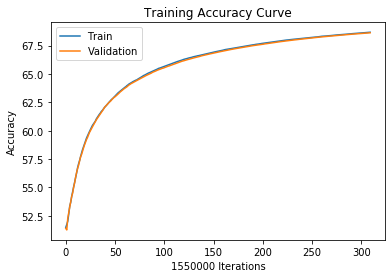

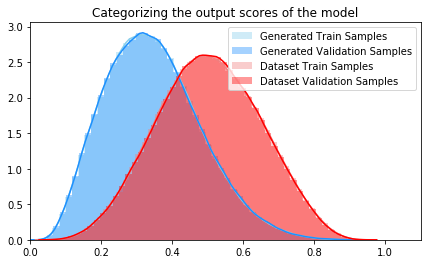

 16%|█▌        | 76377/491198 [06:20<28:35, 241.86it/s]

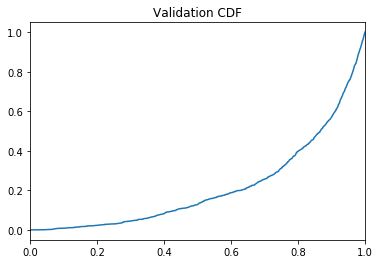

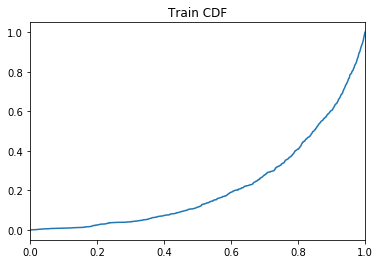

 16%|█▌        | 76422/491198 [07:06<55:28:27,  2.08it/s]

Training Accuracy at epoch 3: 68.67858064516129
Validation Accuracy epoch 3: 68.63096774193548
Training AUC at epoch 3: 0.2193089090909091
Validation AUC epoch 3: 0.21474563636363636
Train: Sensitivity: 0.7934279740824947 Specificity: 0.3628319671627484
Val: Sensitivity: 0.7940944492745146 Specificity: 0.3643730264649333


 26%|██▌       | 126396/491198 [10:20<23:11, 262.19it/s] 

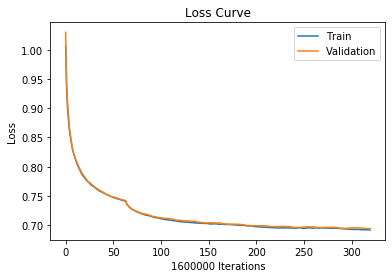

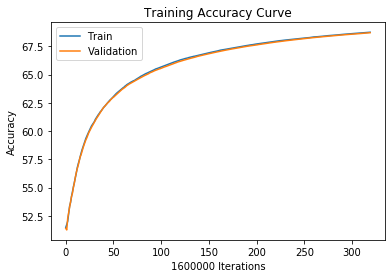

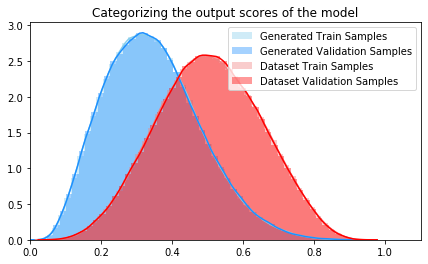

 26%|██▌       | 126396/491198 [10:40<23:11, 262.19it/s]

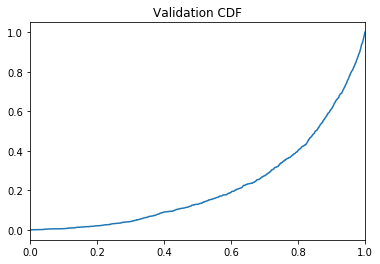

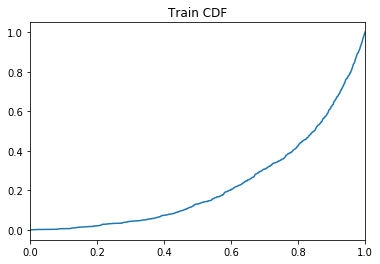

 26%|██▌       | 126443/491198 [11:27<142:10:18,  1.40s/it]

Training Accuracy at epoch 3: 68.7401875
Validation Accuracy epoch 3: 68.698875
Training AUC at epoch 3: 0.22795636363636362
Validation AUC epoch 3: 0.22202772727272727
Train: Sensitivity: 0.7937604200827519 Specificity: 0.3622524333794477
Val: Sensitivity: 0.7944628828790202 Specificity: 0.3637500333523173


 36%|███▌      | 176384/491198 [14:41<20:43, 253.20it/s]   

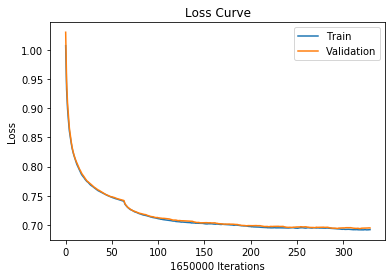

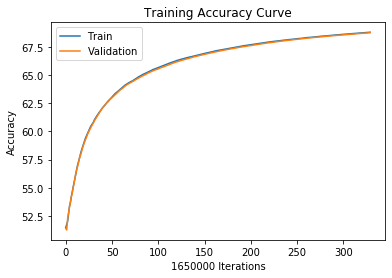

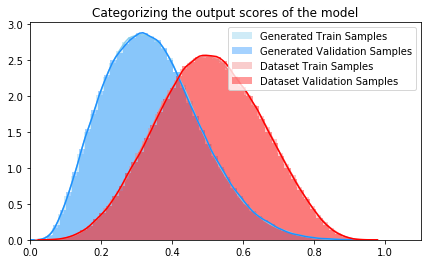

 36%|███▌      | 176384/491198 [15:00<20:43, 253.20it/s]

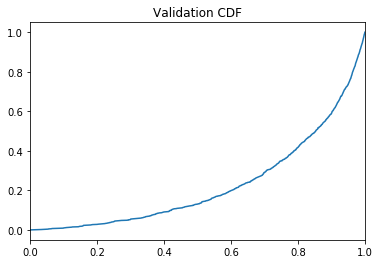

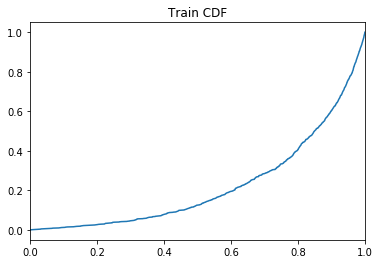

 36%|███▌      | 176440/491198 [15:48<55:56:05,  1.56it/s]

Training Accuracy at epoch 3: 68.80242424242424
Validation Accuracy epoch 3: 68.75824242424243
Training AUC at epoch 3: 0.22316263636363637
Validation AUC epoch 3: 0.22608381818181816
Train: Sensitivity: 0.7940928334182065 Specificity: 0.36165108158231024
Val: Sensitivity: 0.7946669181085286 Specificity: 0.3631302328696778


 46%|████▌     | 226378/491198 [18:59<18:46, 235.10it/s]  

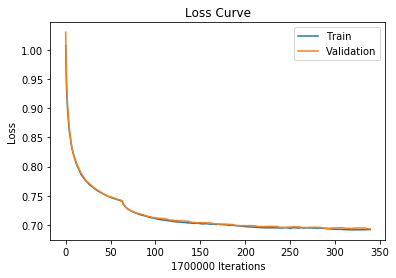

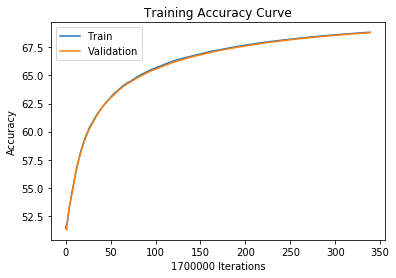

 46%|████▌     | 226378/491198 [19:11<18:46, 235.10it/s]

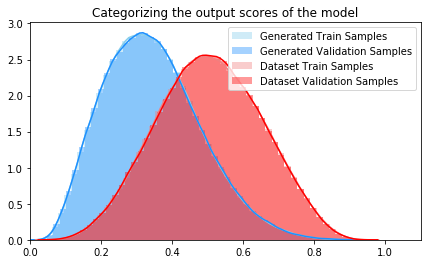

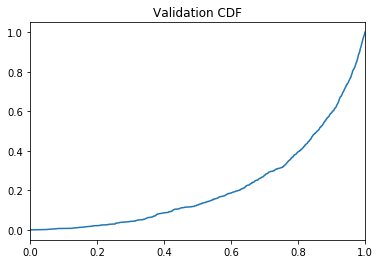

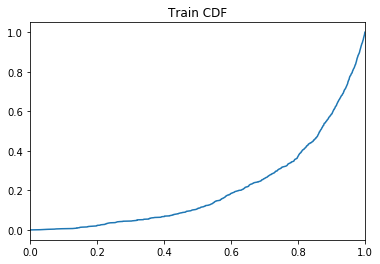

 46%|████▌     | 226438/491198 [20:19<44:13:01,  1.66it/s]

Training Accuracy at epoch 3: 68.84670588235294
Validation Accuracy epoch 3: 68.81435294117647
Training AUC at epoch 3: 0.21027254545454546
Validation AUC epoch 3: 0.2175527272727273
Train: Sensitivity: 0.7942989795674161 Specificity: 0.3612287009238424
Val: Sensitivity: 0.7951471939861604 Specificity: 0.36265765847827197


 56%|█████▋    | 276394/491198 [23:26<14:04, 254.30it/s]  

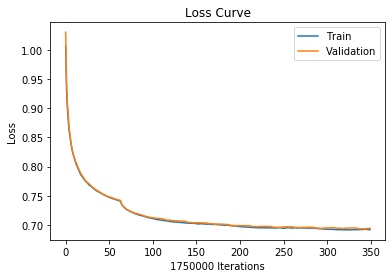

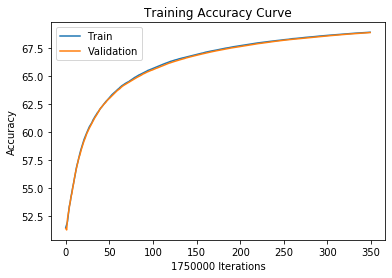

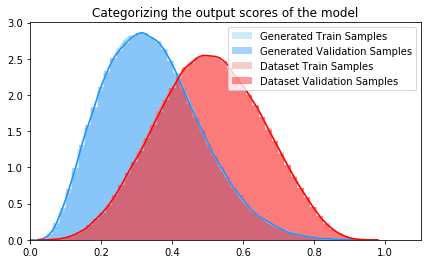

 56%|█████▋    | 276394/491198 [23:41<14:04, 254.30it/s]

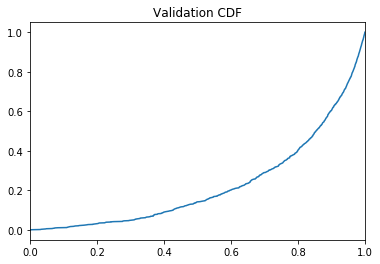

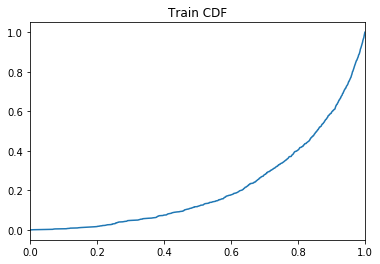

 56%|█████▋    | 276422/491198 [24:34<71:24:28,  1.20s/it] 

Training Accuracy at epoch 3: 68.8964
Validation Accuracy epoch 3: 68.86857142857143
Training AUC at epoch 3: 0.21626263636363638
Validation AUC epoch 3: 0.22601145454545454
Train: Sensitivity: 0.7945660961954106 Specificity: 0.3607698728169972
Val: Sensitivity: 0.795299956779583 Specificity: 0.3620872038682292


 66%|██████▋   | 326379/491198 [27:50<10:34, 259.92it/s]  

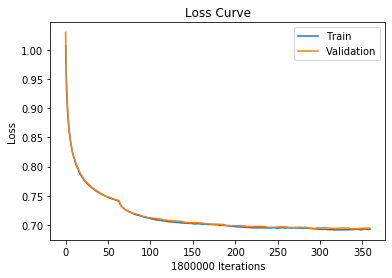

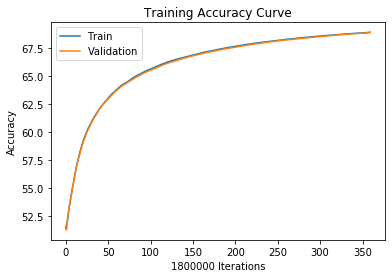

 66%|██████▋   | 326379/491198 [28:02<10:34, 259.92it/s]

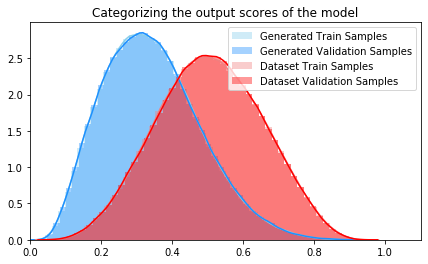

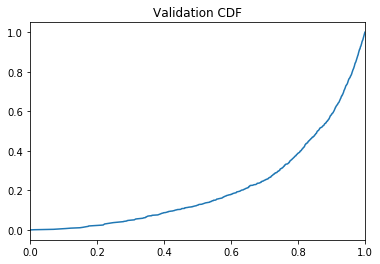

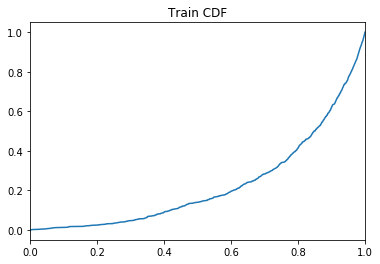

 66%|██████▋   | 326434/491198 [28:59<24:46:27,  1.85it/s]

Training Accuracy at epoch 3: 68.95572222222222
Validation Accuracy epoch 3: 68.92305555555555
Training AUC at epoch 3: 0.2269428181818182
Validation AUC epoch 3: 0.214731
Train: Sensitivity: 0.7949039778265212 Specificity: 0.36022392510305773
Val: Sensitivity: 0.7955718872244031 Specificity: 0.36156060063767675


 77%|███████▋  | 376396/491198 [32:14<07:58, 239.86it/s]  

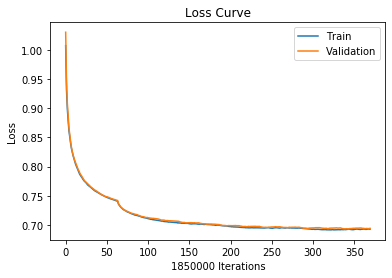

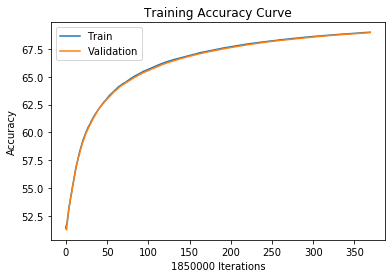

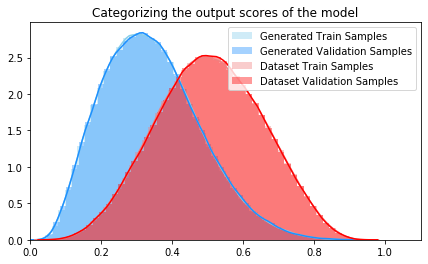

 77%|███████▋  | 376396/491198 [32:32<07:58, 239.86it/s]

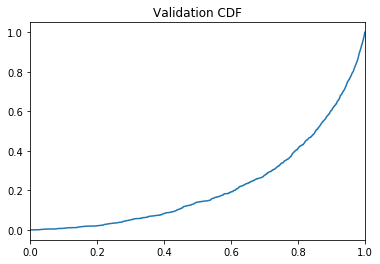

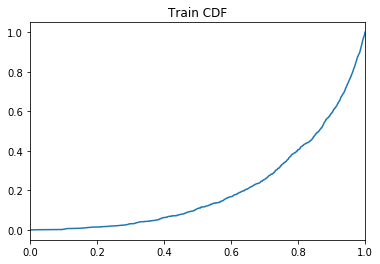

 77%|███████▋  | 376441/491198 [33:23<45:49:01,  1.44s/it]

Training Accuracy at epoch 3: 68.99881081081081
Validation Accuracy epoch 3: 68.96713513513514
Training AUC at epoch 3: 0.20752063636363638
Validation AUC epoch 3: 0.22285645454545455
Train: Sensitivity: 0.7951269657269089 Specificity: 0.3597812089099709
Val: Sensitivity: 0.7958035723230117 Specificity: 0.3611387764954894


 87%|████████▋ | 426379/491198 [36:35<04:28, 241.72it/s]  

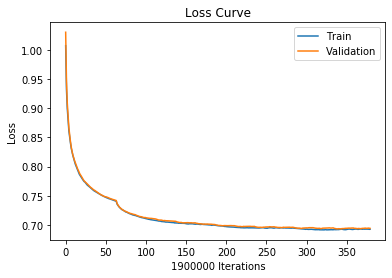

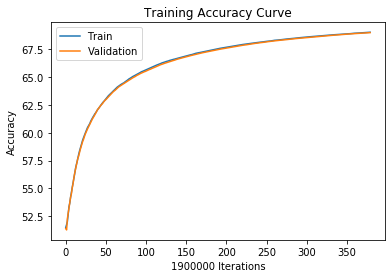

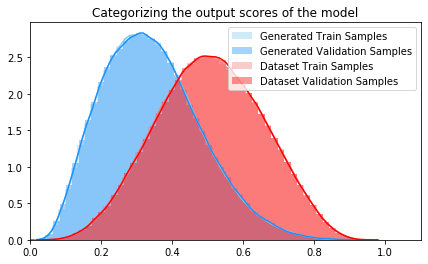

 87%|████████▋ | 426379/491198 [36:52<04:28, 241.72it/s]

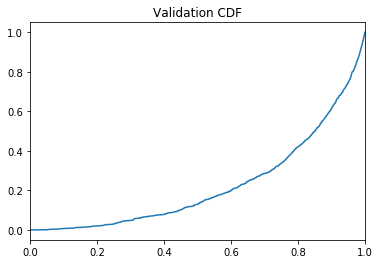

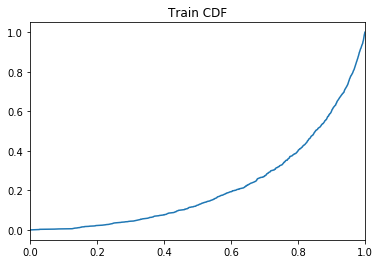

 87%|████████▋ | 426436/491198 [37:44<9:39:27,  1.86it/s] 

Training Accuracy at epoch 3: 69.04815789473685
Validation Accuracy epoch 3: 69.01342105263159
Training AUC at epoch 3: 0.21868954545454544
Validation AUC epoch 3: 0.2244921818181818
Train: Sensitivity: 0.7953986701453353 Specificity: 0.3592916645649922
Val: Sensitivity: 0.7959878652320068 Specificity: 0.36065904469051396


 97%|█████████▋| 476400/491198 [40:59<00:55, 266.15it/s] 

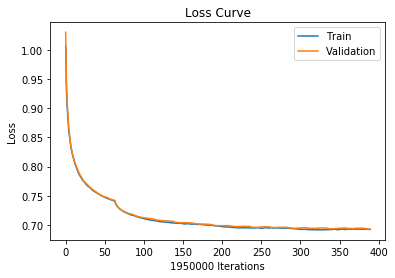

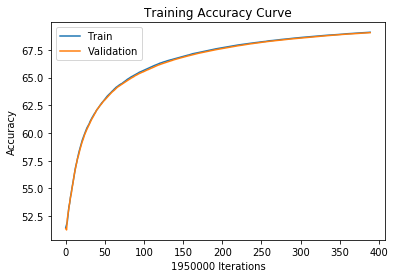

 97%|█████████▋| 476400/491198 [41:13<00:55, 266.15it/s]

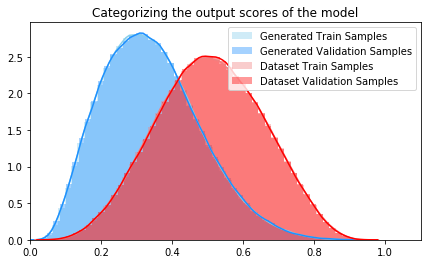

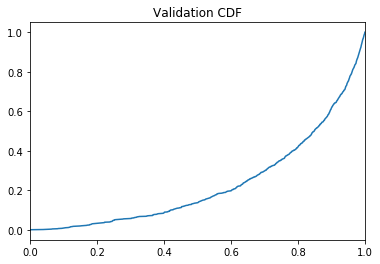

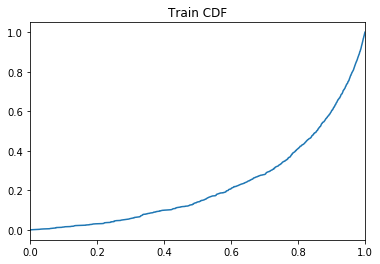

 97%|█████████▋| 476422/491198 [42:09<10:01:17,  2.44s/it]

Training Accuracy at epoch 3: 69.09369230769231
Validation Accuracy epoch 3: 69.05497435897436
Training AUC at epoch 3: 0.2290839090909091
Validation AUC epoch 3: 0.231271
Train: Sensitivity: 0.7955980498737002 Specificity: 0.3588122563331626
Val: Sensitivity: 0.7963208050765814 Specificity: 0.36030947329091795


  0%|          | 33/491198 [00:00<25:25, 322.01it/s]

Saving to:  model_checkpoints/binary/BlosumLinearNet/07292020.pth
Starting epoch: 4  with learning rate:  [0.0005]


  7%|▋         | 35169/491198 [02:15<31:01, 244.99it/s]

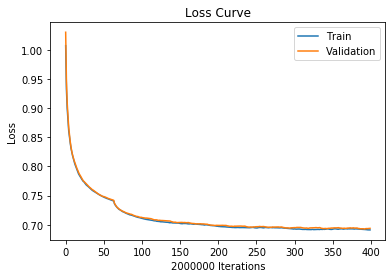

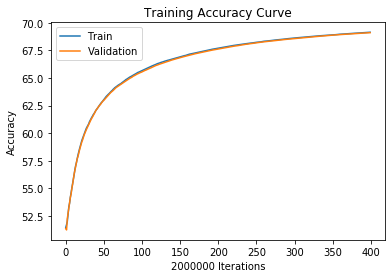

  7%|▋         | 35169/491198 [02:30<31:01, 244.99it/s]

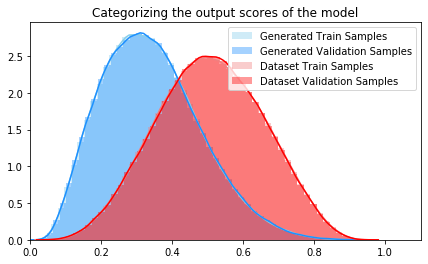

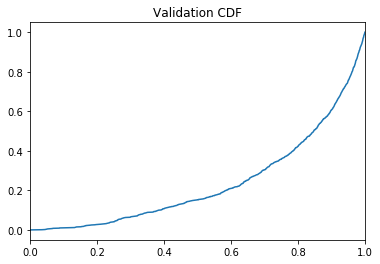

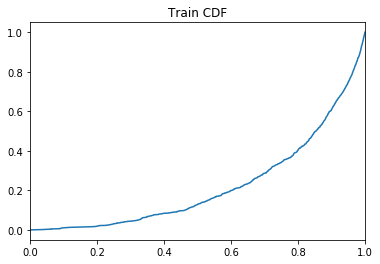

  7%|▋         | 35243/491198 [03:25<47:35:16,  2.66it/s]

Training Accuracy at epoch 4: 69.13775
Validation Accuracy epoch 4: 69.09795
Training AUC at epoch 4: 0.22205090909090908
Validation AUC epoch 4: 0.23579754545454545
Train: Sensitivity: 0.7958062766369625 Specificity: 0.35836058313341945
Val: Sensitivity: 0.7964482701885656 Specificity: 0.3598400793083341


 17%|█▋        | 85181/491198 [06:37<25:35, 264.42it/s]  

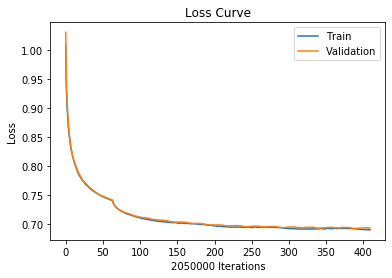

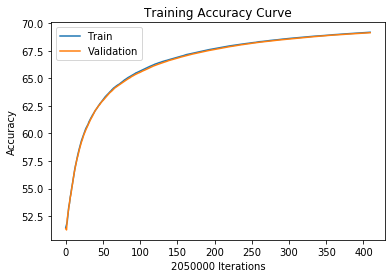

 17%|█▋        | 85181/491198 [06:50<25:35, 264.42it/s]

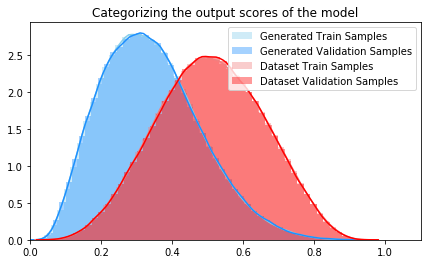

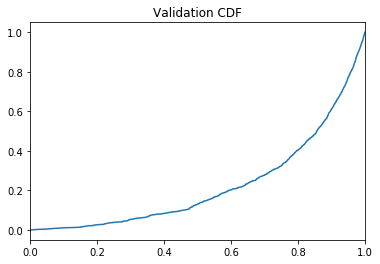

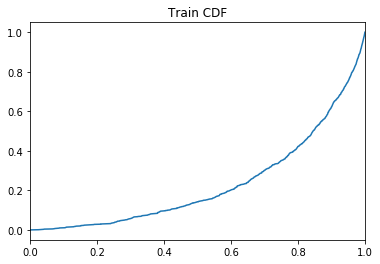

 17%|█▋        | 85242/491198 [07:46<61:11:15,  1.84it/s]

Training Accuracy at epoch 4: 69.18165853658536
Validation Accuracy epoch 4: 69.13795121951219
Training AUC at epoch 4: 0.23104463636363637
Validation AUC epoch 4: 0.2238160909090909
Train: Sensitivity: 0.7960726534950002 Specificity: 0.3579557902747829
Val: Sensitivity: 0.7967294444369548 Specificity: 0.359496154171673


 28%|██▊       | 135199/491198 [10:59<24:46, 239.53it/s] 

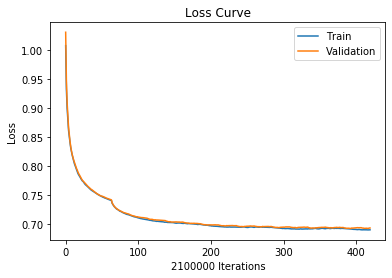

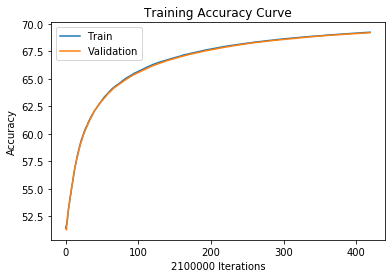

 28%|██▊       | 135199/491198 [11:10<24:46, 239.53it/s]

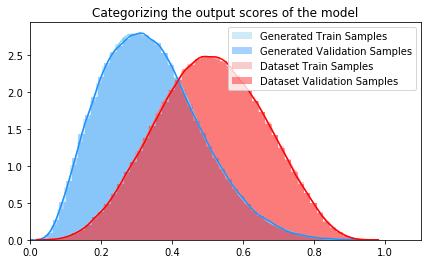

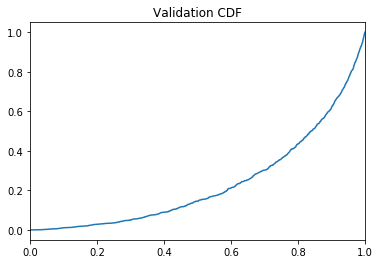

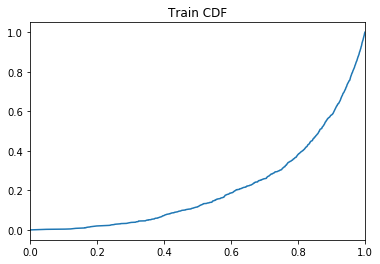

 28%|██▊       | 135240/491198 [12:11<166:04:04,  1.68s/it]

Training Accuracy at epoch 4: 69.22014285714286
Validation Accuracy epoch 4: 69.17833333333333
Training AUC at epoch 4: 0.2106218181818182
Validation AUC epoch 4: 0.23384472727272726
Train: Sensitivity: 0.7962704387987364 Specificity: 0.3575966188591677
Val: Sensitivity: 0.796840602390643 Specificity: 0.3590752200006219


 38%|███▊      | 185207/491198 [15:16<18:47, 271.46it/s]   

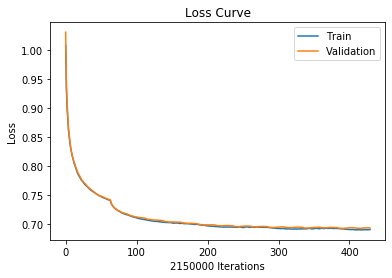

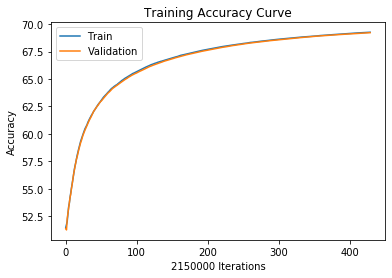

 38%|███▊      | 185207/491198 [15:30<18:47, 271.46it/s]

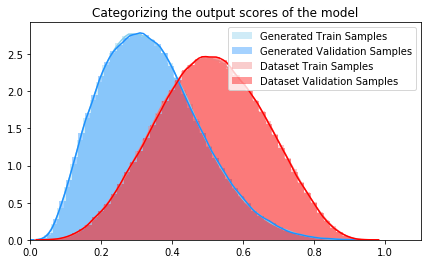

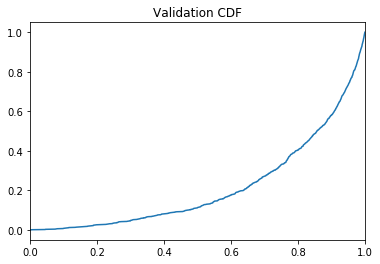

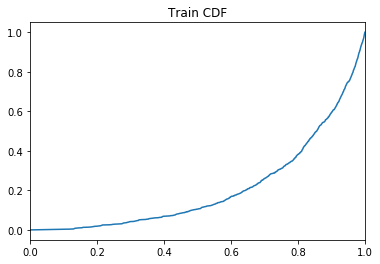

 38%|███▊      | 185224/491198 [16:26<1242:57:14, 14.62s/it]

Training Accuracy at epoch 4: 69.2540465116279
Validation Accuracy epoch 4: 69.21409302325581
Training AUC at epoch 4: 0.2085723636363636
Validation AUC epoch 4: 0.2147766363636364
Train: Sensitivity: 0.7964159516845257 Specificity: 0.3572622942020828
Val: Sensitivity: 0.7969905857889564 Specificity: 0.35870485609895914


 48%|████▊     | 235195/491198 [19:34<15:06, 282.40it/s]    

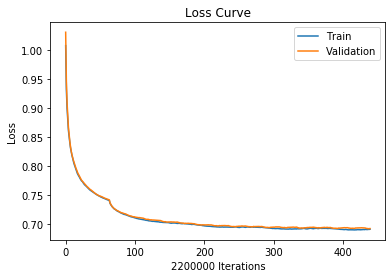

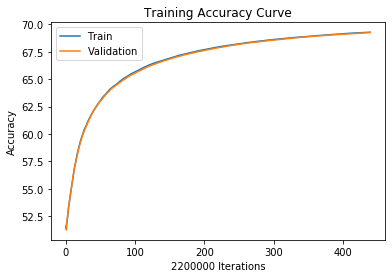

 48%|████▊     | 235195/491198 [19:50<15:06, 282.40it/s]

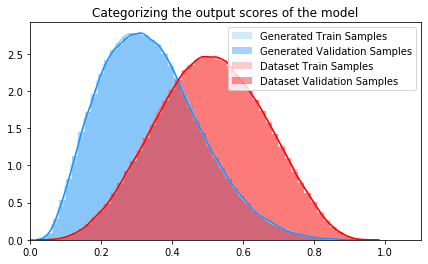

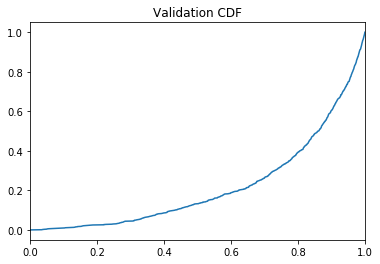

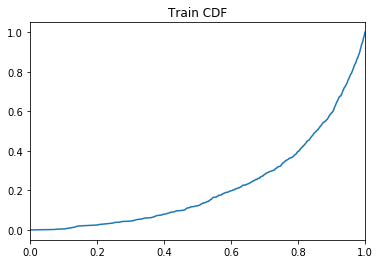

 48%|████▊     | 235242/491198 [20:46<82:09:41,  1.16s/it] 

Training Accuracy at epoch 4: 69.27959090909091
Validation Accuracy epoch 4: 69.25177272727272
Training AUC at epoch 4: 0.22058536363636363
Validation AUC epoch 4: 0.21867654545454546
Train: Sensitivity: 0.7964881359351708 Specificity: 0.35700098503076205
Val: Sensitivity: 0.7973323581920213 Specificity: 0.3583902624818678


 58%|█████▊    | 285193/491198 [23:59<14:32, 236.01it/s]  

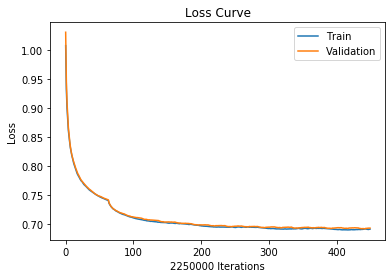

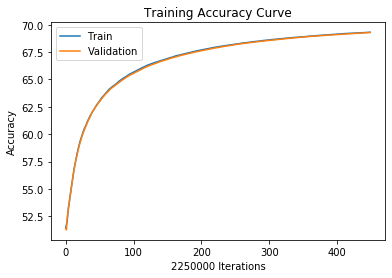

 58%|█████▊    | 285193/491198 [24:10<14:32, 236.01it/s]

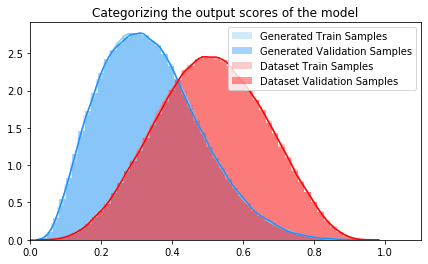

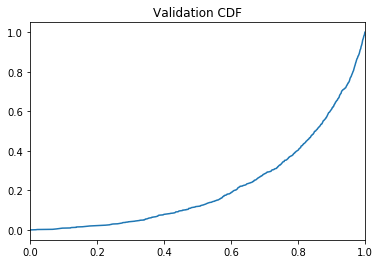

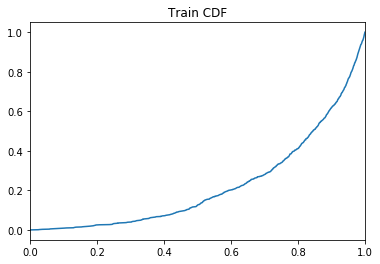

 58%|█████▊    | 285242/491198 [25:10<56:47:36,  1.01it/s]

Training Accuracy at epoch 4: 69.31435555555555
Validation Accuracy epoch 4: 69.28853333333333
Training AUC at epoch 4: 0.22420172727272725
Validation AUC epoch 4: 0.21932409090909094
Train: Sensitivity: 0.7967032365735548 Specificity: 0.3566952823605314
Val: Sensitivity: 0.7974020543537583 Specificity: 0.3579830555735428


 68%|██████▊   | 335177/491198 [28:22<11:06, 234.06it/s]  

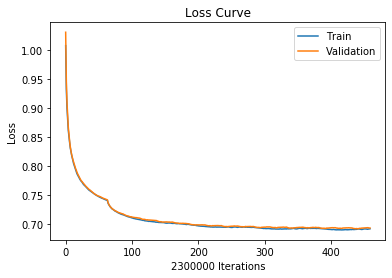

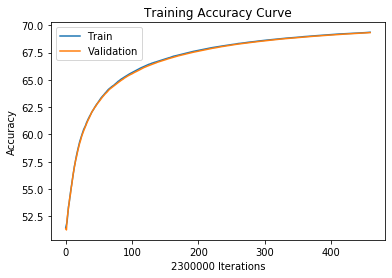

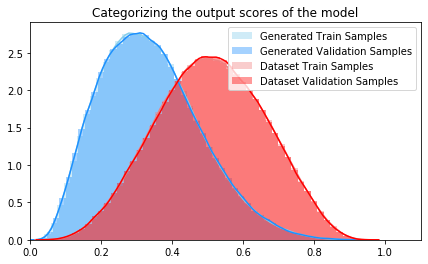

 68%|██████▊   | 335177/491198 [28:40<11:06, 234.06it/s]

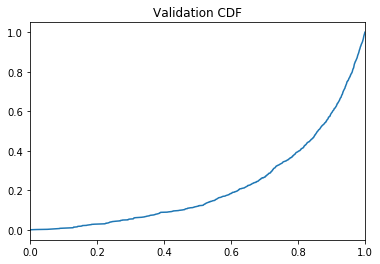

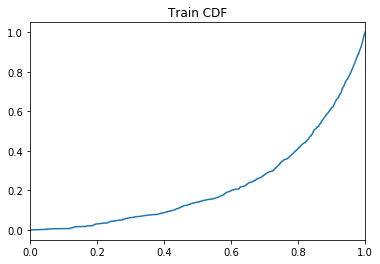

 68%|██████▊   | 335240/491198 [29:33<20:50:47,  2.08it/s]

Training Accuracy at epoch 4: 69.35626086956522
Validation Accuracy epoch 4: 69.32213043478261
Training AUC at epoch 4: 0.2277719090909091
Validation AUC epoch 4: 0.2196417272727273
Train: Sensitivity: 0.7969527612510758 Specificity: 0.3562952241260643
Val: Sensitivity: 0.7975562885186939 Specificity: 0.35766564056655215


 78%|███████▊  | 385183/491198 [32:55<07:07, 248.12it/s]  

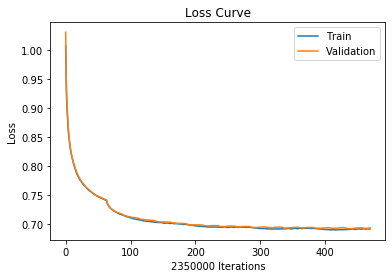

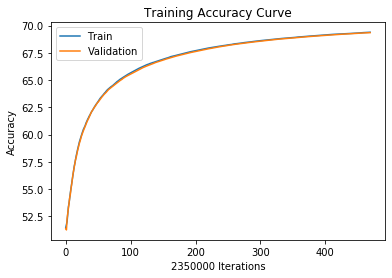

 78%|███████▊  | 385183/491198 [33:11<07:07, 248.12it/s]

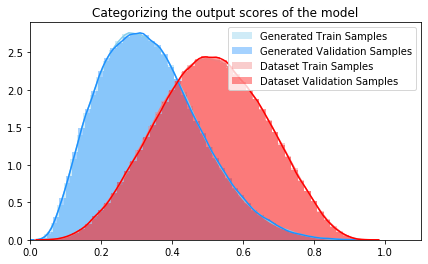

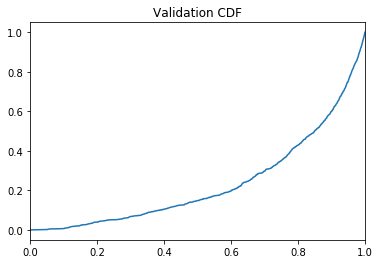

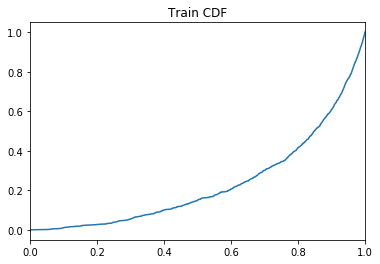

 78%|███████▊  | 385224/491198 [34:08<18:08:24,  1.62it/s]

Training Accuracy at epoch 4: 69.38795744680851
Validation Accuracy epoch 4: 69.34987234042553
Training AUC at epoch 4: 0.23188218181818182
Validation AUC epoch 4: 0.234004
Train: Sensitivity: 0.7971234734704651 Specificity: 0.3559798624599452
Val: Sensitivity: 0.7976565903856927 Specificity: 0.35737793384409583


 89%|████████▊ | 435189/491198 [37:22<03:26, 271.71it/s]  

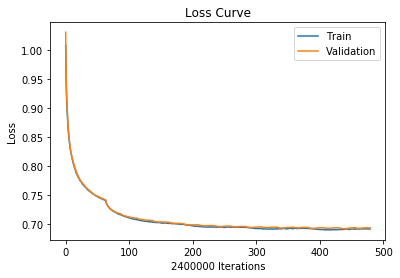

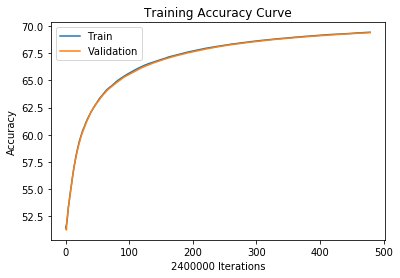

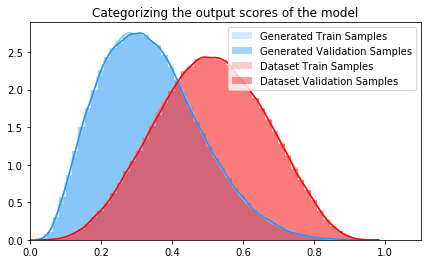

 89%|████████▊ | 435189/491198 [37:41<03:26, 271.71it/s]

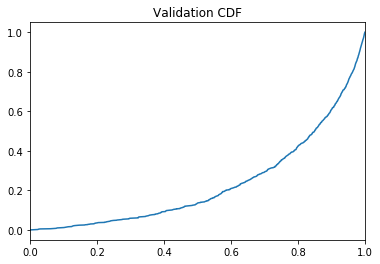

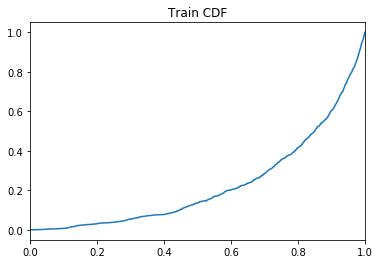

 89%|████████▊ | 435242/491198 [38:34<12:23:36,  1.25it/s]

Training Accuracy at epoch 4: 69.41966666666667
Validation Accuracy epoch 4: 69.37891666666667
Training AUC at epoch 4: 0.22721790909090908
Validation AUC epoch 4: 0.23060463636363637
Train: Sensitivity: 0.7972808350771252 Specificity: 0.3556534860273932
Val: Sensitivity: 0.7977728053418169 Specificity: 0.3570747815598137


 99%|█████████▉| 485192/491198 [41:48<00:26, 230.68it/s]  

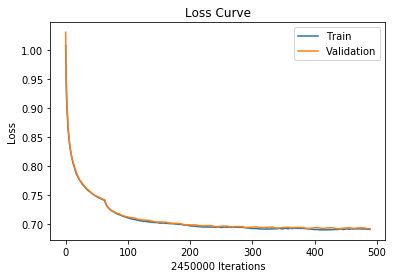

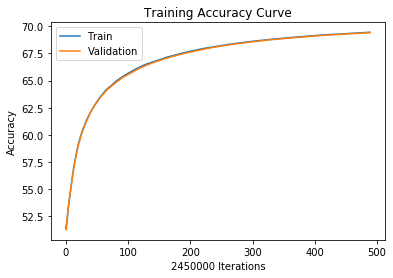

 99%|█████████▉| 485192/491198 [42:01<00:26, 230.68it/s]

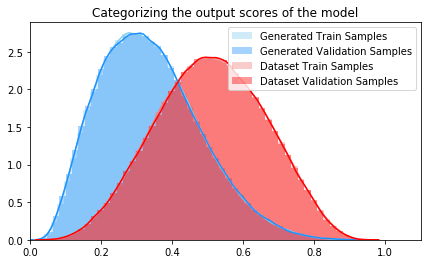

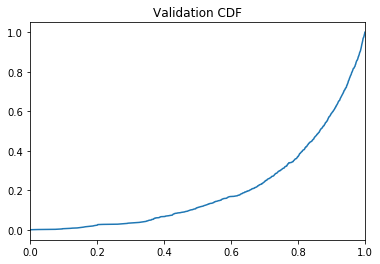

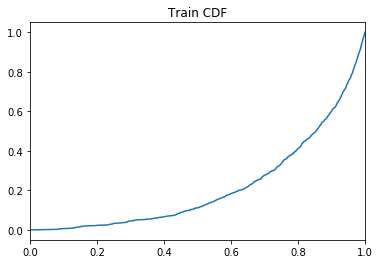

 99%|█████████▉| 485244/491198 [43:01<1:35:36,  1.04it/s]

Training Accuracy at epoch 4: 69.45171428571429
Validation Accuracy epoch 4: 69.41204081632652
Training AUC at epoch 4: 0.21643472727272728
Validation AUC epoch 4: 0.20615972727272727
Train: Sensitivity: 0.7974349991241461 Specificity: 0.35531021698833276
Val: Sensitivity: 0.7980426427798246 Specificity: 0.3567893681921451


  0%|          | 29/491198 [00:00<28:21, 288.63it/s]

Saving to:  model_checkpoints/binary/BlosumLinearNet/07292020.pth
Starting epoch: 5  with learning rate:  [0.00040500000000000003]


  9%|▉         | 43986/491198 [02:50<30:13, 246.54it/s]

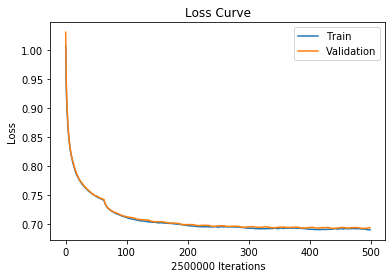

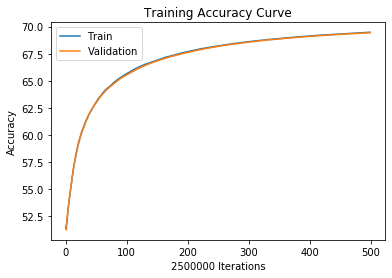

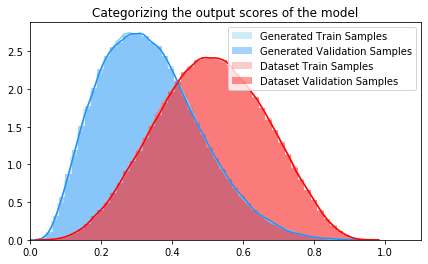

  9%|▉         | 43986/491198 [03:10<30:13, 246.54it/s]

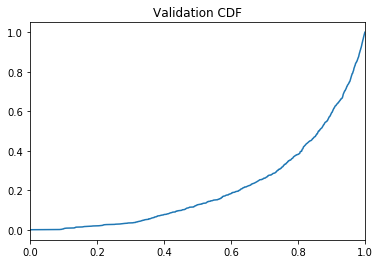

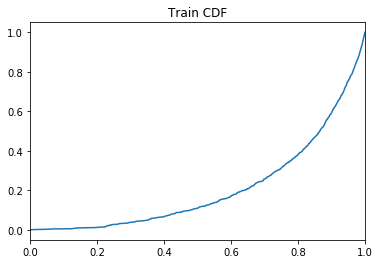

  9%|▉         | 44042/491198 [04:06<82:54:23,  1.50it/s] 

Training Accuracy at epoch 5: 69.48484
Validation Accuracy epoch 5: 69.43784
Training AUC at epoch 5: 0.20857054545454545
Validation AUC epoch 5: 0.21288518181818183
Train: Sensitivity: 0.7976069573910028 Specificity: 0.3549699860487243
Val: Sensitivity: 0.7980772970345162 Specificity: 0.3564941569282137


 19%|█▉        | 93984/491198 [07:34<30:11, 219.25it/s]  

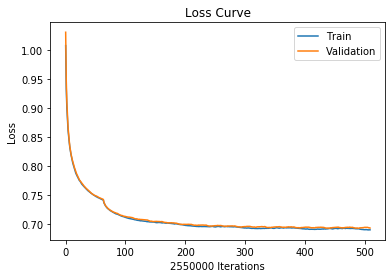

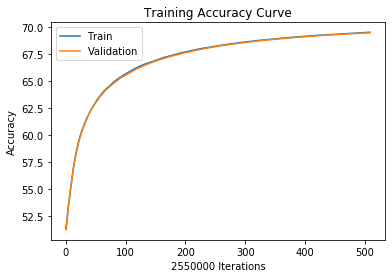

 19%|█▉        | 93984/491198 [07:50<30:11, 219.25it/s]

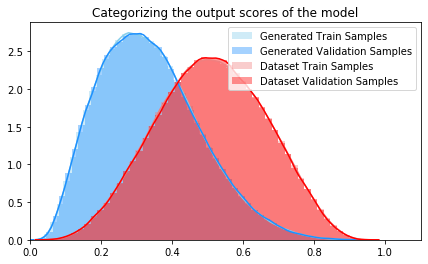

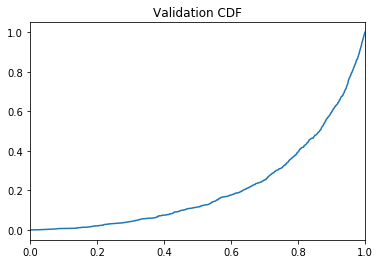

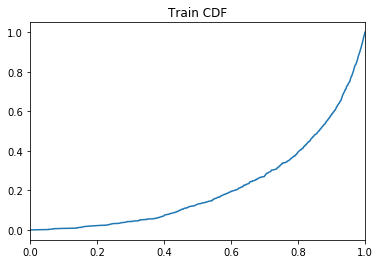

 19%|█▉        | 94026/491198 [08:50<68:10:05,  1.62it/s]

Training Accuracy at epoch 5: 69.51521568627452
Validation Accuracy epoch 5: 69.46741176470589
Training AUC at epoch 5: 0.21603745454545453
Validation AUC epoch 5: 0.21252218181818183
Train: Sensitivity: 0.7977864125655757 Specificity: 0.3546921180759266
Val: Sensitivity: 0.7982907915801251 Specificity: 0.35623930824139033


 29%|██▉       | 143985/491198 [12:18<23:52, 242.34it/s] 

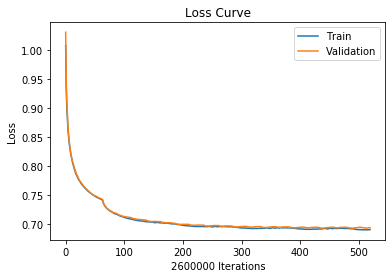

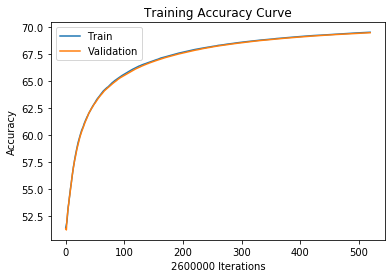

 29%|██▉       | 143985/491198 [12:30<23:52, 242.34it/s]

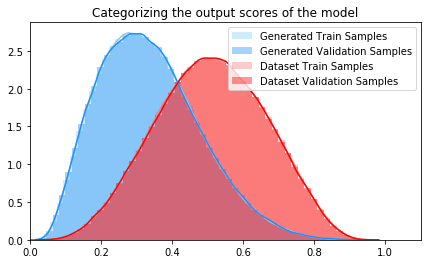

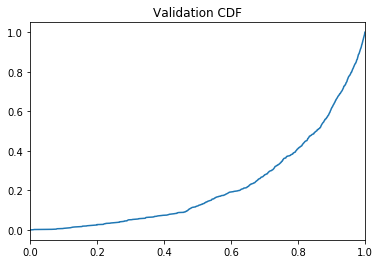

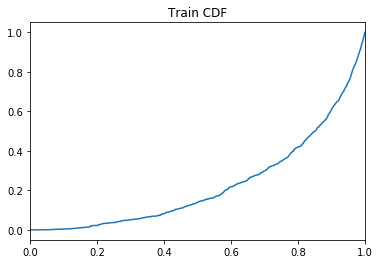

 29%|██▉       | 144051/491198 [13:34<62:12:09,  1.55it/s]

Training Accuracy at epoch 5: 69.53907692307692
Validation Accuracy epoch 5: 69.49411538461538
Training AUC at epoch 5: 0.22784527272727273
Validation AUC epoch 5: 0.22141327272727274
Train: Sensitivity: 0.7978870706496058 Specificity: 0.35445948464417076
Val: Sensitivity: 0.7983162607930132 Specificity: 0.35594085118960506


 39%|███▉      | 193992/491198 [16:58<19:19, 256.40it/s]  

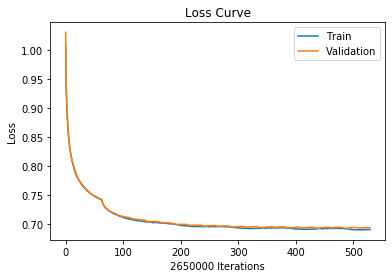

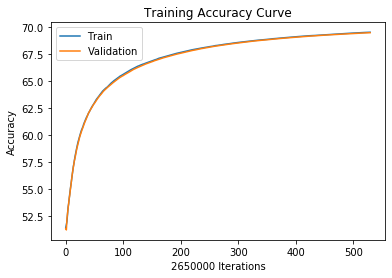

 39%|███▉      | 193992/491198 [17:10<19:19, 256.40it/s]

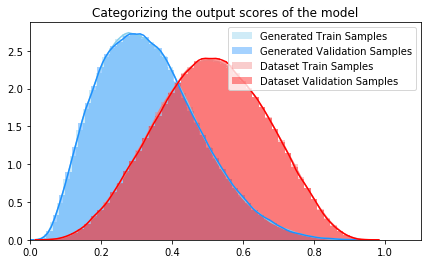

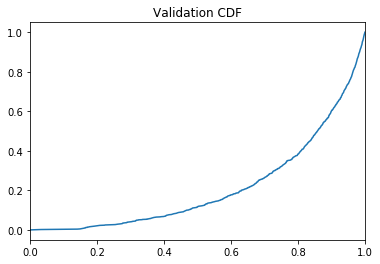

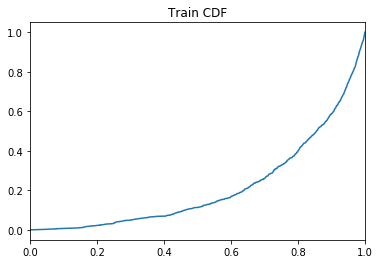

 40%|███▉      | 194042/491198 [18:15<74:19:36,  1.11it/s] 

Training Accuracy at epoch 5: 69.56056603773585
Validation Accuracy epoch 5: 69.51777358490565
Training AUC at epoch 5: 0.21379627272727272
Validation AUC epoch 5: 0.21162563636363635
Train: Sensitivity: 0.7979698016345735 Specificity: 0.35425469947912636
Val: Sensitivity: 0.798460069851323 Specificity: 0.35571133648963404


 50%|████▉     | 243991/491198 [21:37<18:00, 228.83it/s]  

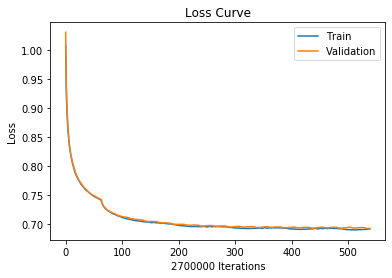

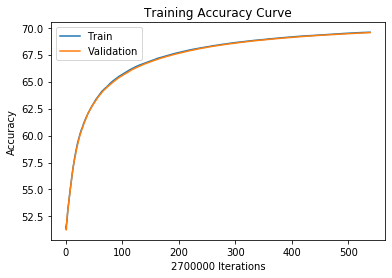

 50%|████▉     | 243991/491198 [21:50<18:00, 228.83it/s]

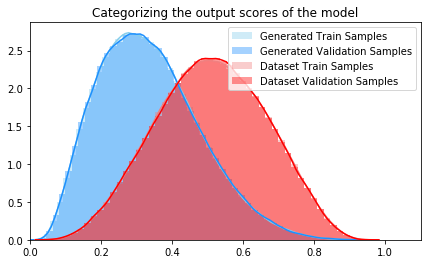

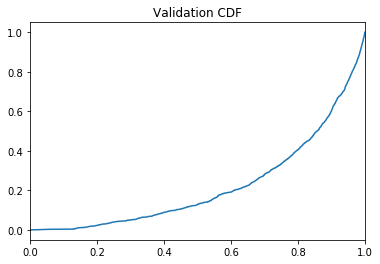

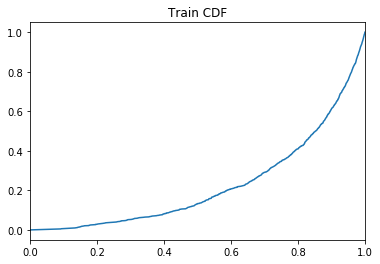

 50%|████▉     | 244042/491198 [22:54<58:15:56,  1.18it/s]

Training Accuracy at epoch 5: 69.57733333333333
Validation Accuracy epoch 5: 69.54566666666666
Training AUC at epoch 5: 0.22643172727272728
Validation AUC epoch 5: 0.22169963636363638
Train: Sensitivity: 0.7979991887381489 Specificity: 0.35407576700079724
Val: Sensitivity: 0.7987286472618484 Specificity: 0.3554773436921038


 60%|█████▉    | 293991/491198 [26:15<13:15, 248.05it/s]  

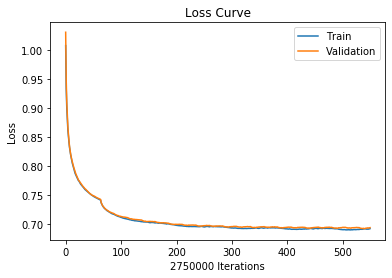

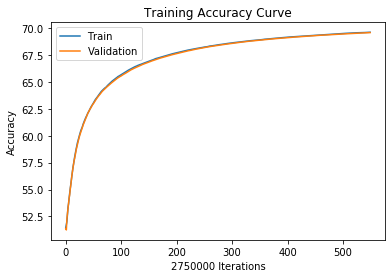

 60%|█████▉    | 293991/491198 [26:30<13:15, 248.05it/s]

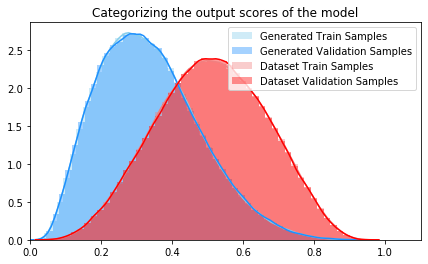

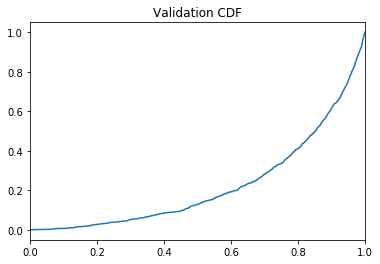

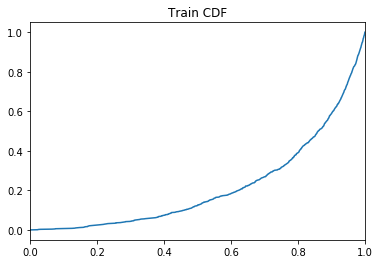

 60%|█████▉    | 294026/491198 [27:33<47:01:53,  1.16it/s]

Training Accuracy at epoch 5: 69.60363636363637
Validation Accuracy epoch 5: 69.57061818181818
Training AUC at epoch 5: 0.2155602727272727
Validation AUC epoch 5: 0.22387672727272728
Train: Sensitivity: 0.798159332439411 Specificity: 0.35384144922359156
Val: Sensitivity: 0.7987324900862381 Specificity: 0.3551920019905925


 70%|███████   | 343979/491198 [30:55<09:37, 255.05it/s]  

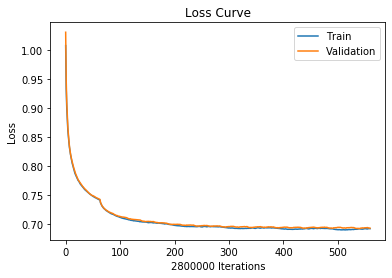

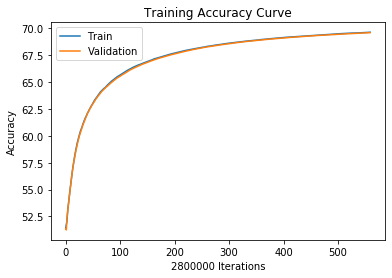

 70%|███████   | 343979/491198 [31:10<09:37, 255.05it/s]

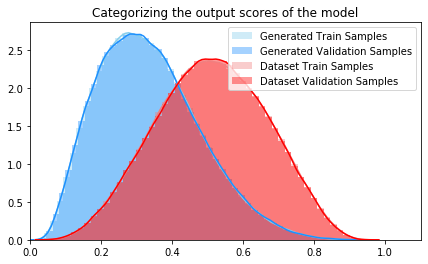

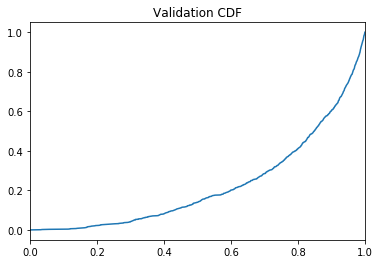

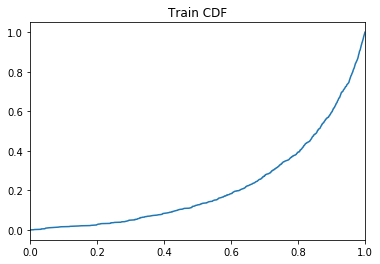

 70%|███████   | 344041/491198 [32:13<21:49:06,  1.87it/s]

Training Accuracy at epoch 5: 69.634
Validation Accuracy epoch 5: 69.59332142857143
Training AUC at epoch 5: 0.21968372727272728
Validation AUC epoch 5: 0.22457790909090908
Train: Sensitivity: 0.7983241894177074 Specificity: 0.35353121202694043
Val: Sensitivity: 0.7988890363842203 Specificity: 0.3549882380697944


 80%|████████  | 394000/491198 [35:33<07:43, 209.81it/s]  

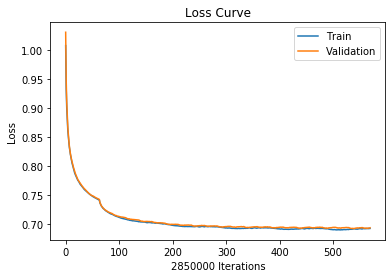

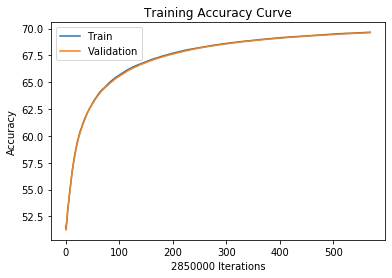

 80%|████████  | 394000/491198 [35:50<07:43, 209.81it/s]

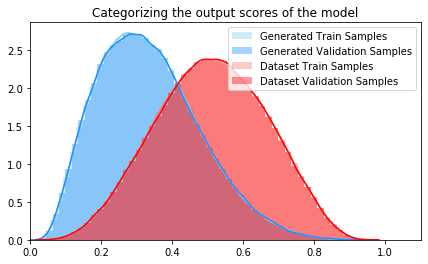

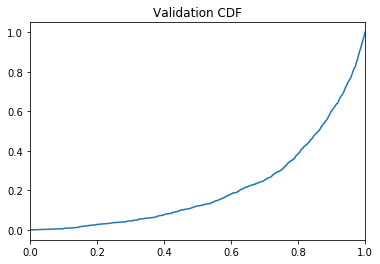

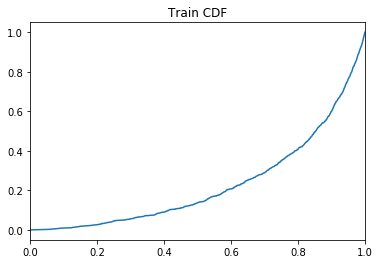

 80%|████████  | 394046/491198 [36:51<44:20:08,  1.64s/it]

Training Accuracy at epoch 5: 69.65652631578948
Validation Accuracy epoch 5: 69.61364912280702
Training AUC at epoch 5: 0.22863254545454548
Validation AUC epoch 5: 0.2132368181818182
Train: Sensitivity: 0.7984546191152812 Specificity: 0.35331915518590395
Val: Sensitivity: 0.7989223080745316 Specificity: 0.3547605070165692


 90%|█████████ | 443978/491198 [40:00<03:19, 236.35it/s]  

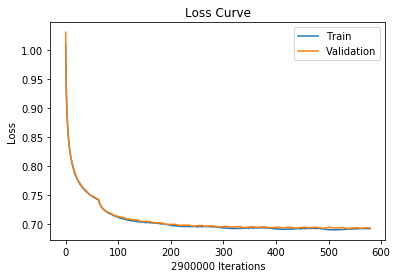

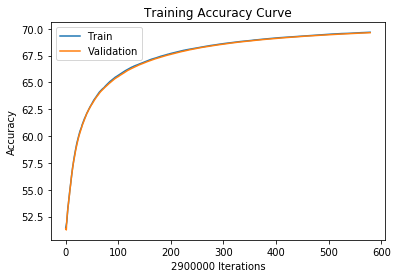

 90%|█████████ | 443978/491198 [40:11<03:19, 236.35it/s]

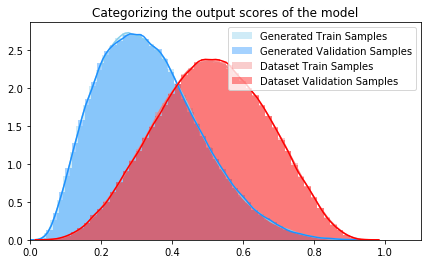

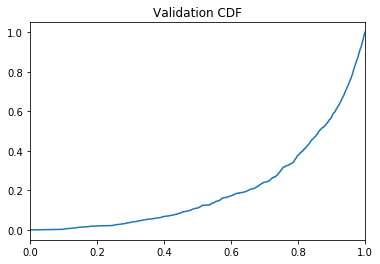

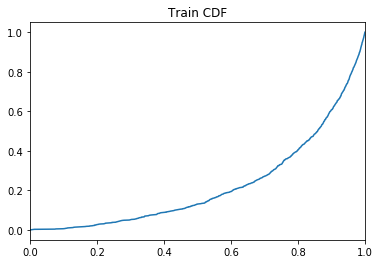

 90%|█████████ | 444042/491198 [41:19<6:48:22,  1.92it/s]

Training Accuracy at epoch 5: 69.67758620689655
Validation Accuracy epoch 5: 69.63531034482759
Training AUC at epoch 5: 0.22271209090909094
Validation AUC epoch 5: 0.204594
Train: Sensitivity: 0.7985572890454622 Specificity: 0.35310239230516277
Val: Sensitivity: 0.7990632664550119 Specificity: 0.35455164798780403


  0%|          | 26/491198 [00:00<32:11, 254.36it/s]

Saving to:  model_checkpoints/binary/BlosumLinearNet/07292020.pth
Starting epoch: 6  with learning rate:  [0.00045000000000000004]


  1%|          | 2791/491198 [00:11<36:15, 224.46it/s]

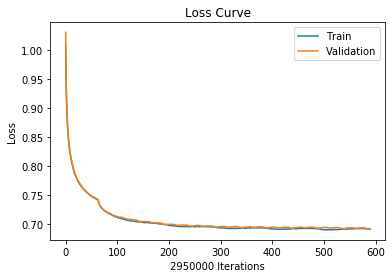

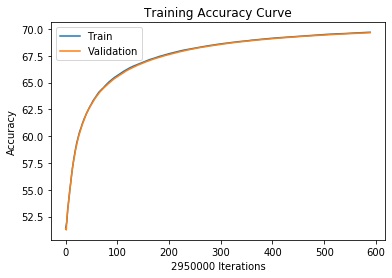

  1%|          | 2791/491198 [00:30<36:15, 224.46it/s]

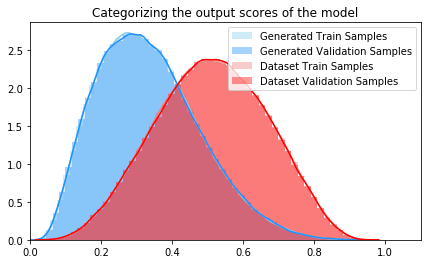

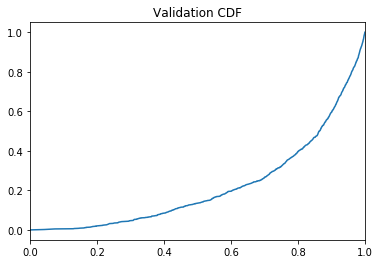

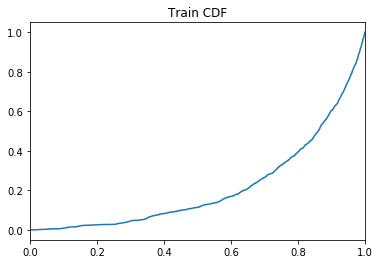

  1%|          | 2828/491198 [01:31<108:13:09,  1.25it/s]

Training Accuracy at epoch 6: 69.70193220338983
Validation Accuracy epoch 6: 69.65793220338983
Training AUC at epoch 6: 0.2147942727272727
Validation AUC epoch 6: 0.21930272727272732
Train: Sensitivity: 0.7986705015338782 Specificity: 0.35283626490331227
Val: Sensitivity: 0.7992223133112403 Specificity: 0.3543480443918337


 11%|█         | 52788/491198 [04:53<25:36, 285.35it/s]  

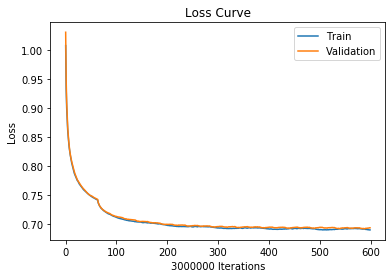

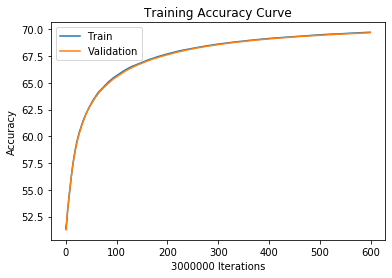

 11%|█         | 52788/491198 [05:10<25:36, 285.35it/s]

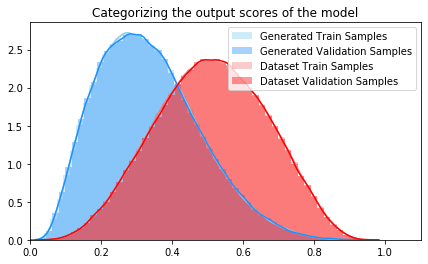

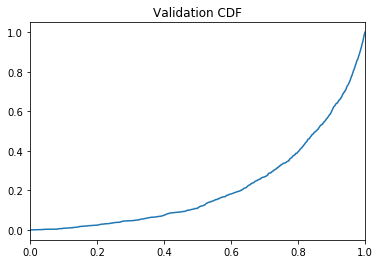

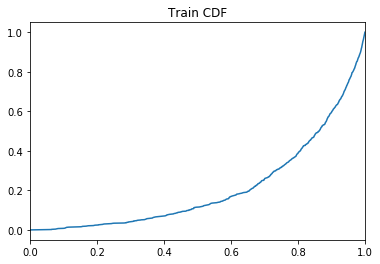

 11%|█         | 52840/491198 [06:13<85:44:29,  1.42it/s] 

Training Accuracy at epoch 6: 69.7251
Validation Accuracy epoch 6: 69.67623333333333
Training AUC at epoch 6: 0.21013109090909088
Validation AUC epoch 6: 0.21598563636363638
Train: Sensitivity: 0.7987935244311809 Specificity: 0.3525994899024135
Val: Sensitivity: 0.7992406131345803 Specificity: 0.3541347794418447


 21%|██        | 102784/491198 [09:38<26:12, 246.95it/s] 

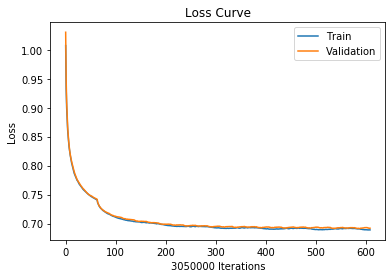

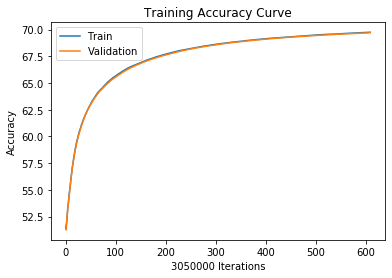

 21%|██        | 102784/491198 [09:50<26:12, 246.95it/s]

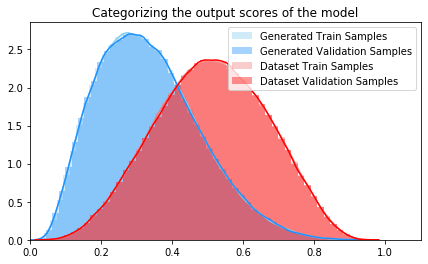

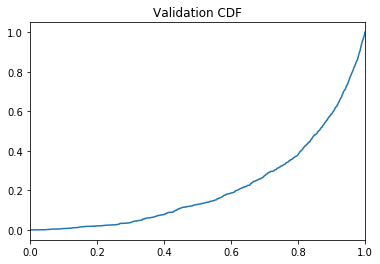

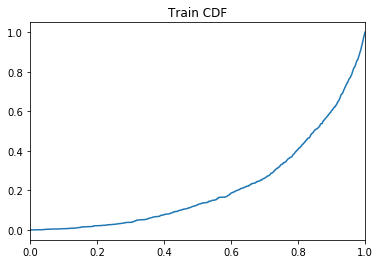

 21%|██        | 102840/491198 [10:58<65:09:32,  1.66it/s]

Training Accuracy at epoch 6: 69.74773770491804
Validation Accuracy epoch 6: 69.6988524590164
Training AUC at epoch 6: 0.21730954545454545
Validation AUC epoch 6: 0.21555881818181818
Train: Sensitivity: 0.7989110700582069 Specificity: 0.352386769712142
Val: Sensitivity: 0.7993853911443413 Specificity: 0.3539335826544749


 31%|███       | 152794/491198 [14:26<25:20, 222.55it/s]  

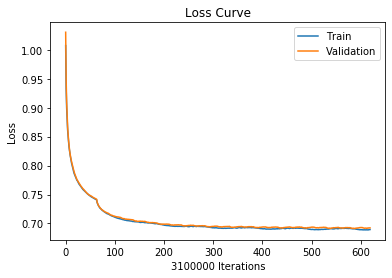

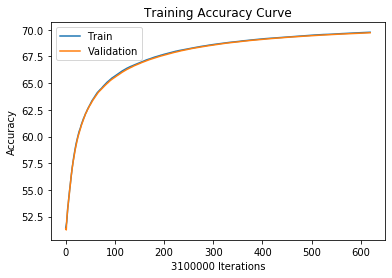

 31%|███       | 152794/491198 [14:40<25:20, 222.55it/s]

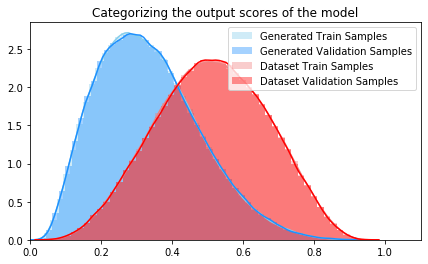

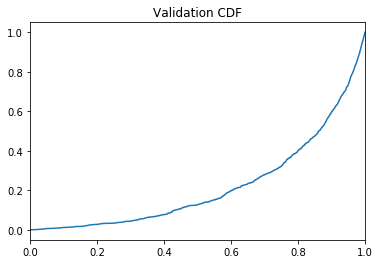

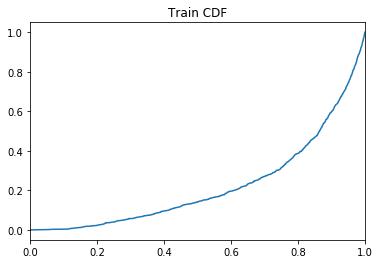

 31%|███       | 152844/491198 [15:45<87:05:50,  1.08it/s] 

Training Accuracy at epoch 6: 69.76635483870967
Validation Accuracy epoch 6: 69.71809677419355
Training AUC at epoch 6: 0.22081754545454546
Validation AUC epoch 6: 0.21950309090909093
Train: Sensitivity: 0.7989996244190232 Specificity: 0.35220573512310455
Val: Sensitivity: 0.7994122596655432 Specificity: 0.35371637112832205


 41%|████▏     | 202793/491198 [19:12<21:34, 222.88it/s]  

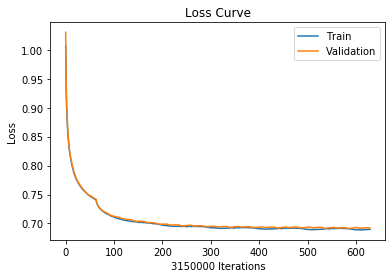

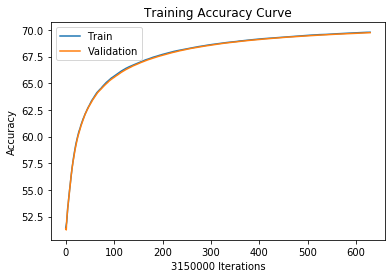

 41%|████▏     | 202793/491198 [19:30<21:34, 222.88it/s]

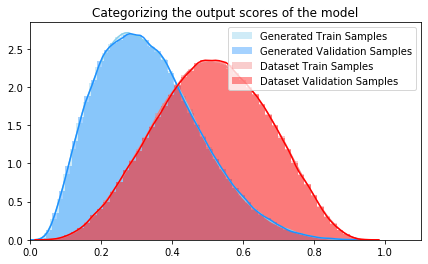

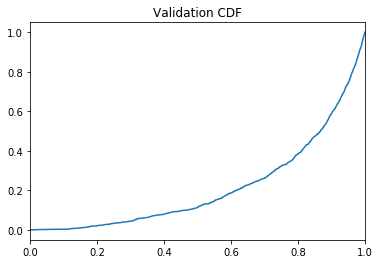

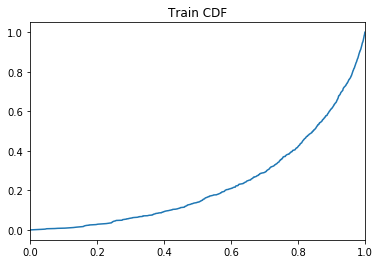

 41%|████▏     | 202828/491198 [20:32<70:49:11,  1.13it/s] 

Training Accuracy at epoch 6: 69.77822222222223
Validation Accuracy epoch 6: 69.73780952380952
Training AUC at epoch 6: 0.23185472727272727
Validation AUC epoch 6: 0.2138751818181818
Train: Sensitivity: 0.7990013264985153 Specificity: 0.35207761863628156
Val: Sensitivity: 0.7995694469636941 Specificity: 0.35353458485334194


 51%|█████▏    | 252806/491198 [23:50<14:47, 268.57it/s]  

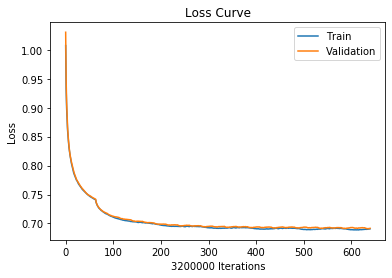

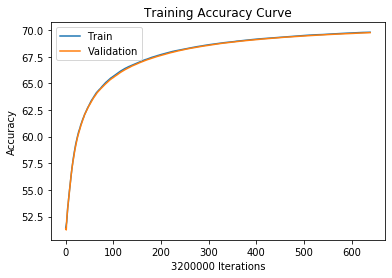

 51%|█████▏    | 252806/491198 [24:10<14:47, 268.57it/s]

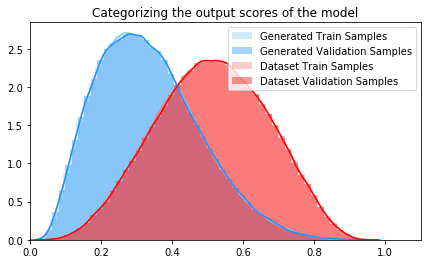

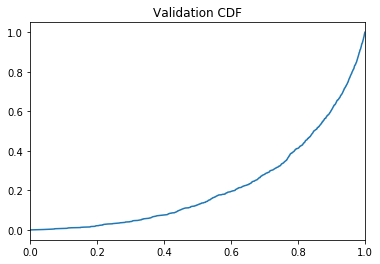

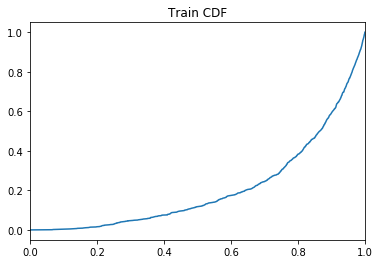

 51%|█████▏    | 252840/491198 [25:10<183:49:00,  2.78s/it]

Training Accuracy at epoch 6: 69.79240625
Validation Accuracy epoch 6: 69.755125
Training AUC at epoch 6: 0.20938136363636362
Validation AUC epoch 6: 0.22144572727272727
Train: Sensitivity: 0.7990635235022858 Specificity: 0.351942099769838
Val: Sensitivity: 0.7996847929504827 Specificity: 0.3533742049723154


 62%|██████▏   | 302801/491198 [28:12<13:21, 234.97it/s]   

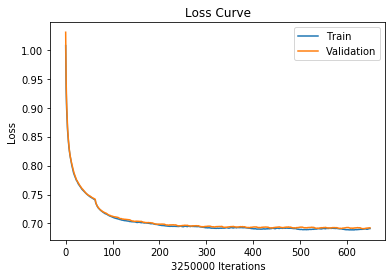

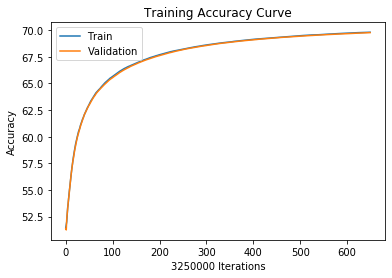

 62%|██████▏   | 302801/491198 [28:30<13:21, 234.97it/s]

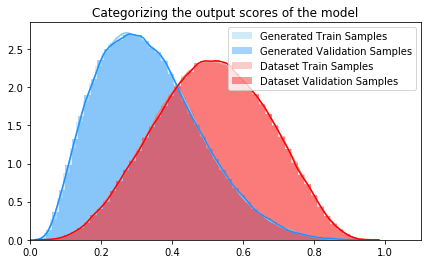

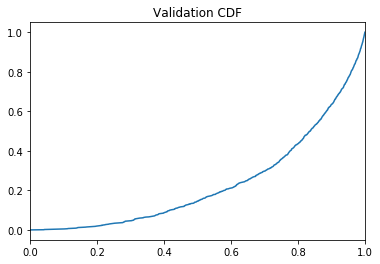

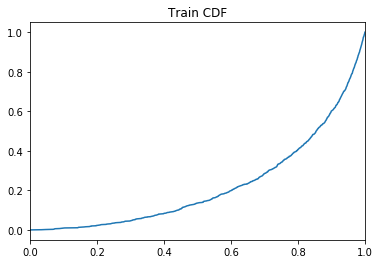

 62%|██████▏   | 302839/491198 [29:32<80:25:17,  1.54s/it] 

Training Accuracy at epoch 6: 69.81070769230769
Validation Accuracy epoch 6: 69.77473846153846
Training AUC at epoch 6: 0.22258727272727274
Validation AUC epoch 6: 0.23359454545454544
Train: Sensitivity: 0.7991641148490184 Specificity: 0.3517761838736466
Val: Sensitivity: 0.7997262752643218 Specificity: 0.353155670649493


 72%|███████▏  | 352801/491198 [33:01<09:27, 243.71it/s]  

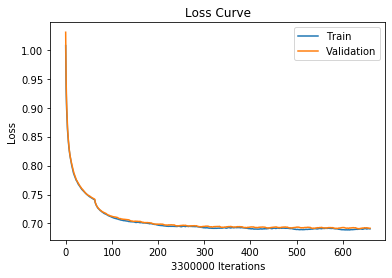

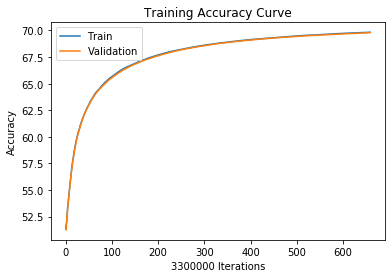

 72%|███████▏  | 352801/491198 [33:20<09:27, 243.71it/s]

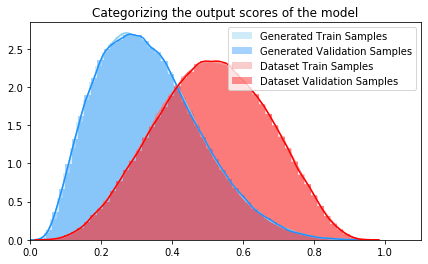

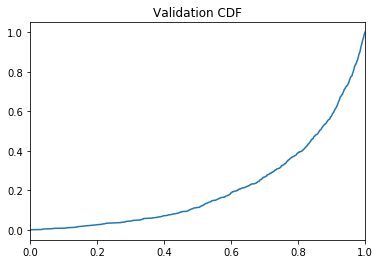

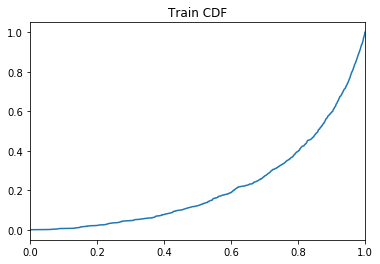

 72%|███████▏  | 352841/491198 [34:25<61:38:23,  1.60s/it]

Training Accuracy at epoch 6: 69.83436363636363
Validation Accuracy epoch 6: 69.79145454545454
Training AUC at epoch 6: 0.21869518181818182
Validation AUC epoch 6: 0.21354763636363638
Train: Sensitivity: 0.7993126297411364 Specificity: 0.3515316551110628
Val: Sensitivity: 0.7998719279303536 Specificity: 0.3530211272373818


 82%|████████▏ | 402795/491198 [37:53<06:00, 245.07it/s]  

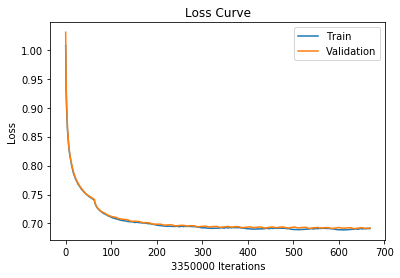

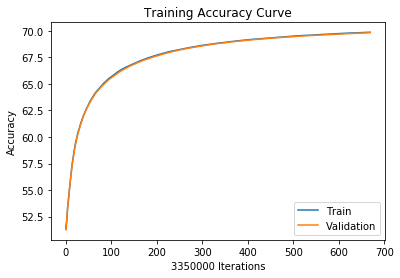

 82%|████████▏ | 402795/491198 [38:11<06:00, 245.07it/s]

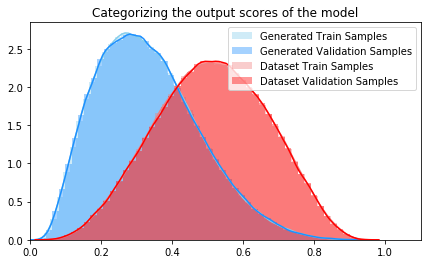

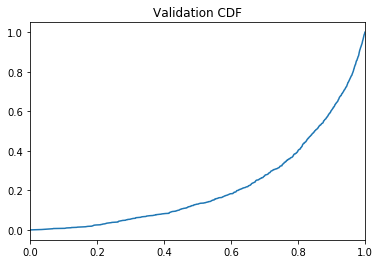

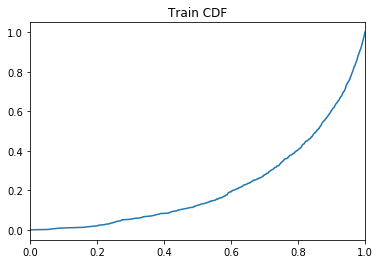

 82%|████████▏ | 402828/491198 [39:16<25:04:02,  1.02s/it]

Training Accuracy at epoch 6: 69.85208955223881
Validation Accuracy epoch 6: 69.80946268656716
Training AUC at epoch 6: 0.2215619090909091
Validation AUC epoch 6: 0.22067754545454546
Train: Sensitivity: 0.7993952895382924 Specificity: 0.35135149602913146
Val: Sensitivity: 0.7999165337505452 Specificity: 0.35281306682558866


 92%|█████████▏| 452801/491198 [42:42<02:29, 257.26it/s]  

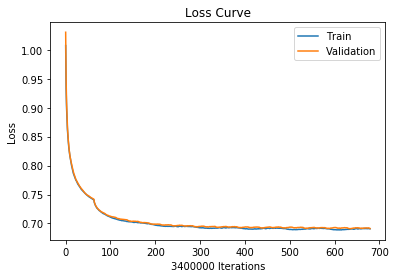

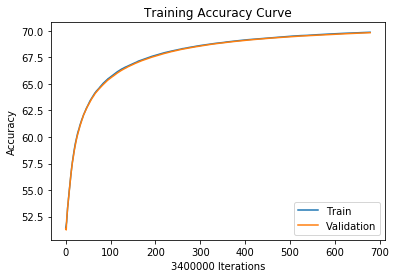

 92%|█████████▏| 452801/491198 [43:01<02:29, 257.26it/s]

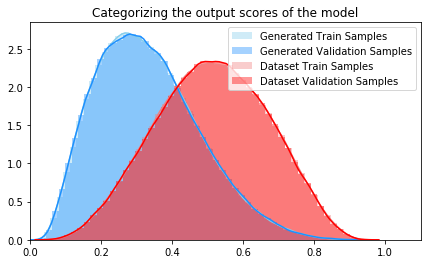

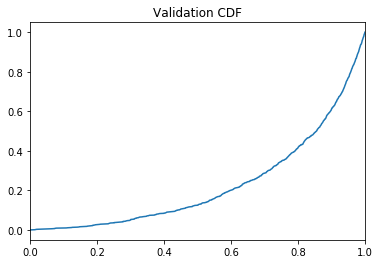

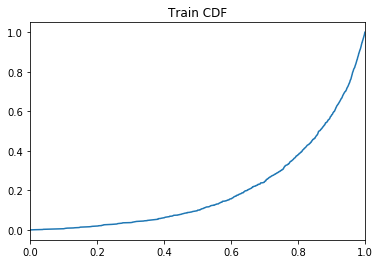

 92%|█████████▏| 452840/491198 [44:06<17:01:23,  1.60s/it]

Training Accuracy at epoch 6: 69.86832352941177
Validation Accuracy epoch 6: 69.82517647058823
Training AUC at epoch 6: 0.20380327272727275
Validation AUC epoch 6: 0.22649745454545453
Train: Sensitivity: 0.7994771650688687 Specificity: 0.3511866058031379
Val: Sensitivity: 0.8000352752350213 Specificity: 0.3526808645843446


  0%|          | 28/491198 [00:00<29:45, 275.06it/s]

Saving to:  model_checkpoints/binary/BlosumLinearNet/07292020.pth
Starting epoch: 7  with learning rate:  [0.00045000000000000004]


  2%|▏         | 11587/491198 [00:45<29:44, 268.76it/s]

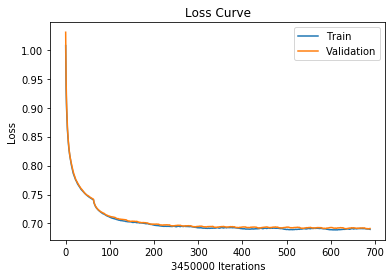

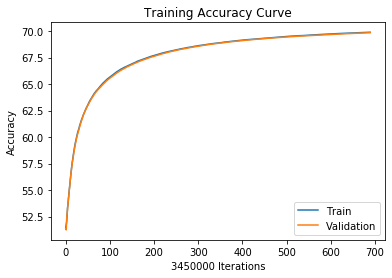

  2%|▏         | 11587/491198 [01:00<29:44, 268.76it/s]

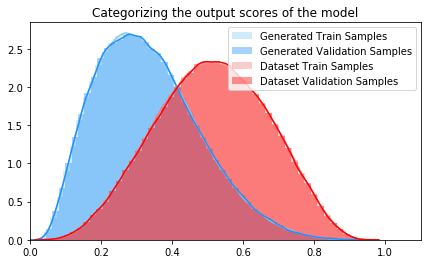

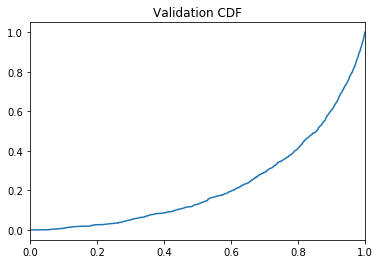

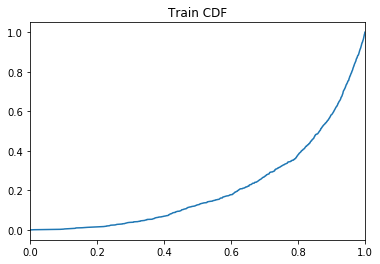

  2%|▏         | 11648/491198 [02:06<84:35:11,  1.57it/s] 

Training Accuracy at epoch 7: 69.88614492753624
Validation Accuracy epoch 7: 69.84040579710145
Training AUC at epoch 7: 0.2122098181818182
Validation AUC epoch 7: 0.22594054545454545
Train: Sensitivity: 0.7995576011372469 Specificity: 0.3509896896851783
Val: Sensitivity: 0.8001221389430377 Specificity: 0.3525311764306706


 13%|█▎        | 61593/491198 [05:22<29:05, 246.17it/s]  

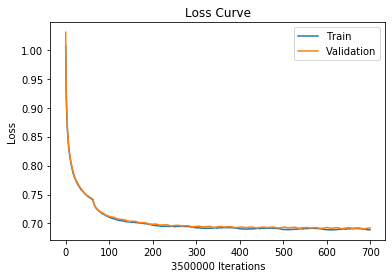

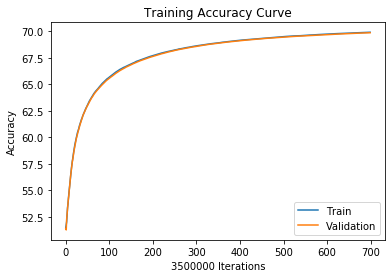

 13%|█▎        | 61593/491198 [05:40<29:05, 246.17it/s]

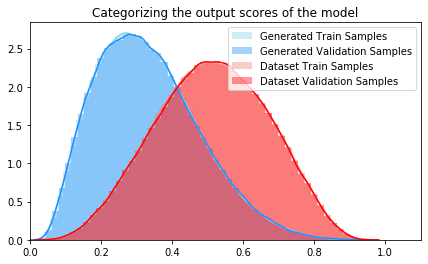

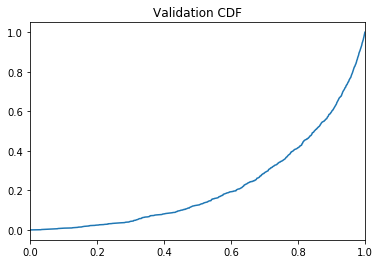

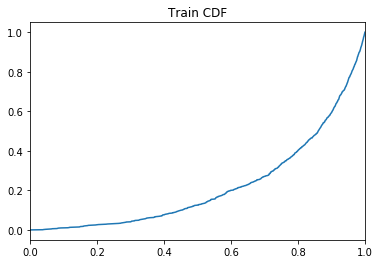

 13%|█▎        | 61645/491198 [06:45<98:47:51,  1.21it/s] 

Training Accuracy at epoch 7: 69.90237142857143
Validation Accuracy epoch 7: 69.85477142857142
Training AUC at epoch 7: 0.21939363636363635
Validation AUC epoch 7: 0.22282463636363636
Train: Sensitivity: 0.7996362777189491 Specificity: 0.3508317651743947
Val: Sensitivity: 0.8001359014252534 Specificity: 0.3523658099099895


 18%|█▊        | 87094/491198 [08:26<24:21, 276.47it/s]  

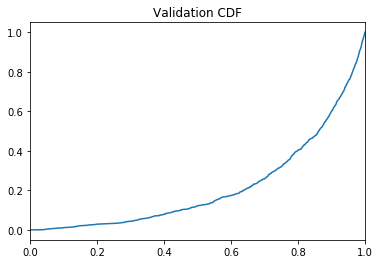

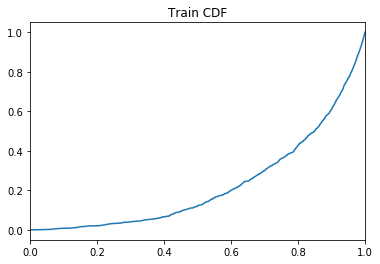

 23%|██▎       | 111630/491198 [11:18<358:46:38,  3.40s/it]

Training Accuracy at epoch 7: 69.9203661971831
Validation Accuracy epoch 7: 69.87205633802817
Training AUC at epoch 7: 0.22507145454545455
Validation AUC epoch 7: 0.21584036363636364
Train: Sensitivity: 0.7997262471388493 Specificity: 0.35065355373266033
Val: Sensitivity: 0.8002509511859467 Specificity: 0.3522092015945099


 33%|███▎      | 161578/491198 [14:14<23:00, 238.71it/s]   

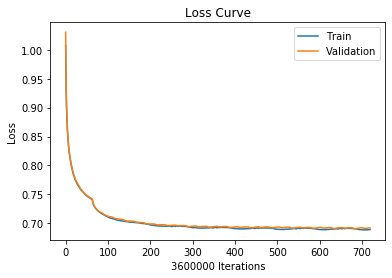

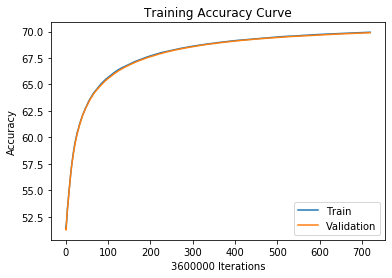

 33%|███▎      | 161578/491198 [14:30<23:00, 238.71it/s]

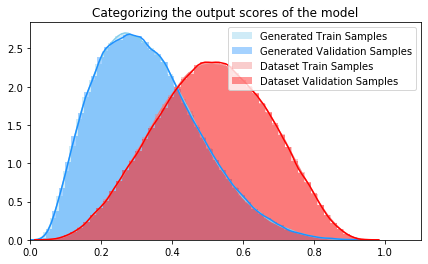

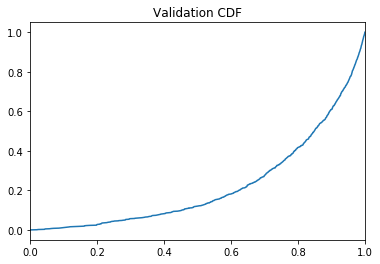

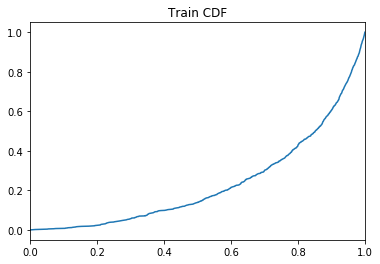

 33%|███▎      | 161643/491198 [15:37<44:54:57,  2.04it/s]

Training Accuracy at epoch 7: 69.93425
Validation Accuracy epoch 7: 69.88866666666667
Training AUC at epoch 7: 0.23261045454545454
Validation AUC epoch 7: 0.22268845454545455
Train: Sensitivity: 0.799790333573925 Specificity: 0.35052304464106826
Val: Sensitivity: 0.8002634378220257 Specificity: 0.3520123671078325


 43%|████▎     | 211607/491198 [18:43<17:50, 261.16it/s]  

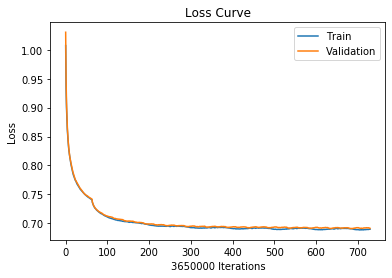

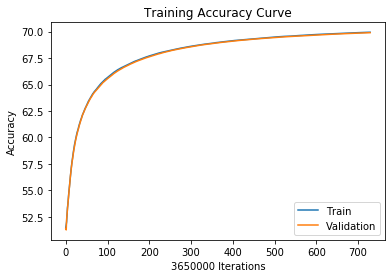

 43%|████▎     | 211607/491198 [19:00<17:50, 261.16it/s]

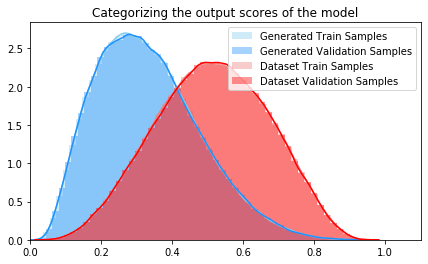

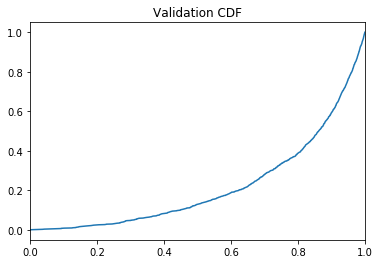

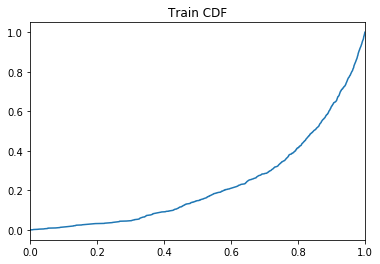

 43%|████▎     | 211649/491198 [20:04<188:24:19,  2.43s/it]

Training Accuracy at epoch 7: 69.94252054794521
Validation Accuracy epoch 7: 69.90046575342465
Training AUC at epoch 7: 0.23180299999999998
Validation AUC epoch 7: 0.2189249090909091
Train: Sensitivity: 0.7997818969516756 Specificity: 0.35042519496474683
Val: Sensitivity: 0.8004062755561091 Specificity: 0.35192698854071747


 44%|████▍     | 215594/491198 [20:19<18:58, 242.10it/s]   IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 94%|█████████▍| 461600/491198 [41:42<02:06, 234.27it/s]

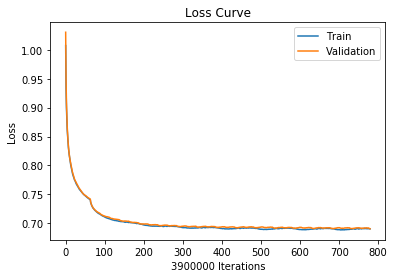

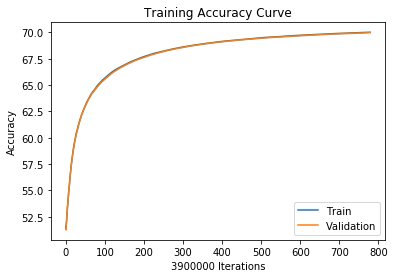

 94%|█████████▍| 461600/491198 [42:01<02:06, 234.27it/s]

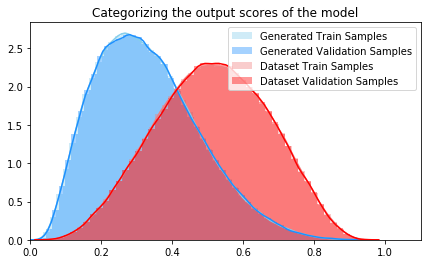

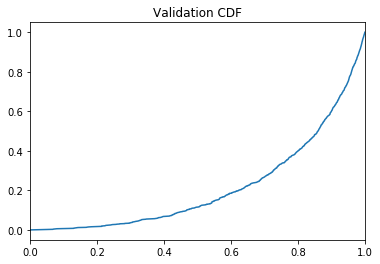

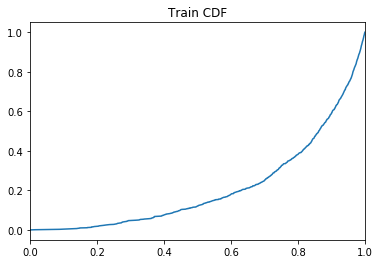

 94%|█████████▍| 461644/491198 [43:08<10:39:48,  1.30s/it]

Training Accuracy at epoch 7: 70.01394871794872
Validation Accuracy epoch 7: 69.97117948717948
Training AUC at epoch 7: 0.211567
Validation AUC epoch 7: 0.21489445454545456
Train: Sensitivity: 0.8001777670881118 Specificity: 0.3497183990914389
Val: Sensitivity: 0.8007775348884542 Specificity: 0.3512274546296657


  0%|          | 24/491198 [00:00<34:55, 234.35it/s]

Saving to:  model_checkpoints/binary/BlosumLinearNet/07292020.pth
Starting epoch: 8  with learning rate:  [0.00045000000000000004]


  4%|▍         | 20410/491198 [01:26<33:31, 234.07it/s]

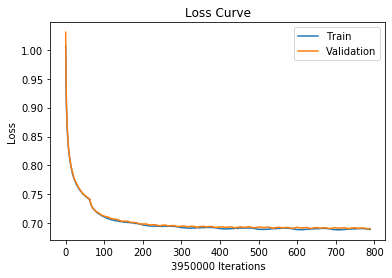

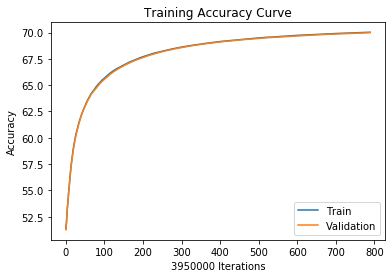

  4%|▍         | 20410/491198 [01:40<33:31, 234.07it/s]

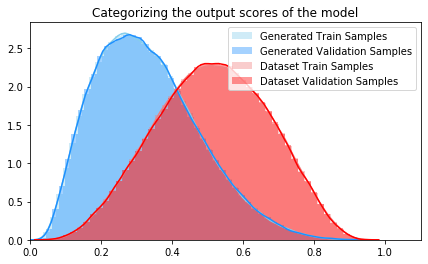

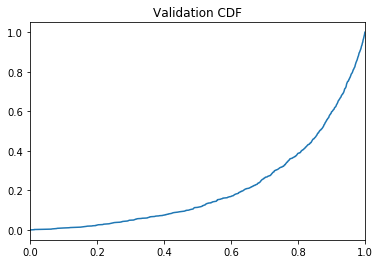

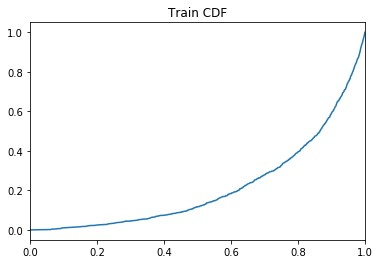

  4%|▍         | 20432/491198 [02:50<383:00:05,  2.93s/it]

Training Accuracy at epoch 8: 70.02731645569621
Validation Accuracy epoch 8: 69.98245569620254
Training AUC at epoch 8: 0.21557418181818183
Validation AUC epoch 8: 0.21241454545454547
Train: Sensitivity: 0.8002337221855763 Specificity: 0.34957708227175477
Val: Sensitivity: 0.800822972548451 Specificity: 0.3511106811852953


  6%|▌         | 30420/491198 [03:29<31:47, 241.61it/s]   IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 35%|███▍      | 170404/491198 [15:23<22:41, 235.60it/s]

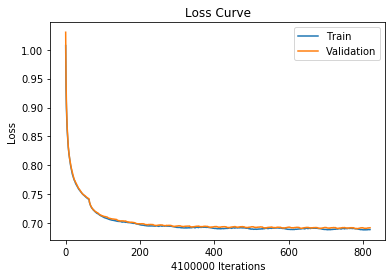

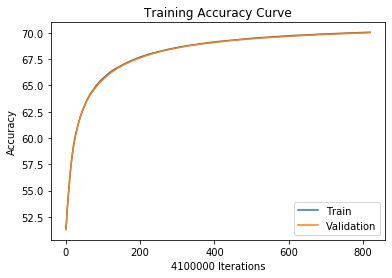

 35%|███▍      | 170404/491198 [15:40<22:41, 235.60it/s]

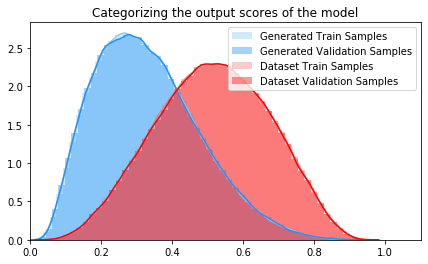

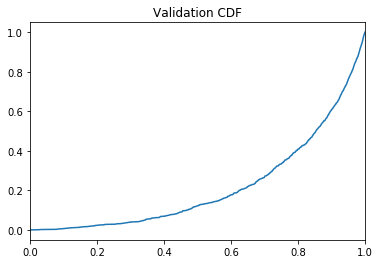

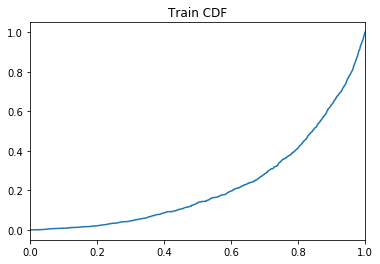

 35%|███▍      | 170447/491198 [16:49<133:19:11,  1.50s/it]

Training Accuracy at epoch 8: 70.06539024390244
Validation Accuracy epoch 8: 70.02043902439024
Training AUC at epoch 8: 0.22708227272727272
Validation AUC epoch 8: 0.21618872727272725
Train: Sensitivity: 0.8004139910833816 Specificity: 0.3492013093924289
Val: Sensitivity: 0.8009464969152396 Specificity: 0.35070914642474765


 45%|████▍     | 220414/491198 [19:58<15:50, 284.83it/s]   

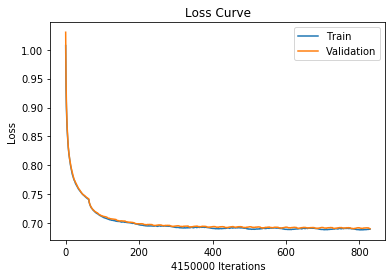

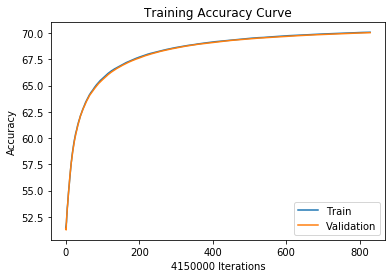

 45%|████▍     | 220414/491198 [20:10<15:50, 284.83it/s]

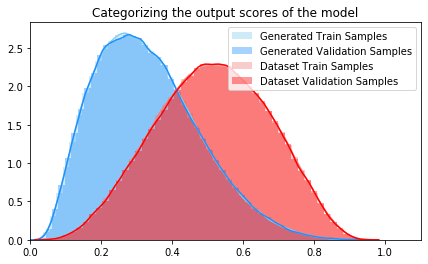

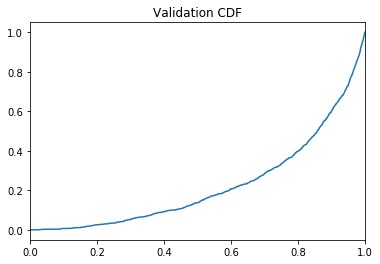

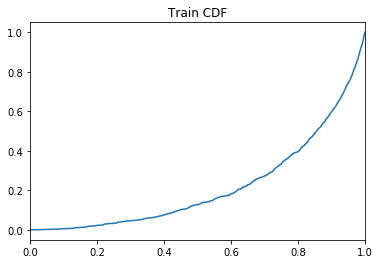

 45%|████▍     | 220432/491198 [21:25<687:50:32,  9.15s/it]

Training Accuracy at epoch 8: 70.07081927710843
Validation Accuracy epoch 8: 70.0309156626506
Training AUC at epoch 8: 0.2179790909090909
Validation AUC epoch 8: 0.22389309090909093
Train: Sensitivity: 0.800399038548425 Specificity: 0.3491367797084948
Val: Sensitivity: 0.8010951864903076 Specificity: 0.3506342889687771


 55%|█████▌    | 270401/491198 [24:40<14:15, 258.07it/s]   

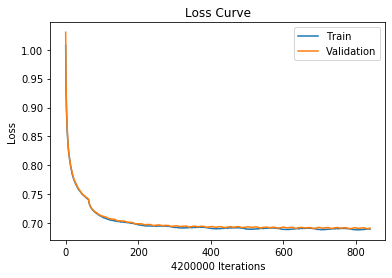

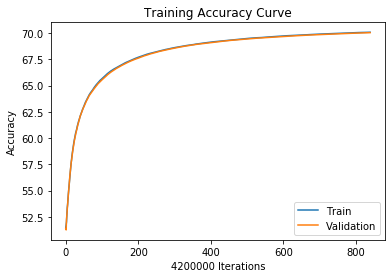

 55%|█████▌    | 270401/491198 [24:50<14:15, 258.07it/s]

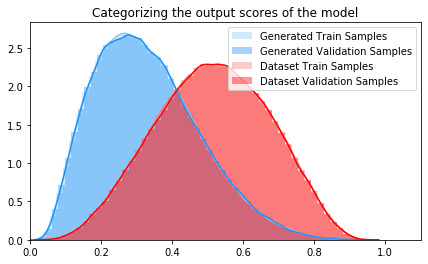

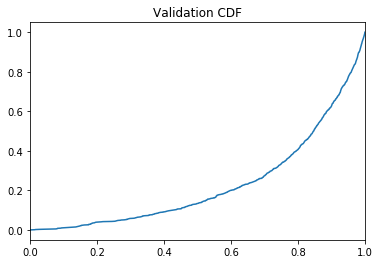

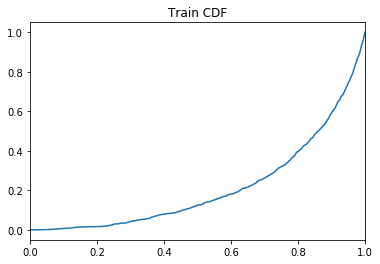

 55%|█████▌    | 270453/491198 [26:05<72:48:20,  1.19s/it] 

Training Accuracy at epoch 8: 70.08157142857142
Validation Accuracy epoch 8: 70.04264285714285
Training AUC at epoch 8: 0.21365718181818183
Validation AUC epoch 8: 0.22914254545454546
Train: Sensitivity: 0.8004679433127445 Specificity: 0.3490422779428328
Val: Sensitivity: 0.8011115474197386 Specificity: 0.3505023350999256


 65%|██████▌   | 320390/491198 [29:23<11:07, 255.71it/s]  

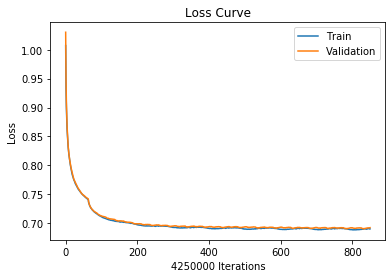

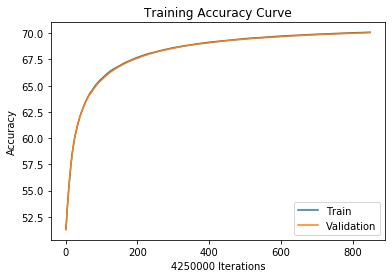

 65%|██████▌   | 320390/491198 [29:40<11:07, 255.71it/s]

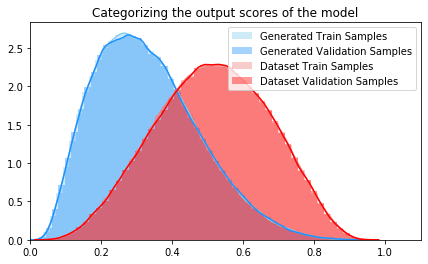

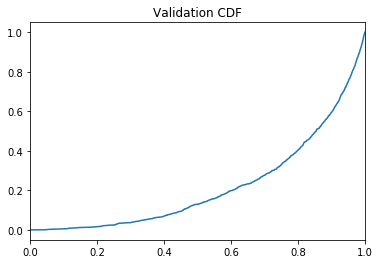

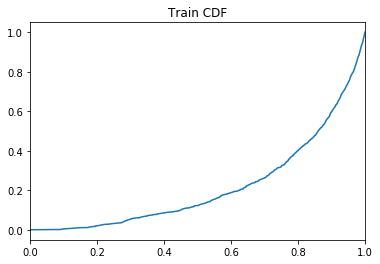

 65%|██████▌   | 320462/491198 [30:48<32:50:20,  1.44it/s]

Training Accuracy at epoch 8: 70.09696470588236
Validation Accuracy epoch 8: 70.05449411764705
Training AUC at epoch 8: 0.21753609090909093
Validation AUC epoch 8: 0.21826772727272725
Train: Sensitivity: 0.8005669757765946 Specificity: 0.34890199332615335
Val: Sensitivity: 0.8011505061120637 Specificity: 0.3503768394111616


 75%|███████▌  | 370392/491198 [33:51<08:13, 244.75it/s]  

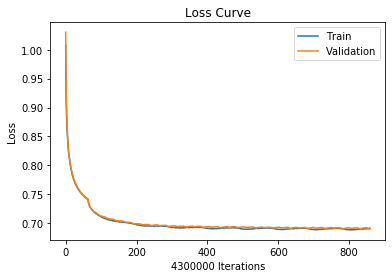

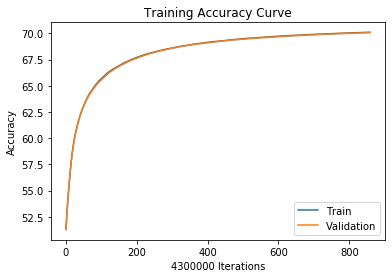

 75%|███████▌  | 370392/491198 [34:10<08:13, 244.75it/s]

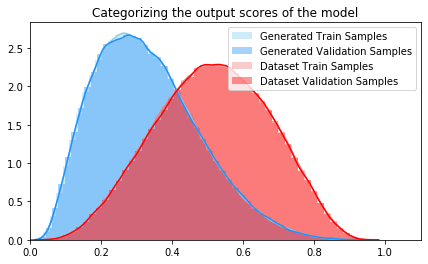

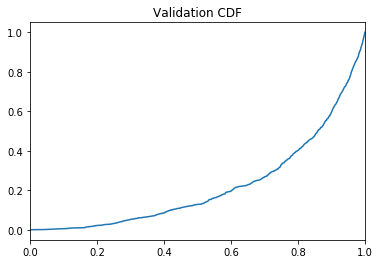

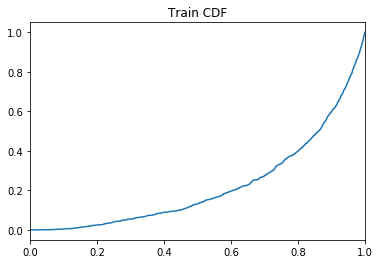

 75%|███████▌  | 370448/491198 [35:20<26:22:48,  1.27it/s]

Training Accuracy at epoch 8: 70.10644186046511
Validation Accuracy epoch 8: 70.06711627906977
Training AUC at epoch 8: 0.22172618181818182
Validation AUC epoch 8: 0.22109072727272727
Train: Sensitivity: 0.8006032148228056 Specificity: 0.34879068991442297
Val: Sensitivity: 0.8012615503177742 Specificity: 0.35026836790066973


 86%|████████▌ | 420390/491198 [38:50<05:09, 228.97it/s]  

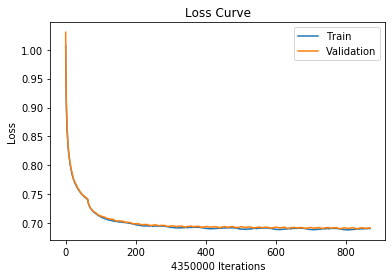

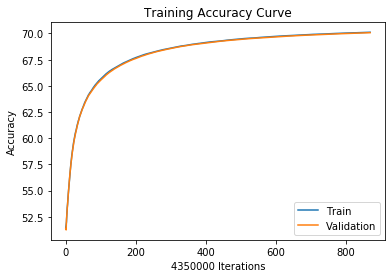

 86%|████████▌ | 420390/491198 [39:00<05:09, 228.97it/s]

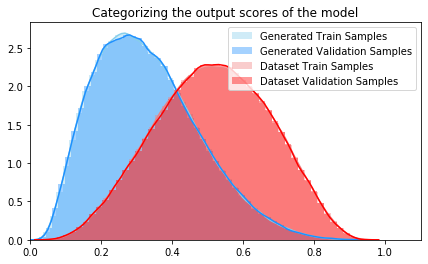

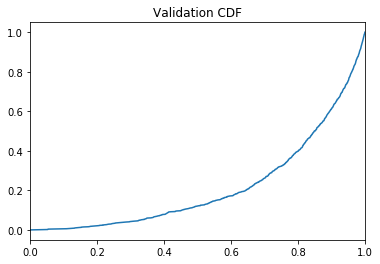

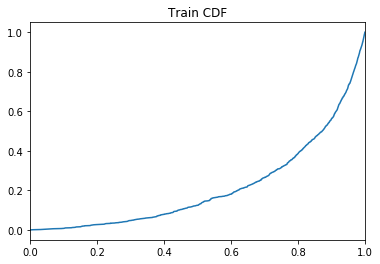

 86%|████████▌ | 420432/491198 [40:17<13:50:49,  1.42it/s]

Training Accuracy at epoch 8: 70.11887356321839
Validation Accuracy epoch 8: 70.07666666666667
Training AUC at epoch 8: 0.21331563636363637
Validation AUC epoch 8: 0.2165600909090909
Train: Sensitivity: 0.8006787210350496 Specificity: 0.34866661812504895
Val: Sensitivity: 0.8012654481123208 Specificity: 0.35015529321791034


 96%|█████████▌| 470395/491198 [43:30<01:19, 261.38it/s]  

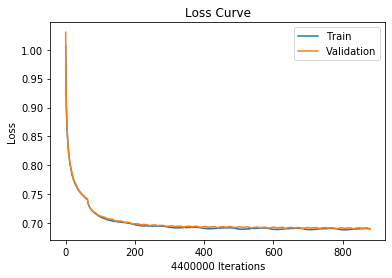

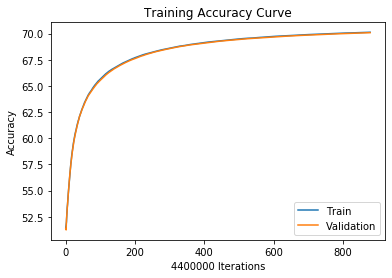

 96%|█████████▌| 470395/491198 [43:40<01:19, 261.38it/s]

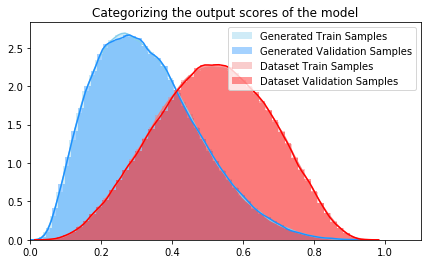

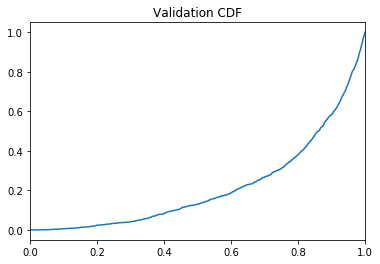

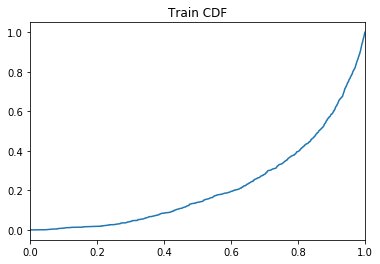

 96%|█████████▌| 470447/491198 [44:57<5:02:34,  1.14it/s]

Training Accuracy at epoch 8: 70.12927272727272
Validation Accuracy epoch 8: 70.08770454545454
Training AUC at epoch 8: 0.219677
Validation AUC epoch 8: 0.21539963636363635
Train: Sensitivity: 0.8007289284547533 Specificity: 0.3485583747338538
Val: Sensitivity: 0.8013663092355586 Specificity: 0.3500658262461093


  0%|          | 27/491198 [00:00<30:23, 269.31it/s]

Saving to:  model_checkpoints/binary/BlosumLinearNet/07292020.pth
Starting epoch: 9  with learning rate:  [0.00045000000000000004]


  6%|▌         | 29202/491198 [01:55<33:28, 229.98it/s]

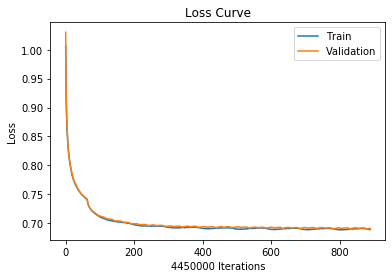

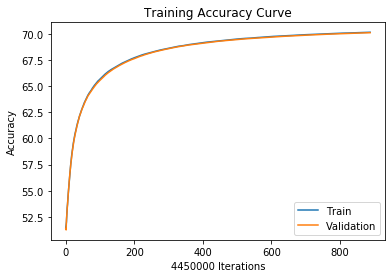

  6%|▌         | 29202/491198 [02:10<33:28, 229.98it/s]

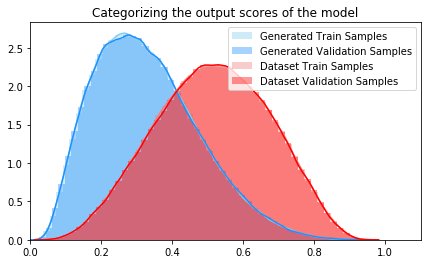

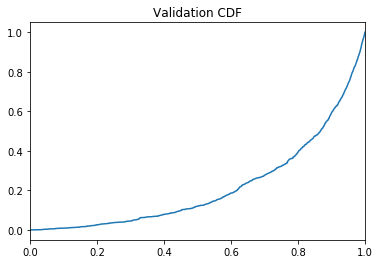

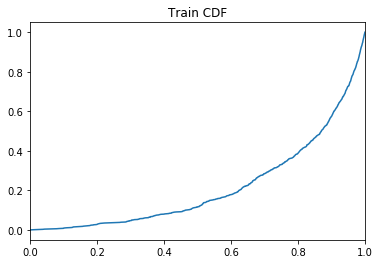

  6%|▌         | 29251/491198 [03:22<146:58:13,  1.15s/it]

Training Accuracy at epoch 9: 70.14020224719101
Validation Accuracy epoch 9: 70.09622471910113
Training AUC at epoch 9: 0.21500309090909092
Validation AUC epoch 9: 0.21645627272727272
Train: Sensitivity: 0.8007738154105117 Specificity: 0.34843816589221416
Val: Sensitivity: 0.801379862107285 Specificity: 0.3499639640127833


 16%|█▌        | 79192/491198 [06:39<28:38, 239.72it/s]   

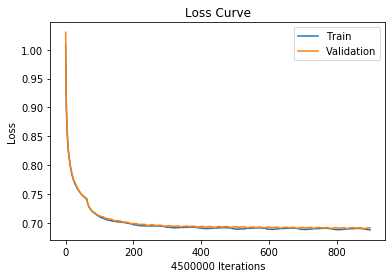

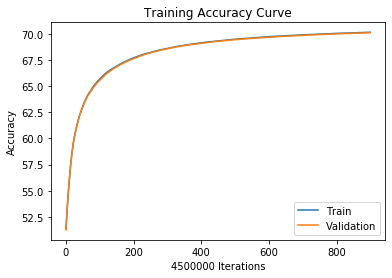

 16%|█▌        | 79192/491198 [06:50<28:38, 239.72it/s]

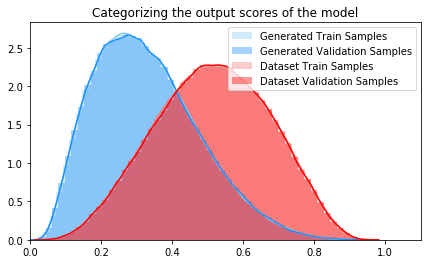

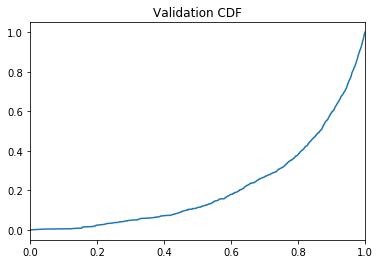

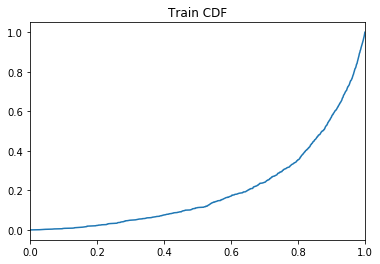

 16%|█▌        | 79249/491198 [08:08<82:05:51,  1.39it/s] 

Training Accuracy at epoch 9: 70.15304444444445
Validation Accuracy epoch 9: 70.10648888888889
Training AUC at epoch 9: 0.2044269090909091
Validation AUC epoch 9: 0.21238363636363636
Train: Sensitivity: 0.8008410754434299 Specificity: 0.34831325297183674
Val: Sensitivity: 0.8014312970799691 Specificity: 0.34986014759035133


 26%|██▋       | 129182/491198 [11:20<25:36, 235.56it/s] 

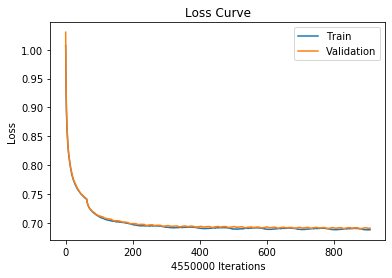

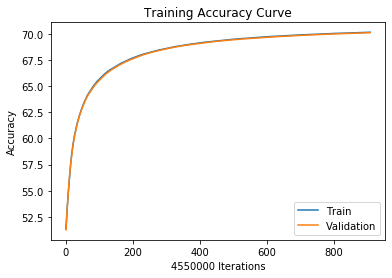

 26%|██▋       | 129182/491198 [11:40<25:36, 235.56it/s]

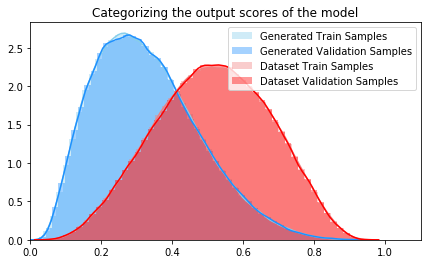

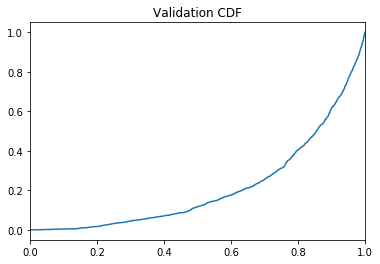

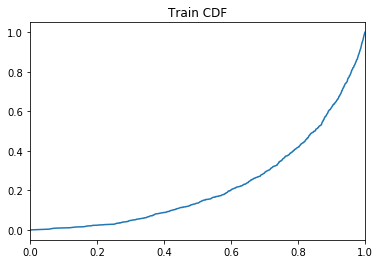

 26%|██▋       | 129234/491198 [12:48<51:59:00,  1.93it/s]

Training Accuracy at epoch 9: 70.16076923076923
Validation Accuracy epoch 9: 70.11789010989011
Training AUC at epoch 9: 0.22766736363636364
Validation AUC epoch 9: 0.21376099999999998
Train: Sensitivity: 0.8008691850239815 Specificity: 0.3482343386590119
Val: Sensitivity: 0.8014764809840422 Specificity: 0.349748882264288


 36%|███▋      | 179206/491198 [15:55<15:12, 341.82it/s]  

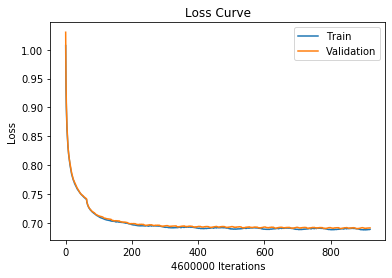

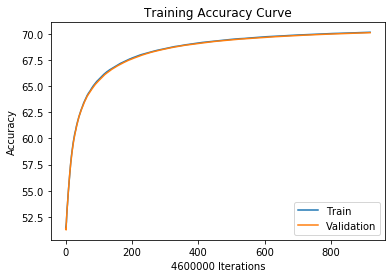

 36%|███▋      | 179206/491198 [16:10<15:12, 341.82it/s]

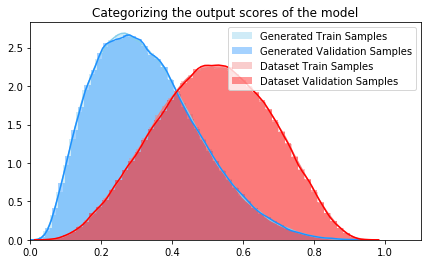

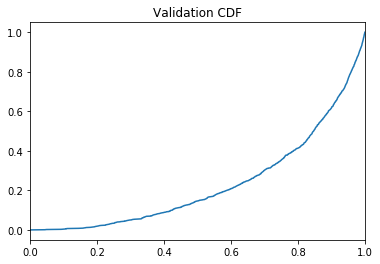

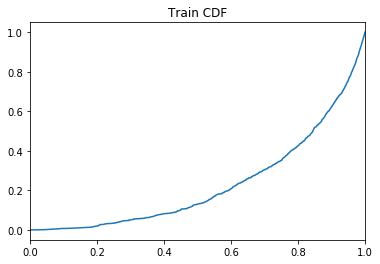

 36%|███▋      | 179255/491198 [17:24<134:24:04,  1.55s/it]

Training Accuracy at epoch 9: 70.17021739130435
Validation Accuracy epoch 9: 70.1270652173913
Training AUC at epoch 9: 0.22919490909090912
Validation AUC epoch 9: 0.22995563636363636
Train: Sensitivity: 0.8009050626821892 Specificity: 0.3481375442392033
Val: Sensitivity: 0.8015176773006047 Specificity: 0.34964843779451876


 47%|████▋     | 229202/491198 [20:45<18:58, 230.12it/s]   

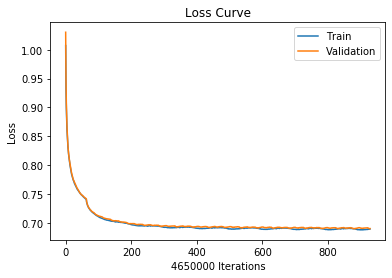

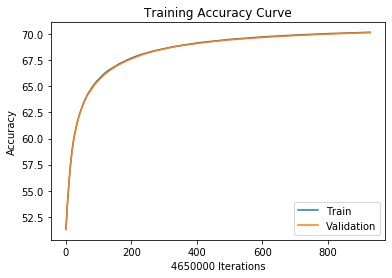

 47%|████▋     | 229202/491198 [21:00<18:58, 230.12it/s]

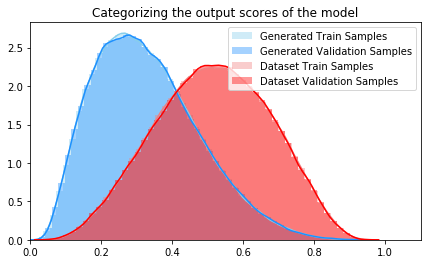

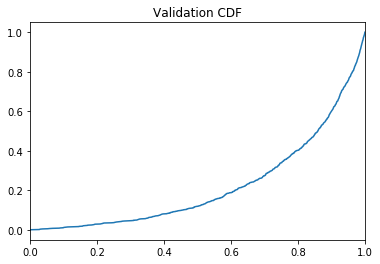

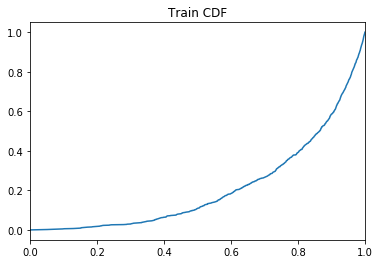

 47%|████▋     | 229251/491198 [22:20<90:59:50,  1.25s/it] 

Training Accuracy at epoch 9: 70.1752258064516
Validation Accuracy epoch 9: 70.13621505376344
Training AUC at epoch 9: 0.21079727272727272
Validation AUC epoch 9: 0.22065490909090907
Train: Sensitivity: 0.8009069933248428 Specificity: 0.3480879655107672
Val: Sensitivity: 0.8016380582033447 Specificity: 0.3495861209857076


 57%|█████▋    | 279204/491198 [25:43<15:07, 233.61it/s]  

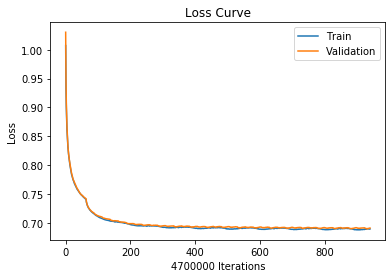

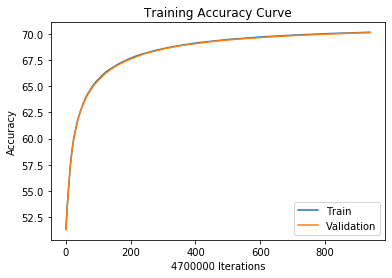

 57%|█████▋    | 279204/491198 [26:00<15:07, 233.61it/s]

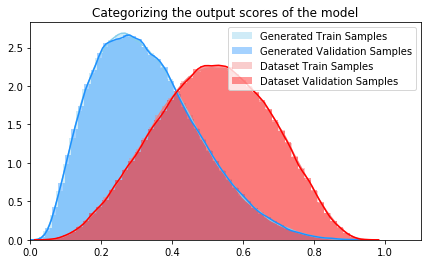

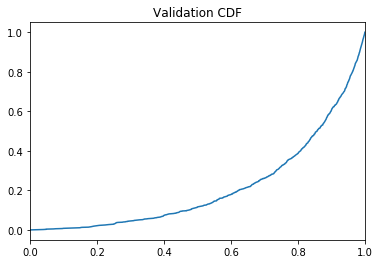

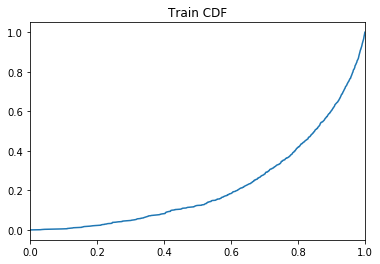

 57%|█████▋    | 279250/491198 [27:11<78:02:18,  1.33s/it] 

Training Accuracy at epoch 9: 70.18368085106383
Validation Accuracy epoch 9: 70.14793617021276
Training AUC at epoch 9: 0.2218750909090909
Validation AUC epoch 9: 0.21385272727272728
Train: Sensitivity: 0.8009504377367272 Specificity: 0.34800916204039906
Val: Sensitivity: 0.8016420721976446 Specificity: 0.34944240900874995


 67%|██████▋   | 329200/491198 [30:24<10:44, 251.44it/s]  

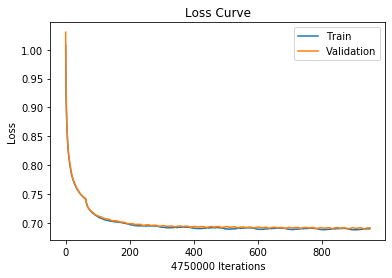

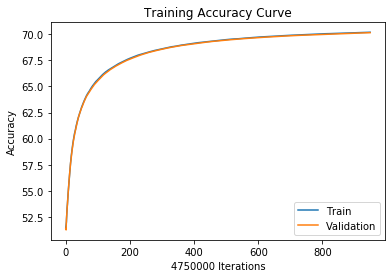

 67%|██████▋   | 329200/491198 [30:40<10:44, 251.44it/s]

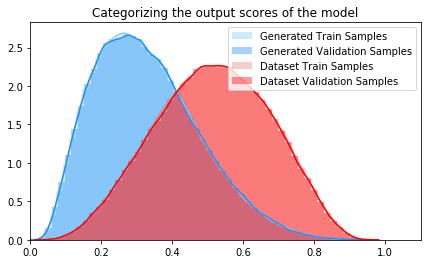

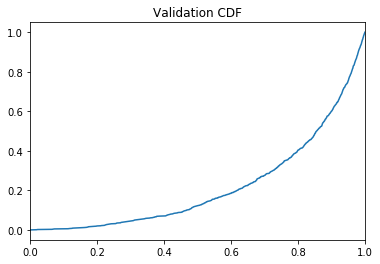

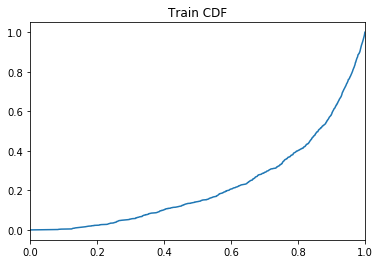

 67%|██████▋   | 329234/491198 [31:54<47:15:00,  1.05s/it]

Training Accuracy at epoch 9: 70.19753684210527
Validation Accuracy epoch 9: 70.15633684210526
Training AUC at epoch 9: 0.22568381818181815
Validation AUC epoch 9: 0.21812781818181817
Train: Sensitivity: 0.8010516671414387 Specificity: 0.34788748396636077
Val: Sensitivity: 0.8016967397670495 Specificity: 0.3493719782827022


 77%|███████▋  | 379201/491198 [35:20<07:01, 265.41it/s]  

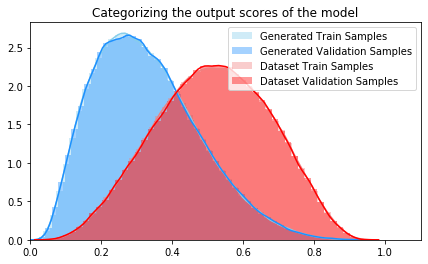

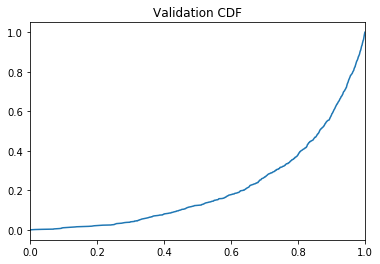

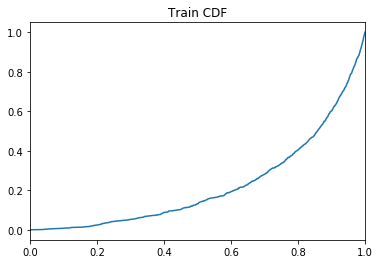

 77%|███████▋  | 379254/491198 [36:35<34:35:54,  1.11s/it]

Training Accuracy at epoch 9: 70.20533333333333
Validation Accuracy epoch 9: 70.16647916666666
Training AUC at epoch 9: 0.22328727272727272
Validation AUC epoch 9: 0.2129019090909091
Train: Sensitivity: 0.8010922052977619 Specificity: 0.34780143905351835
Val: Sensitivity: 0.8017525415311327 Specificity: 0.34927135130241355


 87%|████████▋ | 429206/491198 [39:47<04:14, 244.06it/s]  

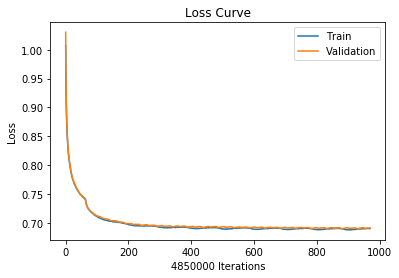

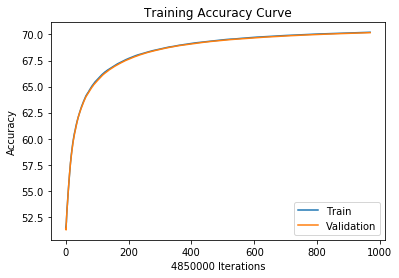

 87%|████████▋ | 429206/491198 [40:01<04:14, 244.06it/s]

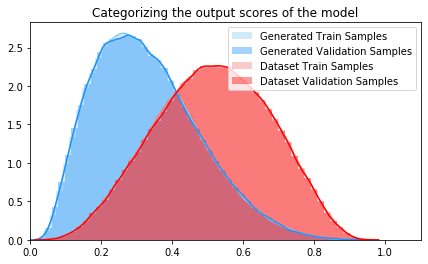

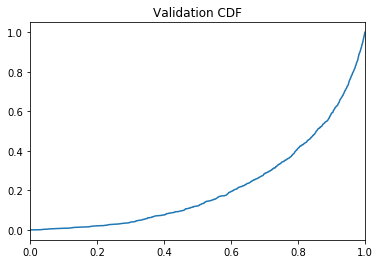

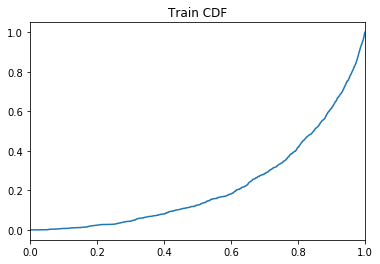

 87%|████████▋ | 429254/491198 [41:17<27:08:58,  1.58s/it]

Training Accuracy at epoch 9: 70.21463917525773
Validation Accuracy epoch 9: 70.17432989690721
Training AUC at epoch 9: 0.22370445454545457
Validation AUC epoch 9: 0.21814354545454545
Train: Sensitivity: 0.8011310084825636 Specificity: 0.3477014728071505
Val: Sensitivity: 0.8017734445382969 Specificity: 0.3491808297929407


 98%|█████████▊| 479187/491198 [44:33<00:54, 219.50it/s]  

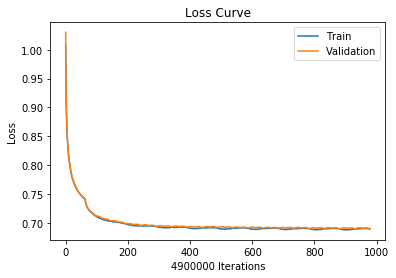

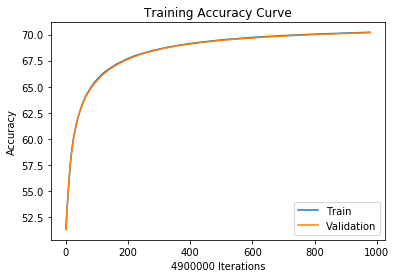

 98%|█████████▊| 479187/491198 [44:51<00:54, 219.50it/s]

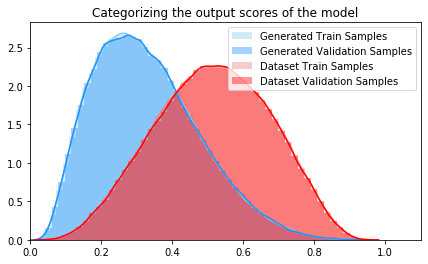

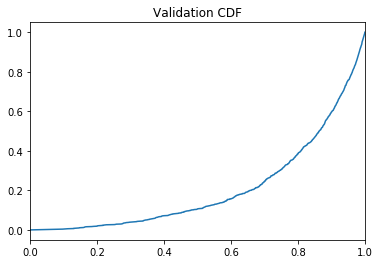

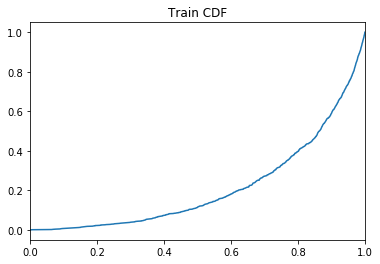

 98%|█████████▊| 479250/491198 [46:12<2:14:20,  1.48it/s]

Training Accuracy at epoch 9: 70.22516326530612
Validation Accuracy epoch 9: 70.18357142857143
Training AUC at epoch 9: 0.213032
Validation AUC epoch 9: 0.20653263636363636
Train: Sensitivity: 0.801185045471825 Specificity: 0.347584995016179
Val: Sensitivity: 0.8018652135258221 Specificity: 0.34910782764579235


 98%|█████████▊| 479634/491198 [46:14<02:39, 72.72it/s]  IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 48%|████▊     | 237983/491198 [22:19<18:40, 226.02it/s]

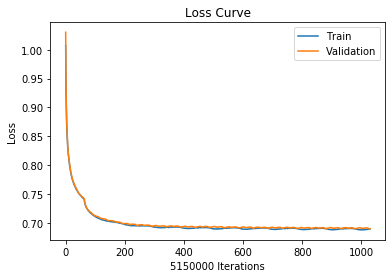

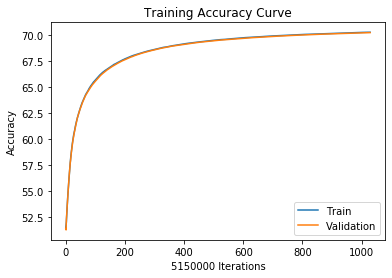

 48%|████▊     | 237983/491198 [22:30<18:40, 226.02it/s]

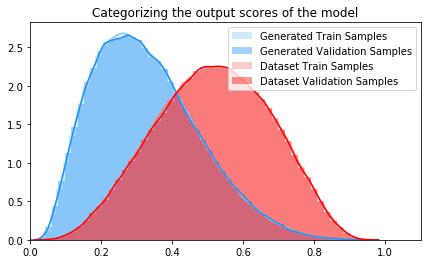

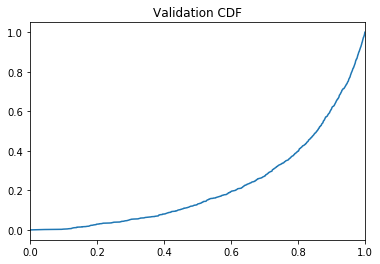

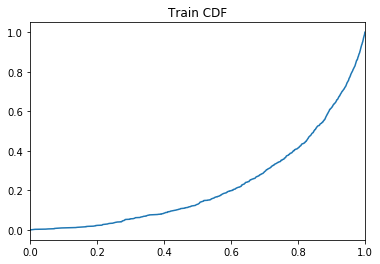

 48%|████▊     | 238036/491198 [23:57<39:20:57,  1.79it/s]

Training Accuracy at epoch 10: 70.26077669902912
Validation Accuracy epoch 10: 70.2255145631068
Training AUC at epoch 10: 0.2274060909090909
Validation AUC epoch 10: 0.22198136363636364
Train: Sensitivity: 0.8013213561554949 Specificity: 0.3472228837175054
Val: Sensitivity: 0.8020984973048959 Specificity: 0.34869162488016836


 59%|█████▊    | 287989/491198 [27:18<13:40, 247.74it/s]  

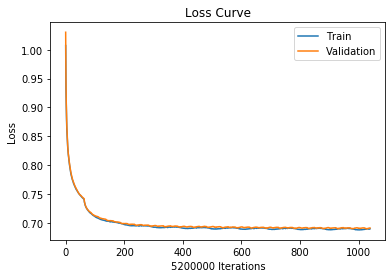

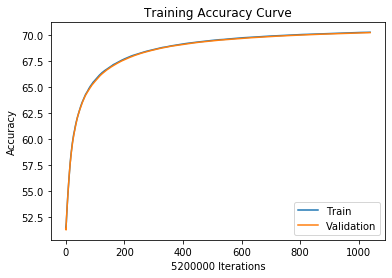

 59%|█████▊    | 287989/491198 [27:30<13:40, 247.74it/s]

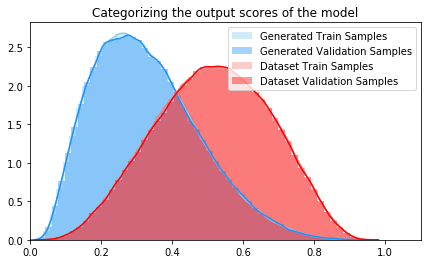

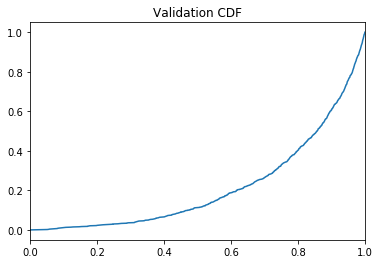

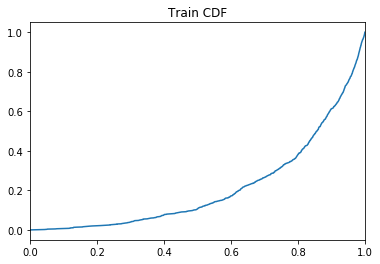

 59%|█████▊    | 288054/491198 [29:01<39:10:56,  1.44it/s]

Training Accuracy at epoch 10: 70.26951923076923
Validation Accuracy epoch 10: 70.23476923076923
Training AUC at epoch 10: 0.2128713636363636
Validation AUC epoch 10: 0.21551463636363638
Train: Sensitivity: 0.801380016973716 Specificity: 0.3471492632742191
Val: Sensitivity: 0.8020901078055006 Specificity: 0.3485745608620289


 61%|██████    | 297330/491198 [29:42<13:44, 235.13it/s]  IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 99%|█████████▉| 488008/491198 [49:10<00:13, 232.06it/s]

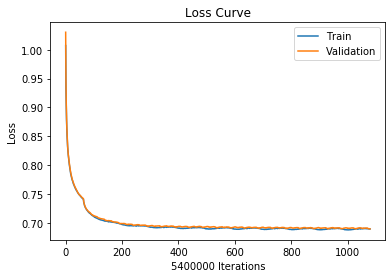

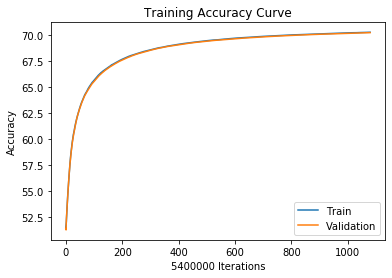

 99%|█████████▉| 488008/491198 [49:21<00:13, 232.06it/s]

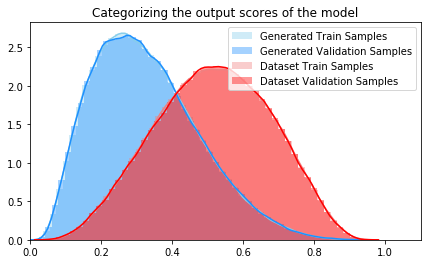

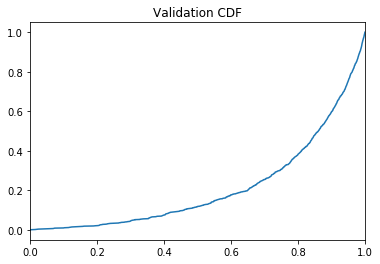

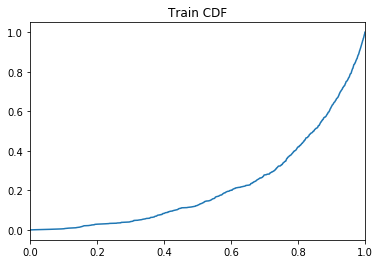

 99%|█████████▉| 488052/491198 [50:54<1:35:52,  1.83s/it]

Training Accuracy at epoch 10: 70.30298148148148
Validation Accuracy epoch 10: 70.26605555555555
Training AUC at epoch 10: 0.2241922727272727
Validation AUC epoch 10: 0.21265090909090908
Train: Sensitivity: 0.8015484266520815 Specificity: 0.34679451287793955
Val: Sensitivity: 0.8023010061564888 Specificity: 0.3482829001997399


  0%|          | 24/491198 [00:00<35:18, 231.86it/s]

Saving to:  model_checkpoints/binary/BlosumLinearNet/07292020.pth
Starting epoch: 11  with learning rate:  [0.00040500000000000003]


 10%|▉         | 46809/491198 [03:09<32:09, 230.33it/s]

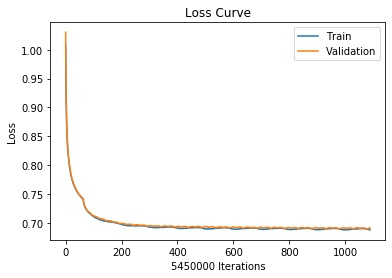

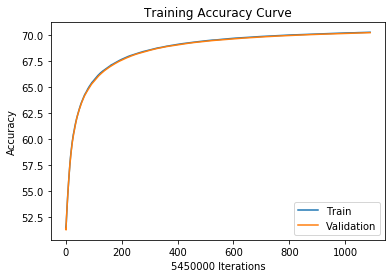

 10%|▉         | 46809/491198 [03:20<32:09, 230.33it/s]

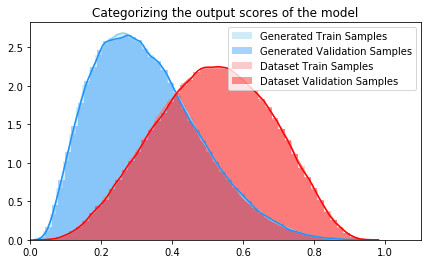

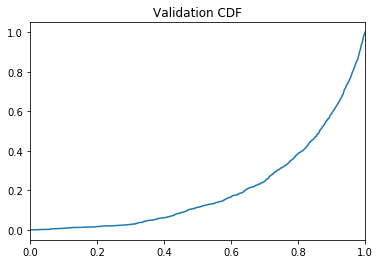

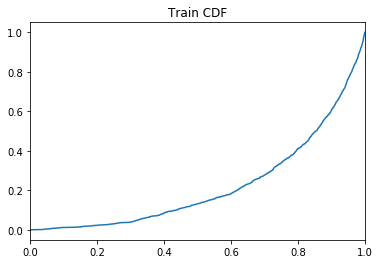

 10%|▉         | 46851/491198 [04:57<214:21:06,  1.74s/it]

Training Accuracy at epoch 11: 70.31225688073394
Validation Accuracy epoch 11: 70.27179816513761
Training AUC at epoch 11: 0.22226809090909092
Validation AUC epoch 11: 0.20618309090909093
Train: Sensitivity: 0.8015936476934219 Specificity: 0.346693630968532
Val: Sensitivity: 0.8022891003124359 Specificity: 0.3482087935432591


 18%|█▊        | 87511/491198 [07:54<28:56, 232.43it/s]   IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



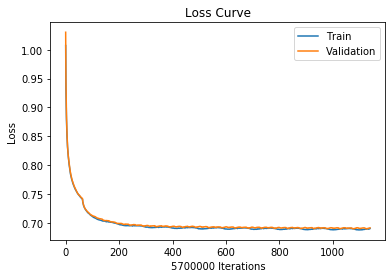

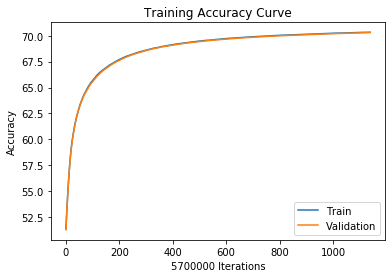

 60%|██████    | 296808/491198 [28:40<13:08, 246.40it/s]

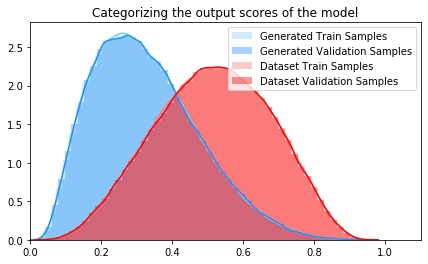

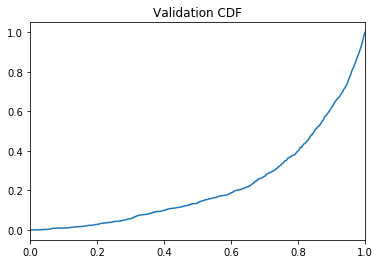

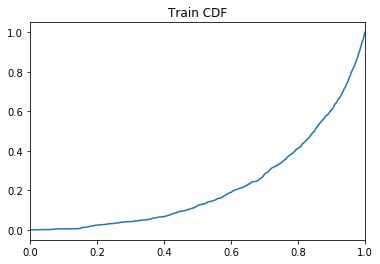

 60%|██████    | 296854/491198 [30:12<85:22:56,  1.58s/it] 

Training Accuracy at epoch 11: 70.34087719298246
Validation Accuracy epoch 11: 70.30850877192982
Training AUC at epoch 11: 0.2199008181818182
Validation AUC epoch 11: 0.225911
Train: Sensitivity: 0.8017197589750704 Specificity: 0.34642812388136807
Val: Sensitivity: 0.8024654535135768 Specificity: 0.34783781933616603


 71%|███████   | 346810/491198 [33:38<09:12, 261.26it/s]  

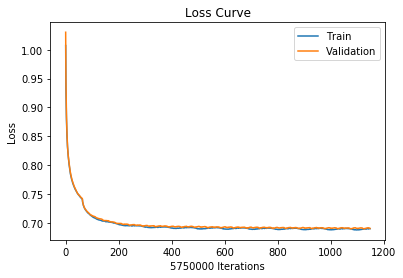

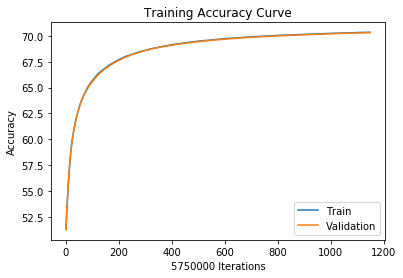

 71%|███████   | 346810/491198 [33:50<09:12, 261.26it/s]

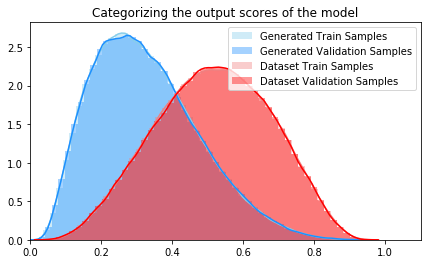

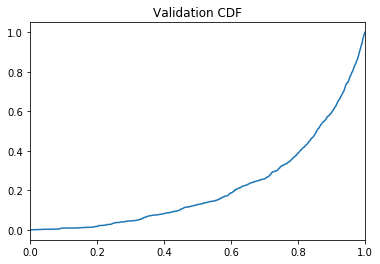

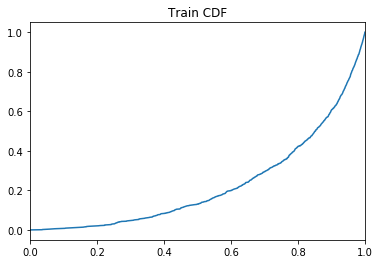

 71%|███████   | 346838/491198 [35:21<72:07:01,  1.80s/it] 

Training Accuracy at epoch 11: 70.3516347826087
Validation Accuracy epoch 11: 70.3152
Training AUC at epoch 11: 0.22493027272727273
Validation AUC epoch 11: 0.21699927272727276
Train: Sensitivity: 0.8017852057111283 Specificity: 0.34631397987220475
Val: Sensitivity: 0.8025413929674682 Specificity: 0.3477894885258373


 80%|███████▉  | 392000/491198 [38:25<06:51, 240.78it/s]  IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 32%|███▏      | 155620/491198 [15:41<24:24, 229.17it/s]

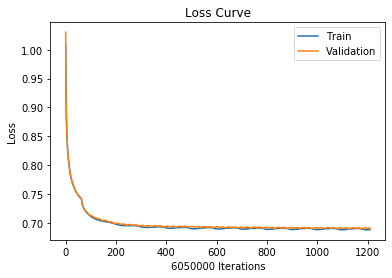

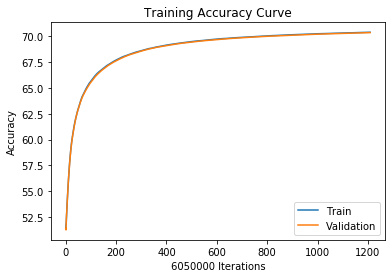

 32%|███▏      | 155620/491198 [16:00<24:24, 229.17it/s]

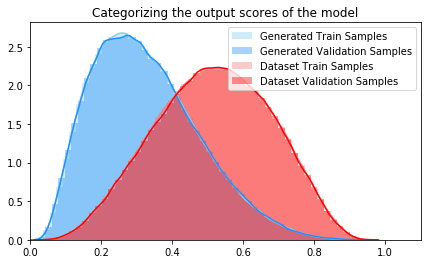

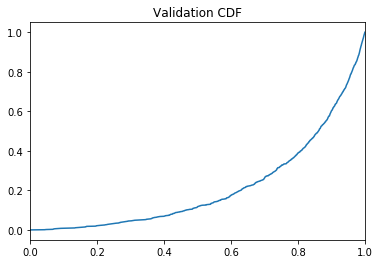

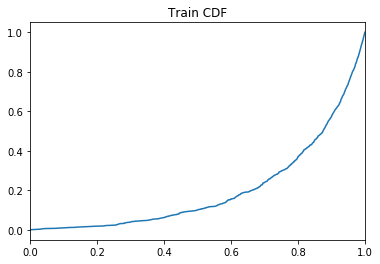

 32%|███▏      | 155661/491198 [17:25<505:49:26,  5.43s/it]

Training Accuracy at epoch 12: 70.39019834710744
Validation Accuracy epoch 12: 70.35401652892563
Training AUC at epoch 12: 0.2011700909090909
Validation AUC epoch 12: 0.2131218181818182
Train: Sensitivity: 0.8019744315045473 Specificity: 0.3459185008767568
Val: Sensitivity: 0.8026926277185933 Specificity: 0.3473773692337097


 42%|████▏     | 205616/491198 [20:36<18:38, 255.38it/s]   

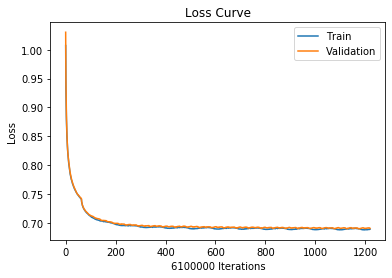

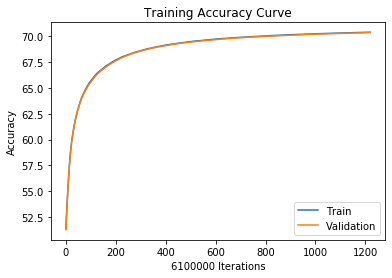

 42%|████▏     | 205616/491198 [20:50<18:38, 255.38it/s]

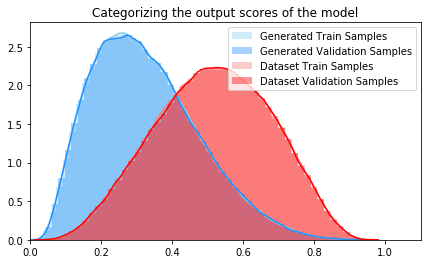

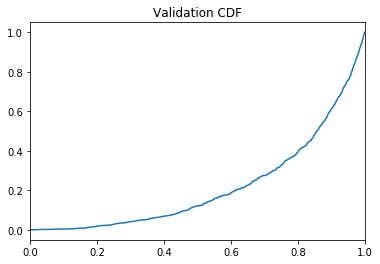

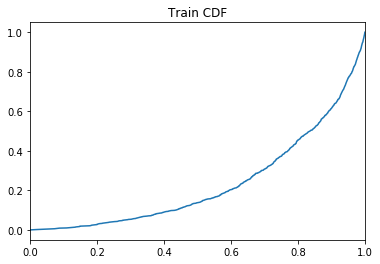

 42%|████▏     | 205654/491198 [22:22<220:43:14,  2.78s/it]

Training Accuracy at epoch 12: 70.39198360655737
Validation Accuracy epoch 12: 70.3587868852459
Training AUC at epoch 12: 0.2342727272727273
Validation AUC epoch 12: 0.217038
Train: Sensitivity: 0.801950431044969 Specificity: 0.34589179783631274
Val: Sensitivity: 0.8027586406810122 Specificity: 0.347345749775442


 42%|████▏     | 208600/491198 [22:35<21:49, 215.77it/s]   IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 93%|█████████▎| 455585/491198 [46:32<02:25, 245.03it/s]

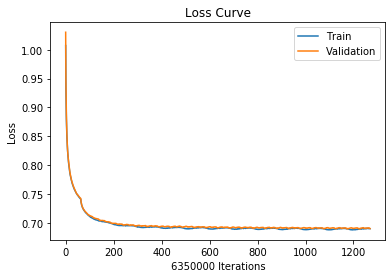

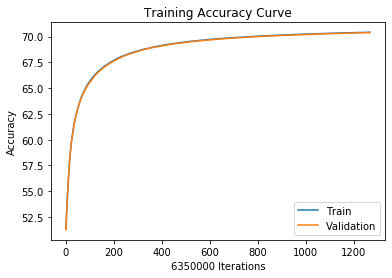

 93%|█████████▎| 455585/491198 [46:51<02:25, 245.03it/s]

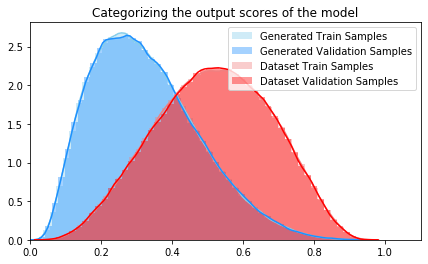

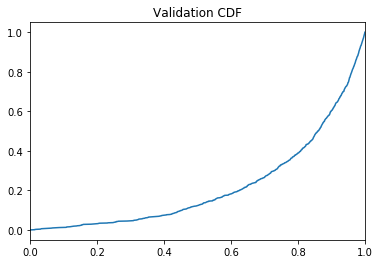

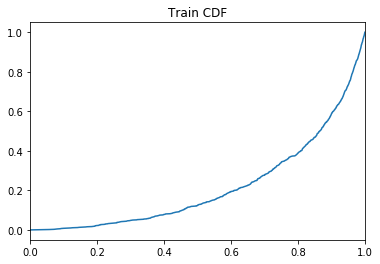

 93%|█████████▎| 455640/491198 [48:14<5:25:45,  1.82it/s]

Training Accuracy at epoch 12: 70.42151181102362
Validation Accuracy epoch 12: 70.38847244094488
Training AUC at epoch 12: 0.21652381818181818
Validation AUC epoch 12: 0.21859345454545456
Train: Sensitivity: 0.8021124369750253 Specificity: 0.34559699015370243
Val: Sensitivity: 0.8029239725408097 Specificity: 0.3470515781553867


  0%|          | 26/491198 [00:00<33:10, 246.75it/s]

Saving to:  model_checkpoints/binary/BlosumLinearNet/07292020.pth
Starting epoch: 13  with learning rate:  [0.00040500000000000003]


  3%|▎         | 14213/491198 [00:54<28:59, 274.22it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 44%|████▎     | 214418/491198 [20:22<16:55, 272.58it/s]

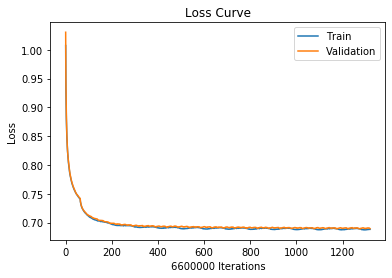

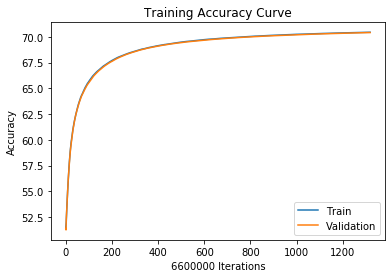

 44%|████▎     | 214418/491198 [20:41<16:55, 272.58it/s]

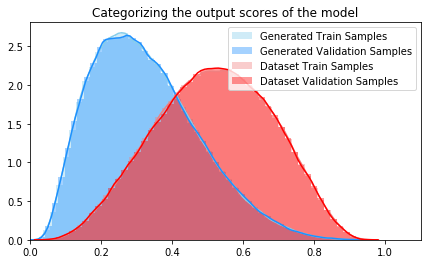

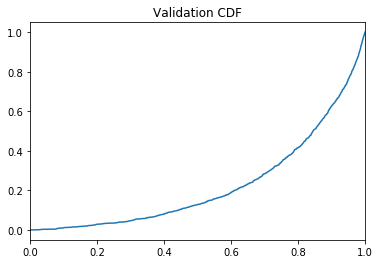

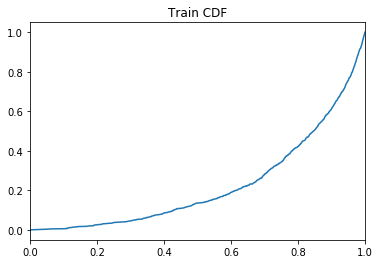

 44%|████▎     | 214463/491198 [22:07<211:41:29,  2.75s/it]

Training Accuracy at epoch 13: 70.44587878787878
Validation Accuracy epoch 13: 70.41445454545455
Training AUC at epoch 13: 0.22500245454545453
Validation AUC epoch 13: 0.22471909090909092
Train: Sensitivity: 0.8022027400703872 Specificity: 0.34534137483075344
Val: Sensitivity: 0.8030645185735288 Specificity: 0.3467920046751561


 54%|█████▍    | 264400/491198 [25:11<13:30, 279.80it/s]   

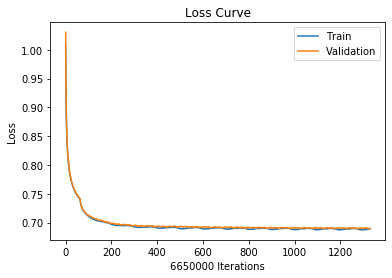

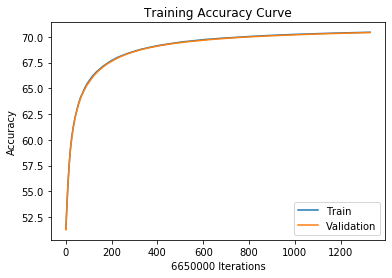

 54%|█████▍    | 264400/491198 [25:31<13:30, 279.80it/s]

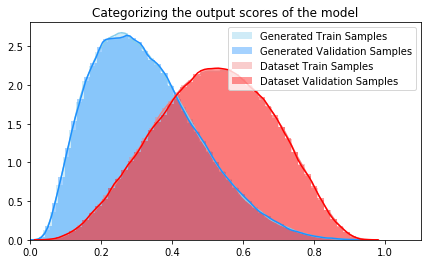

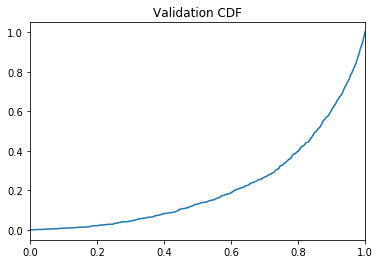

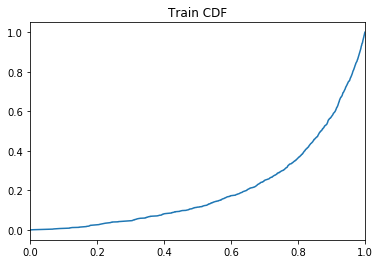

 54%|█████▍    | 264461/491198 [26:55<53:09:25,  1.18it/s]

Training Accuracy at epoch 13: 70.45054135338346
Validation Accuracy epoch 13: 70.42069172932331
Training AUC at epoch 13: 0.20833672727272728
Validation AUC epoch 13: 0.2191978181818182
Train: Sensitivity: 0.8022406757661456 Specificity: 0.3453064191458589
Val: Sensitivity: 0.8030825697163135 Specificity: 0.34672359784642115


 62%|██████▏   | 305778/491198 [29:34<13:02, 236.95it/s]  IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 15%|█▍        | 73216/491198 [06:30<26:52, 259.26it/s]

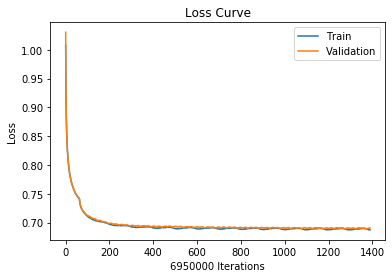

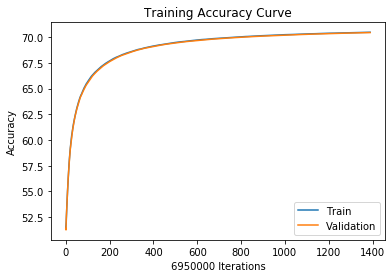

 15%|█▍        | 73216/491198 [06:50<26:52, 259.26it/s]

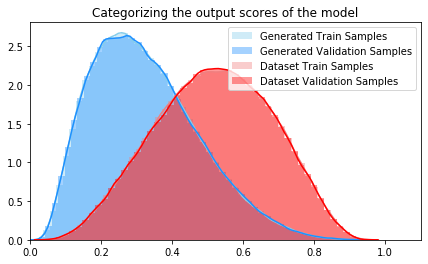

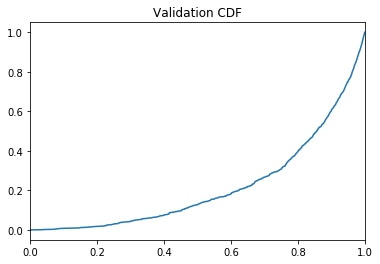

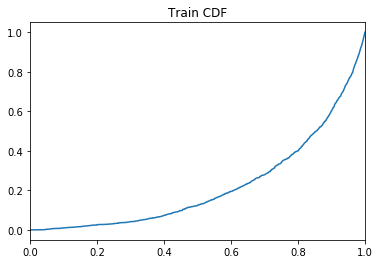

 15%|█▍        | 73244/491198 [08:22<227:07:18,  1.96s/it]

Training Accuracy at epoch 14: 70.48230215827338
Validation Accuracy epoch 14: 70.44953956834533
Training AUC at epoch 14: 0.22067636363636364
Validation AUC epoch 14: 0.21655818181818182
Train: Sensitivity: 0.8023944216745622 Specificity: 0.3449711786597126
Val: Sensitivity: 0.803242537875136 Specificity: 0.3464355598670832


 25%|██▌       | 123199/491198 [11:40<23:35, 260.06it/s]  

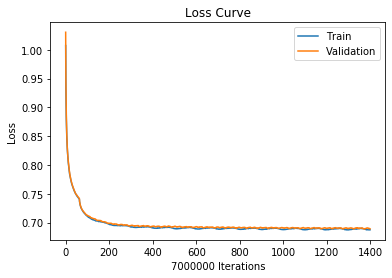

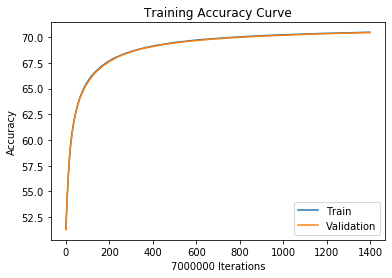

 25%|██▌       | 123199/491198 [12:00<23:35, 260.06it/s]

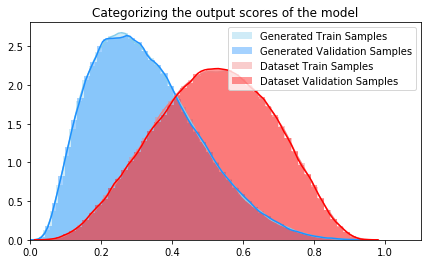

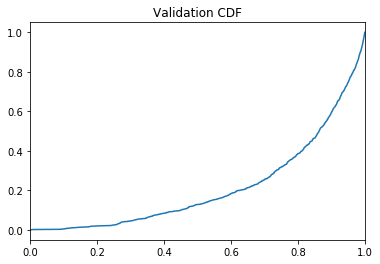

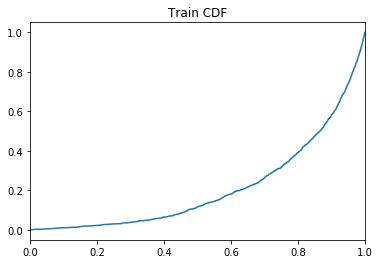

 25%|██▌       | 123265/491198 [13:32<82:49:14,  1.23it/s] 

Training Accuracy at epoch 14: 70.48684285714286
Validation Accuracy epoch 14: 70.45627142857143
Training AUC at epoch 14: 0.21117472727272726
Validation AUC epoch 14: 0.21348172727272727
Train: Sensitivity: 0.8024201593431491 Specificity: 0.3449297928829628
Val: Sensitivity: 0.8032805119808196 Specificity: 0.3463707186057073


 25%|██▌       | 125148/491198 [13:39<25:32, 238.86it/s]  IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 76%|███████▌  | 373209/491198 [36:40<07:18, 269.35it/s]

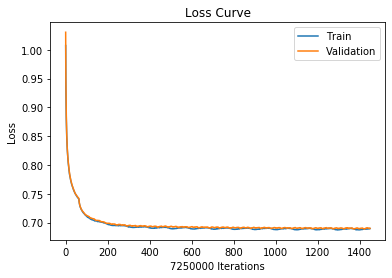

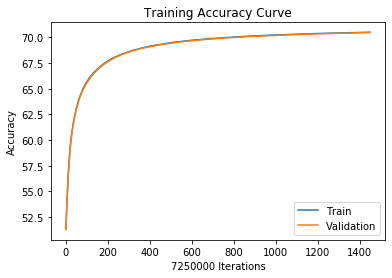

 76%|███████▌  | 373209/491198 [37:00<07:18, 269.35it/s]

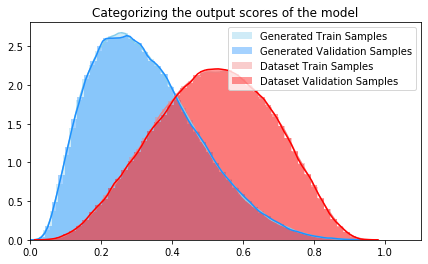

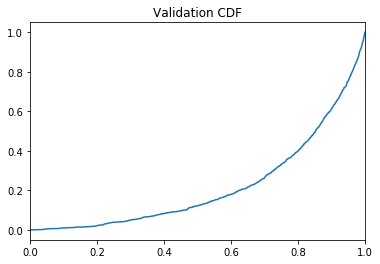

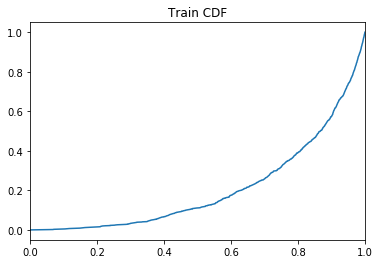

 76%|███████▌  | 373265/491198 [38:31<39:55:56,  1.22s/it]

Training Accuracy at epoch 14: 70.50622068965517
Validation Accuracy epoch 14: 70.47929655172413
Training AUC at epoch 14: 0.20799
Validation AUC epoch 14: 0.2191669090909091
Train: Sensitivity: 0.802507330720511 Specificity: 0.3447370669801313
Val: Sensitivity: 0.803403376080387 Specificity: 0.3461392845384381


 86%|████████▌ | 423222/491198 [41:45<04:44, 239.16it/s]  

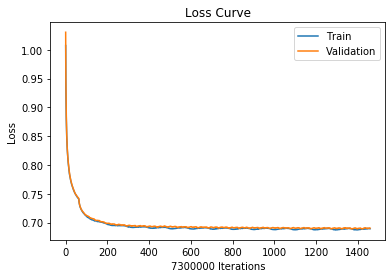

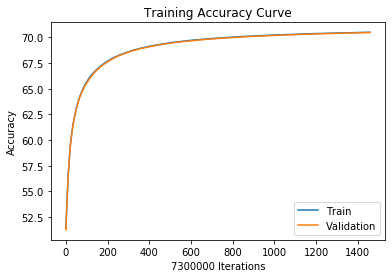

 86%|████████▌ | 423222/491198 [42:00<04:44, 239.16it/s]

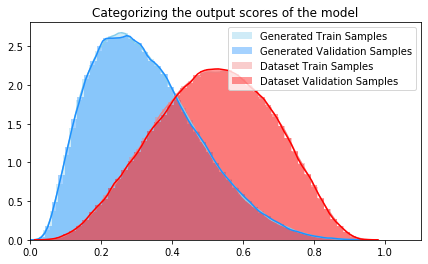

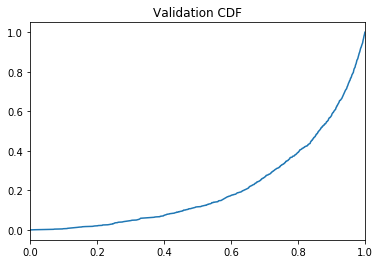

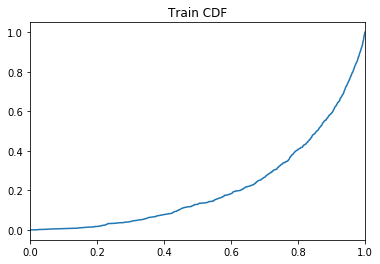

 86%|████████▌ | 423260/491198 [43:35<72:30:51,  3.84s/it] 

Training Accuracy at epoch 14: 70.51191780821918
Validation Accuracy epoch 14: 70.4832602739726
Training AUC at epoch 14: 0.21659427272727275
Validation AUC epoch 14: 0.21185563636363636
Train: Sensitivity: 0.8025457741202581 Specificity: 0.34467884267855703
Val: Sensitivity: 0.8034063814154676 Specificity: 0.3460913999392941


 89%|████████▉ | 439264/491198 [44:37<03:31, 246.01it/s]  IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 37%|███▋      | 182005/491198 [17:24<20:46, 248.07it/s]

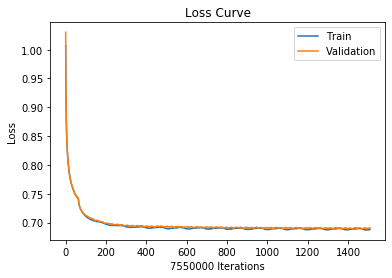

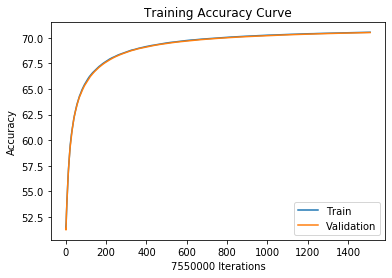

 37%|███▋      | 182005/491198 [17:40<20:46, 248.07it/s]

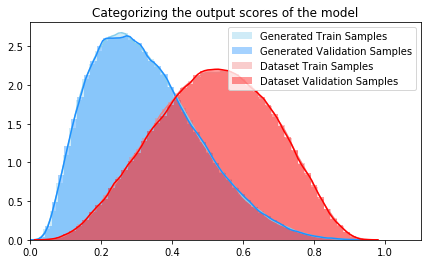

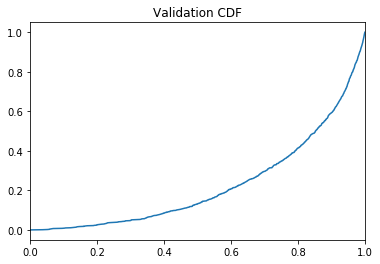

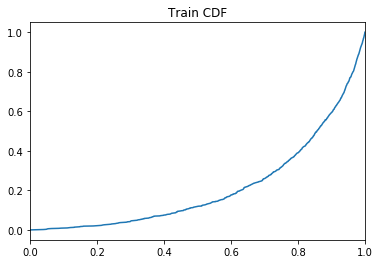

 37%|███▋      | 182046/491198 [19:16<81:11:14,  1.06it/s] 

Training Accuracy at epoch 15: 70.53219867549669
Validation Accuracy epoch 15: 70.50344370860927
Training AUC at epoch 15: 0.21397272727272726
Validation AUC epoch 15: 0.2251859090909091
Train: Sensitivity: 0.8026245455861694 Specificity: 0.3444638212757608
Val: Sensitivity: 0.8035045915480699 Specificity: 0.34588520299900977


 47%|████▋     | 232007/491198 [22:29<16:28, 262.26it/s]  

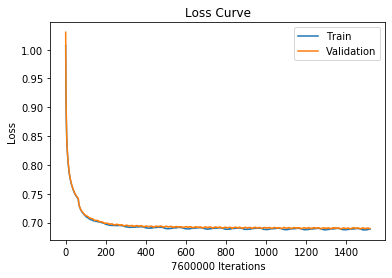

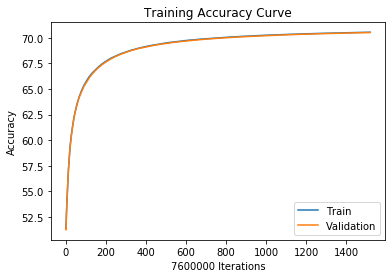

 47%|████▋     | 232007/491198 [22:40<16:28, 262.26it/s]

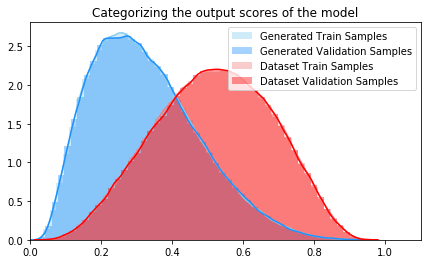

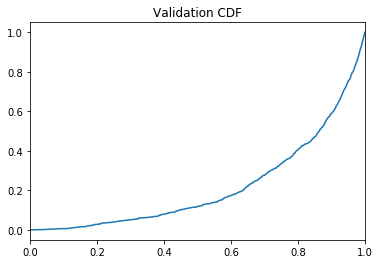

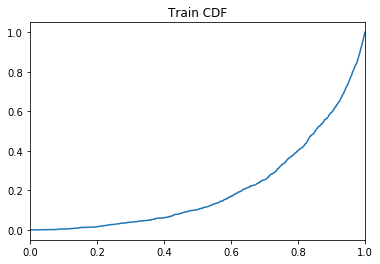

 47%|████▋     | 232063/491198 [24:21<74:06:50,  1.03s/it] 

Training Accuracy at epoch 15: 70.53371052631579
Validation Accuracy epoch 15: 70.50798684210527
Training AUC at epoch 15: 0.2098187272727273
Validation AUC epoch 15: 0.21686945454545453
Train: Sensitivity: 0.802620506244585 Specificity: 0.34444753645651305
Val: Sensitivity: 0.8035739307023066 Specificity: 0.34585757715919685


 52%|█████▏    | 256346/491198 [26:05<15:52, 246.55it/s]  IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 98%|█████████▊| 482014/491198 [48:02<00:38, 236.16it/s]

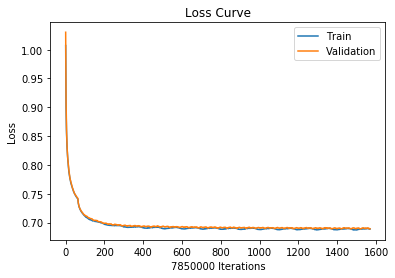

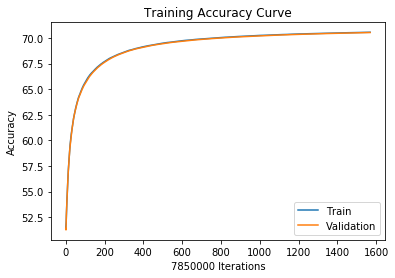

 98%|█████████▊| 482014/491198 [48:21<00:38, 236.16it/s]

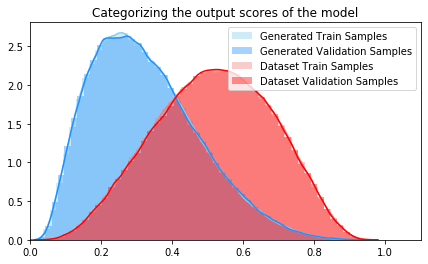

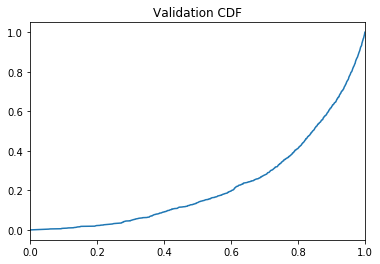

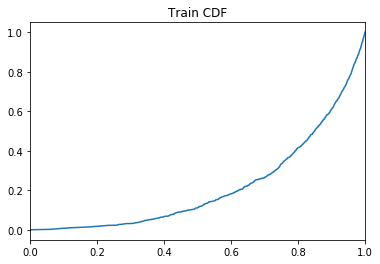

 98%|█████████▊| 482063/491198 [49:57<3:50:35,  1.51s/it]

Training Accuracy at epoch 15: 70.5551719745223
Validation Accuracy epoch 15: 70.5284458598726
Training AUC at epoch 15: 0.2167119090909091
Validation AUC epoch 15: 0.2272298181818182
Train: Sensitivity: 0.8027382020671722 Specificity: 0.34422748772803924
Val: Sensitivity: 0.8036713632101068 Specificity: 0.34564880189051145


  0%|          | 32/491198 [00:00<35:59, 227.46it/s]

Saving to:  model_checkpoints/binary/BlosumLinearNet/07292020.pth
Starting epoch: 16  with learning rate:  [0.0003645]


  8%|▊         | 40800/491198 [02:53<32:56, 227.93it/s]

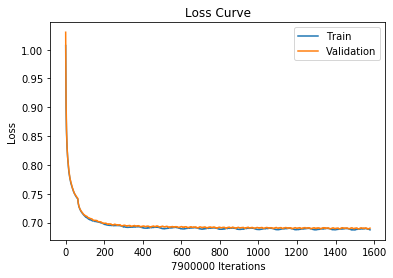

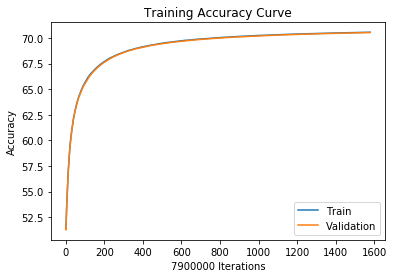

  8%|▊         | 40800/491198 [03:10<32:56, 227.93it/s]

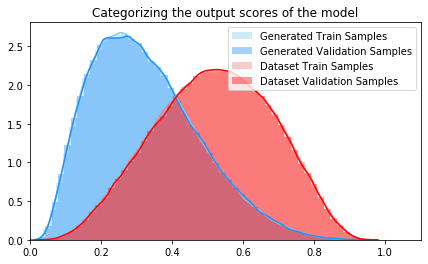

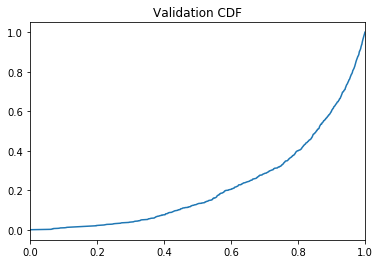

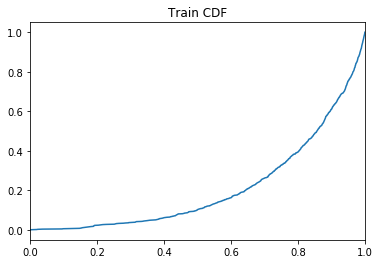

  8%|▊         | 40864/491198 [04:48<94:30:51,  1.32it/s] 

Training Accuracy at epoch 16: 70.55906329113924
Validation Accuracy epoch 16: 70.53159493670886
Training AUC at epoch 16: 0.21023745454545456
Validation AUC epoch 16: 0.22153072727272727
Train: Sensitivity: 0.8027591742656439 Specificity: 0.3441845703143694
Val: Sensitivity: 0.8036712131337821 Specificity: 0.34560709552020935


 15%|█▌        | 75814/491198 [07:03<29:52, 231.74it/s]  IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 59%|█████▉    | 290801/491198 [28:32<14:20, 233.00it/s]

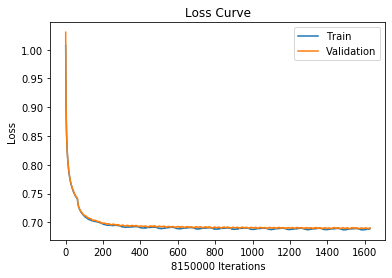

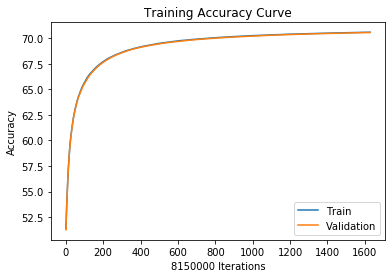

 59%|█████▉    | 290801/491198 [28:50<14:20, 233.00it/s]

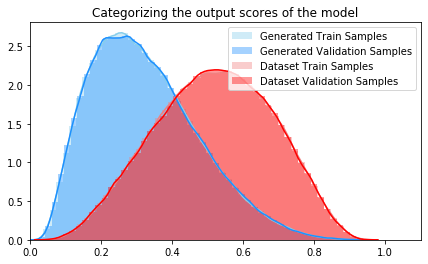

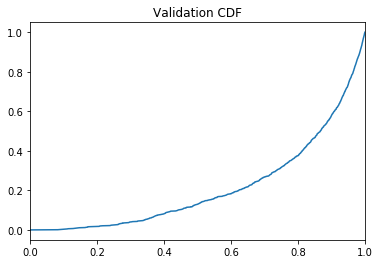

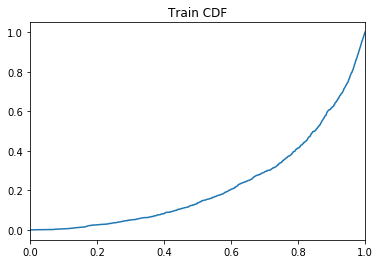

 59%|█████▉    | 290848/491198 [30:29<44:34:32,  1.25it/s]

Training Accuracy at epoch 16: 70.5739754601227
Validation Accuracy epoch 16: 70.55188957055215
Training AUC at epoch 16: 0.227086
Validation AUC epoch 16: 0.21257809090909094
Train: Sensitivity: 0.8028242477154744 Specificity: 0.3440473322168767
Val: Sensitivity: 0.8037622659142375 Specificity: 0.34539913187652527


 69%|██████▉   | 340829/491198 [33:43<09:13, 271.85it/s]  

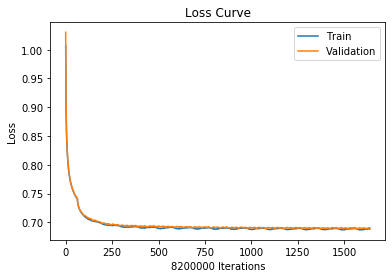

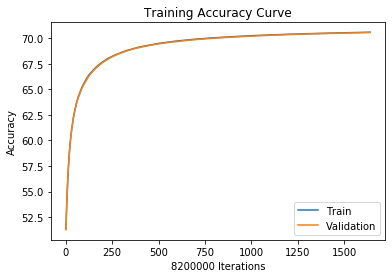

 69%|██████▉   | 340829/491198 [34:00<09:13, 271.85it/s]

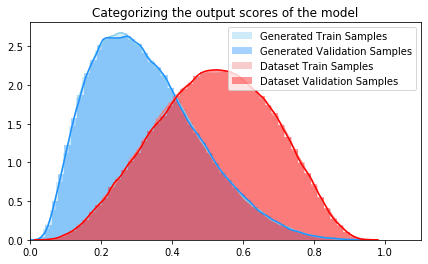

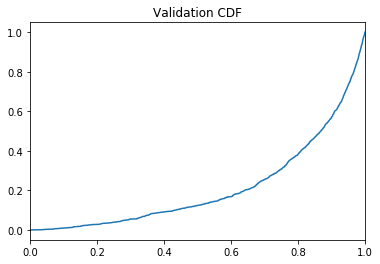

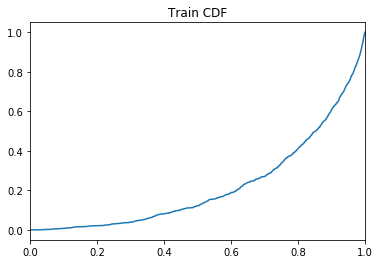

 69%|██████▉   | 340869/491198 [35:40<341:35:46,  8.18s/it]

Training Accuracy at epoch 16: 70.58023170731707
Validation Accuracy epoch 16: 70.5556219512195
Training AUC at epoch 16: 0.219646
Validation AUC epoch 16: 0.21271663636363636
Train: Sensitivity: 0.8028624006065939 Specificity: 0.34398435686654666
Val: Sensitivity: 0.8037969325488663 Specificity: 0.34537023303682246


 77%|███████▋  | 378825/491198 [38:07<07:05, 264.11it/s]   IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 30%|███       | 149618/491198 [13:51<22:23, 254.25it/s]

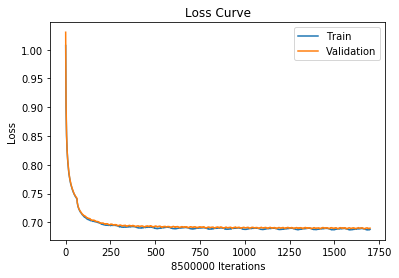

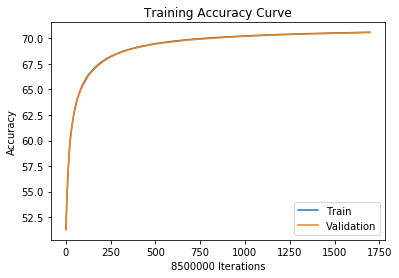

 30%|███       | 149618/491198 [14:10<22:23, 254.25it/s]

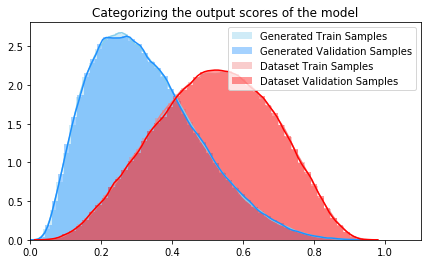

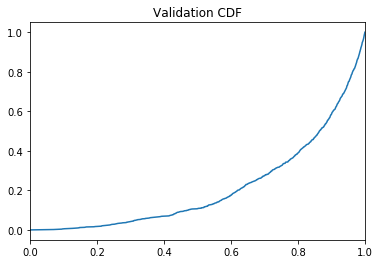

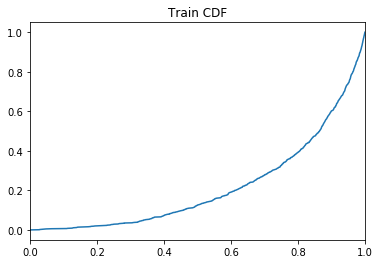

 30%|███       | 149666/491198 [16:05<167:08:33,  1.76s/it]

Training Accuracy at epoch 17: 70.6015294117647
Validation Accuracy epoch 17: 70.5756
Training AUC at epoch 17: 0.215789
Validation AUC epoch 17: 0.21170809090909093
Train: Sensitivity: 0.8029656983190238 Specificity: 0.34375893016590237
Val: Sensitivity: 0.8038813513444639 Specificity: 0.34516095483943826


 41%|████      | 198947/491198 [19:30<20:53, 233.14it/s]   IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 92%|█████████▏| 449631/491198 [47:18<02:43, 254.17it/s]

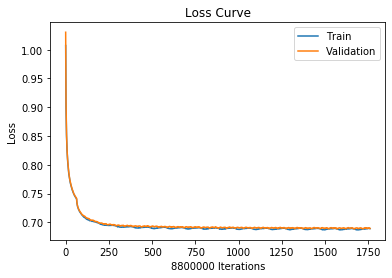

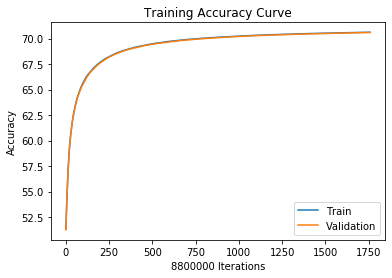

 92%|█████████▏| 449631/491198 [47:31<02:43, 254.17it/s]

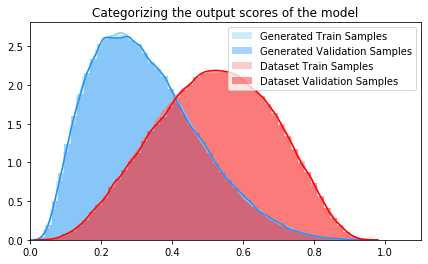

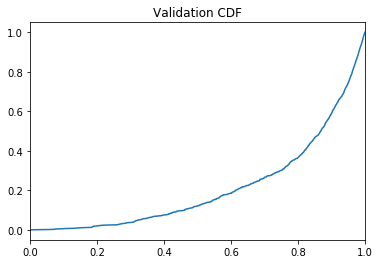

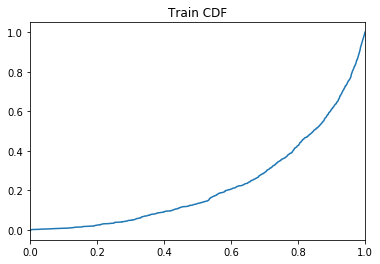

 92%|█████████▏| 449669/491198 [49:41<114:51:20,  9.96s/it]

Training Accuracy at epoch 17: 70.61846590909092
Validation Accuracy epoch 17: 70.59577272727273
Training AUC at epoch 17: 0.22858181818181816
Validation AUC epoch 17: 0.2119598181818182
Train: Sensitivity: 0.8030458293844098 Specificity: 0.3435898335752952
Val: Sensitivity: 0.8040168645411121 Specificity: 0.3449671894077933


  0%|          | 36/491198 [00:00<32:31, 251.62it/s]

Saving to:  model_checkpoints/binary/BlosumLinearNet/07292020.pth
Starting epoch: 18  with learning rate:  [0.0003645]


  2%|▏         | 8418/491198 [00:33<30:14, 266.04it/s]

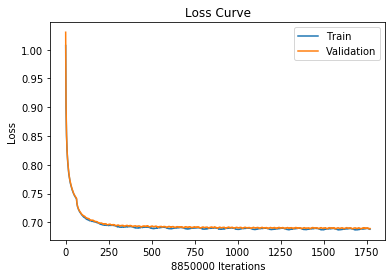

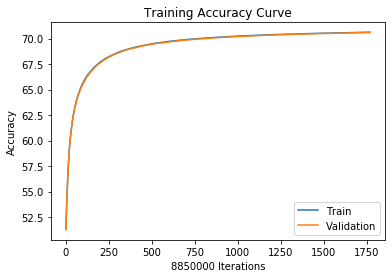

  2%|▏         | 8418/491198 [00:50<30:14, 266.04it/s]

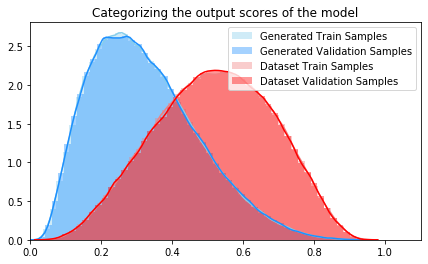

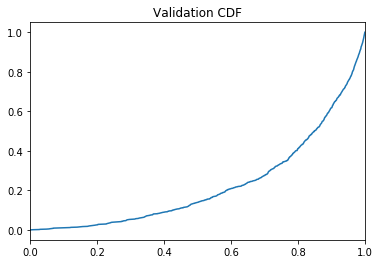

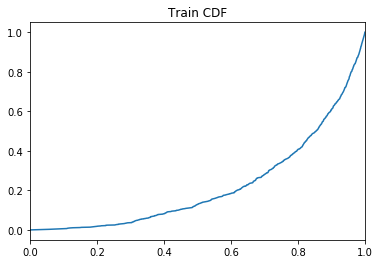

  2%|▏         | 8466/491198 [02:53<219:10:13,  1.63s/it]

Training Accuracy at epoch 18: 70.62250847457626
Validation Accuracy epoch 18: 70.59847457627119
Training AUC at epoch 18: 0.2208042727272727
Validation AUC epoch 18: 0.22683245454545456
Train: Sensitivity: 0.8030650932876188 Specificity: 0.34354046032655644
Val: Sensitivity: 0.8040392908449396 Specificity: 0.3449422689254813


  3%|▎         | 16241/491198 [03:24<34:59, 226.20it/s]  IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 53%|█████▎    | 258408/491198 [28:20<15:12, 255.18it/s]

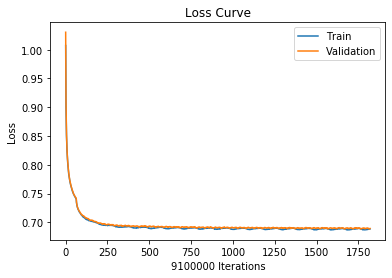

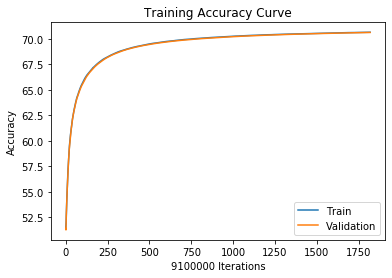

 53%|█████▎    | 258408/491198 [28:30<15:12, 255.18it/s]

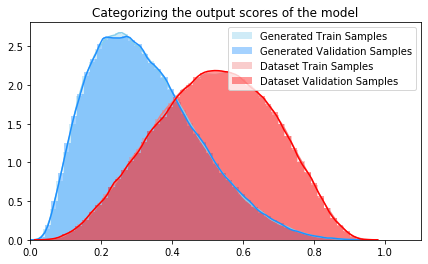

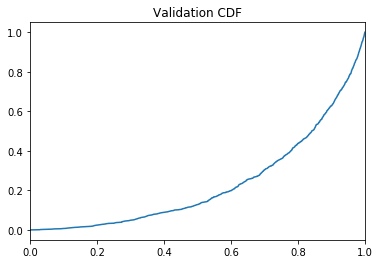

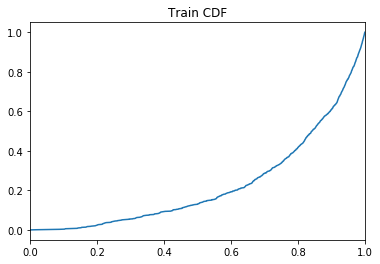

 53%|█████▎    | 258468/491198 [30:44<69:41:51,  1.08s/it]

Training Accuracy at epoch 18: 70.63457142857143
Validation Accuracy epoch 18: 70.61381318681319
Training AUC at epoch 18: 0.22670581818181818
Validation AUC epoch 18: 0.2315689090909091
Train: Sensitivity: 0.8031099700553758 Specificity: 0.343422148521582
Val: Sensitivity: 0.8041152147013357 Specificity: 0.3447863010628457


 63%|██████▎   | 308434/491198 [33:56<11:18, 269.17it/s]  

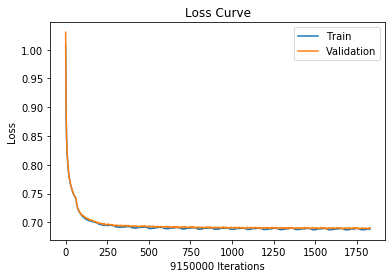

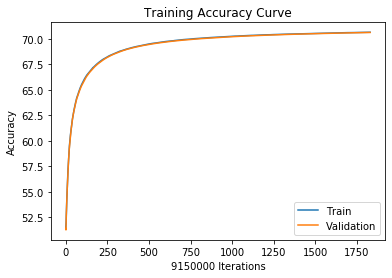

 63%|██████▎   | 308434/491198 [34:10<11:18, 269.17it/s]

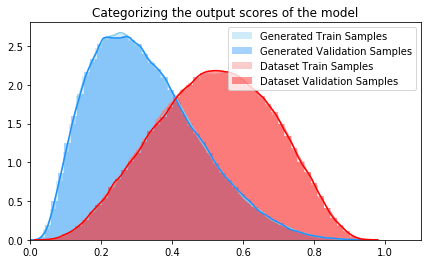

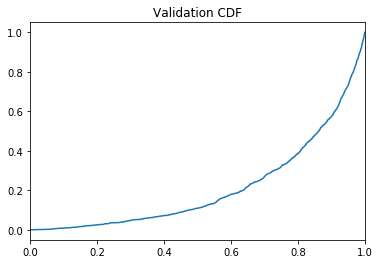

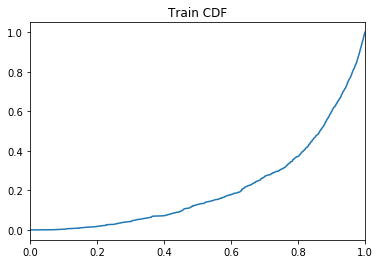

 63%|██████▎   | 308452/491198 [36:19<758:23:27, 14.94s/it] 

Training Accuracy at epoch 18: 70.63831693989071
Validation Accuracy epoch 18: 70.61684153005464
Training AUC at epoch 18: 0.21221254545454546
Validation AUC epoch 18: 0.21229354545454548
Train: Sensitivity: 0.8031391741731404 Specificity: 0.3433930385577529
Val: Sensitivity: 0.8041054003795794 Specificity: 0.34474686971572466


 66%|██████▌   | 324836/491198 [37:21<11:26, 242.34it/s]   IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 14%|█▎        | 67215/491198 [06:34<26:22, 267.91it/s]

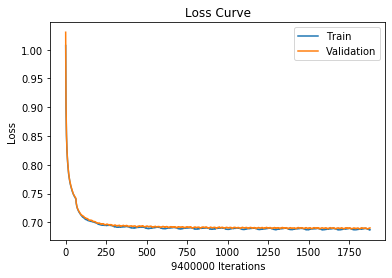

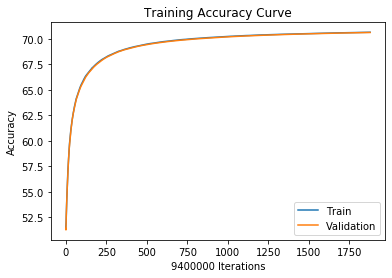

 14%|█▎        | 67215/491198 [06:50<26:22, 267.91it/s]

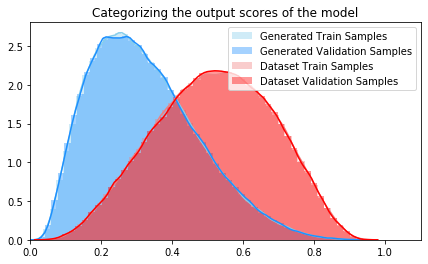

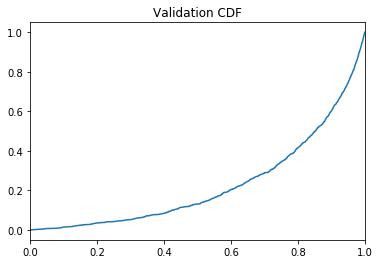

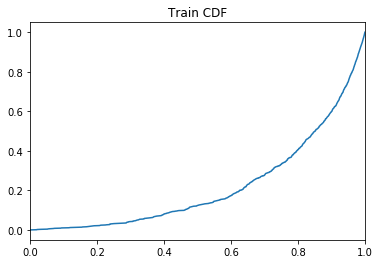

 14%|█▎        | 67273/491198 [08:58<154:01:30,  1.31s/it]

Training Accuracy at epoch 19: 70.65434042553191
Validation Accuracy epoch 19: 70.63041489361702
Training AUC at epoch 19: 0.2186561818181818
Validation AUC epoch 19: 0.22729645454545455
Train: Sensitivity: 0.803217005423766 Specificity: 0.3432174322903448
Val: Sensitivity: 0.8041932800071632 Specificity: 0.3446136599451967


 24%|██▍       | 117227/491198 [12:09<25:13, 247.05it/s]  

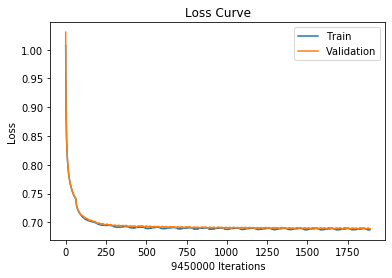

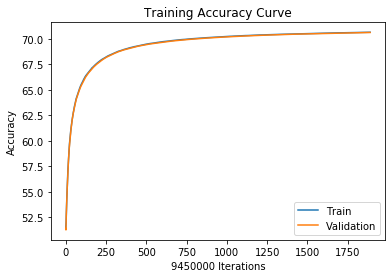

 24%|██▍       | 117227/491198 [12:20<25:13, 247.05it/s]

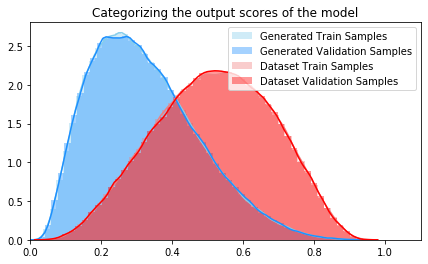

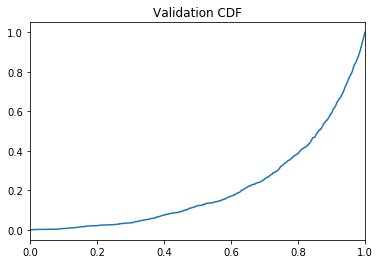

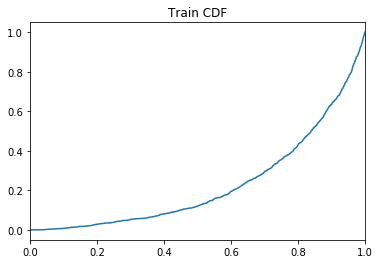

 24%|██▍       | 117273/491198 [14:31<281:09:51,  2.71s/it]

Training Accuracy at epoch 19: 70.65679365079365
Validation Accuracy epoch 19: 70.63453968253968
Training AUC at epoch 19: 0.2287261818181818
Validation AUC epoch 19: 0.21193527272727272
Train: Sensitivity: 0.8032261931636839 Specificity: 0.34319108435955903
Val: Sensitivity: 0.8042347233959918 Specificity: 0.3445807085033953


 30%|███       | 148233/491198 [16:22<20:09, 283.49it/s]   IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 54%|█████▍    | 267219/491198 [28:28<14:17, 261.15it/s]

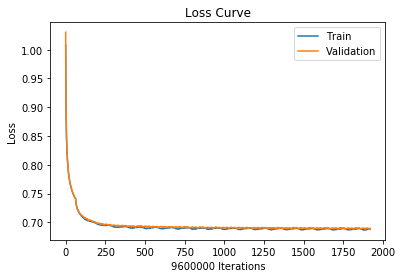

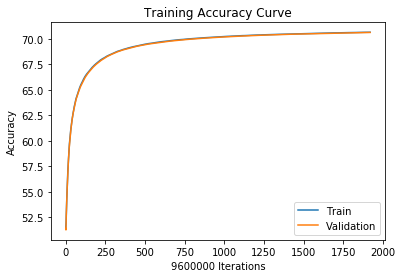

 54%|█████▍    | 267219/491198 [28:40<14:17, 261.15it/s]

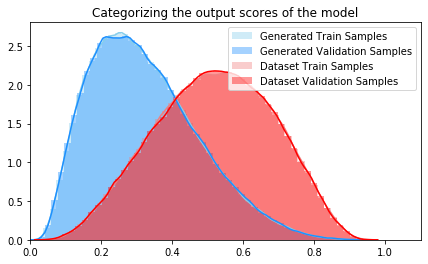

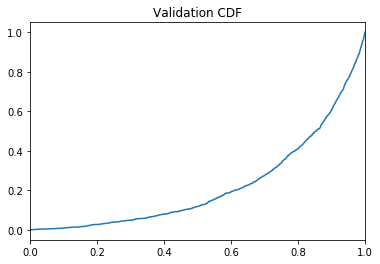

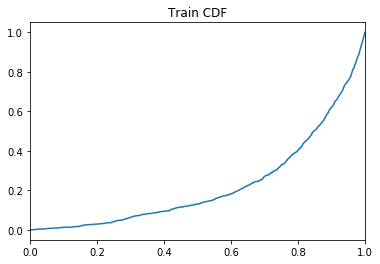

 54%|█████▍    | 267276/491198 [30:53<99:40:10,  1.60s/it] 

Training Accuracy at epoch 19: 70.66210416666667
Validation Accuracy epoch 19: 70.64257291666667
Training AUC at epoch 19: 0.22535972727272724
Validation AUC epoch 19: 0.22240472727272725
Train: Sensitivity: 0.8032417174477718 Specificity: 0.3431420868642747
Val: Sensitivity: 0.8042694056562261 Specificity: 0.3444969703458484


 65%|██████▍   | 317224/491198 [34:04<12:21, 234.61it/s]  

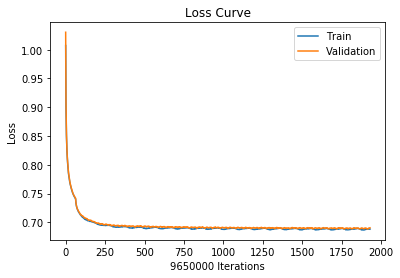

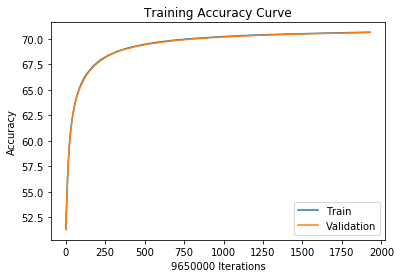

 65%|██████▍   | 317224/491198 [34:20<12:21, 234.61it/s]

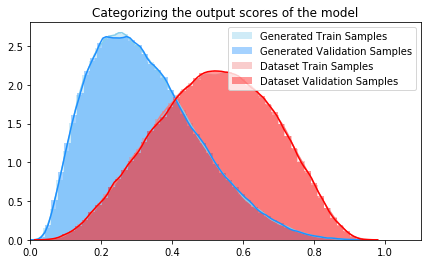

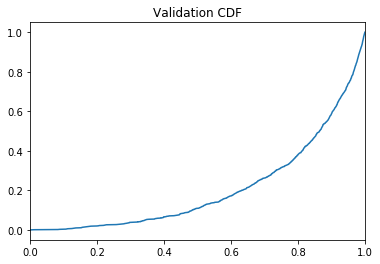

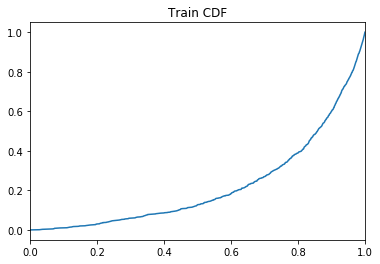

 65%|██████▍   | 317273/491198 [36:24<101:21:58,  2.10s/it]

Training Accuracy at epoch 19: 70.66630051813472
Validation Accuracy epoch 19: 70.64525388601037
Training AUC at epoch 19: 0.2211251818181818
Validation AUC epoch 19: 0.20788581818181817
Train: Sensitivity: 0.8032772445641623 Specificity: 0.34310909284747204
Val: Sensitivity: 0.8042690514655113 Specificity: 0.3444653504052449


 75%|███████▍  | 367219/491198 [39:36<08:13, 251.43it/s]   

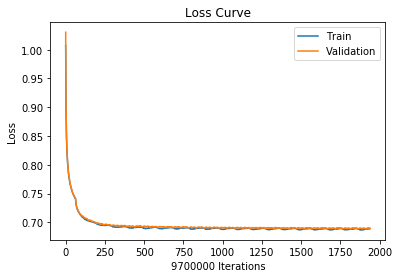

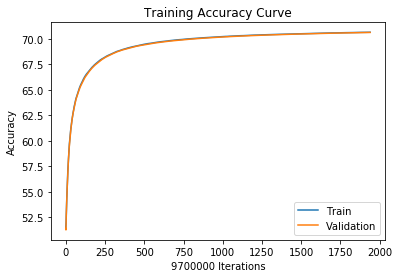

 75%|███████▍  | 367219/491198 [39:50<08:13, 251.43it/s]

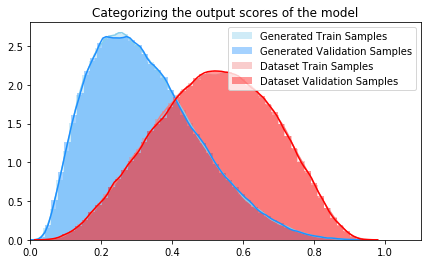

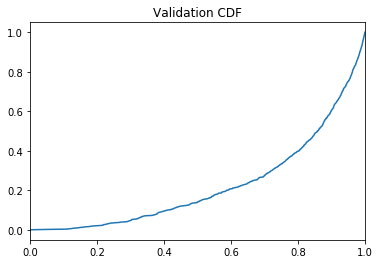

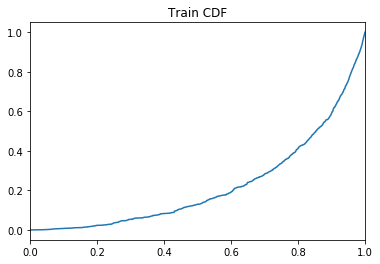

 75%|███████▍  | 367270/491198 [41:55<52:45:09,  1.53s/it]

Training Accuracy at epoch 19: 70.66761855670103
Validation Accuracy epoch 19: 70.64883505154638
Training AUC at epoch 19: 0.22231354545454546
Validation AUC epoch 19: 0.22435745454545455
Train: Sensitivity: 0.8032698357350232 Specificity: 0.34308475119006243
Val: Sensitivity: 0.8043168821173012 Specificity: 0.3444395482707598


 85%|████████▍ | 417201/491198 [45:12<04:59, 246.75it/s]  

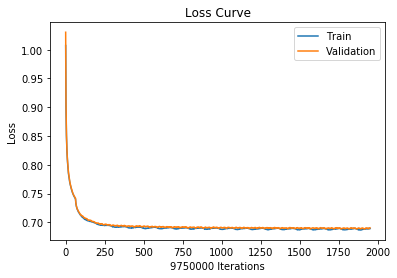

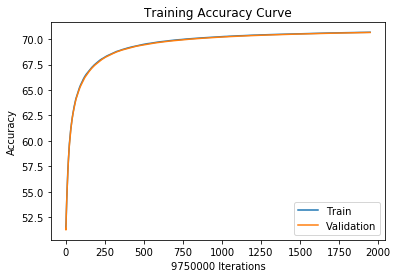

 85%|████████▍ | 417201/491198 [45:30<04:59, 246.75it/s]

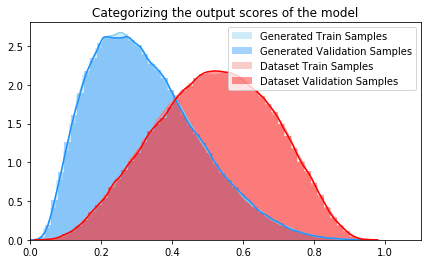

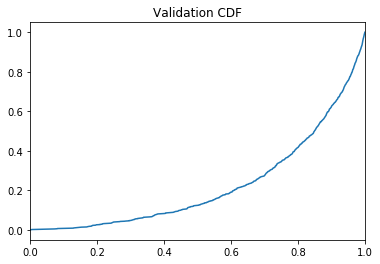

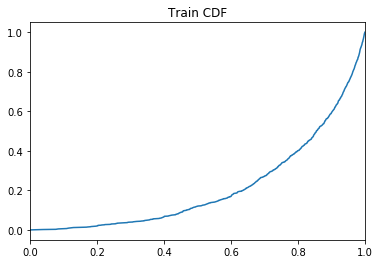

 85%|████████▍ | 417254/491198 [47:31<16:14:42,  1.26it/s]

Training Accuracy at epoch 19: 70.67162051282051
Validation Accuracy epoch 19: 70.6504
Training AUC at epoch 19: 0.21335336363636365
Validation AUC epoch 19: 0.2243429090909091
Train: Sensitivity: 0.8032939779721784 Specificity: 0.3430419389258739
Val: Sensitivity: 0.8043026844897744 Specificity: 0.3444153449187986


 95%|█████████▌| 467215/491198 [50:42<01:21, 292.50it/s]  

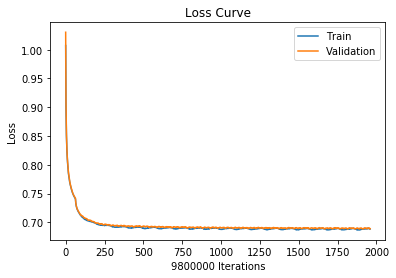

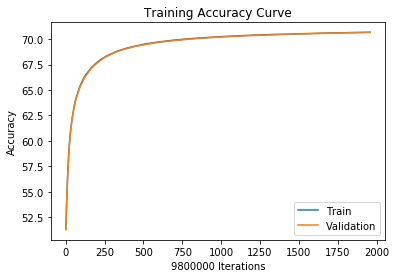

 95%|█████████▌| 467215/491198 [51:00<01:21, 292.50it/s]

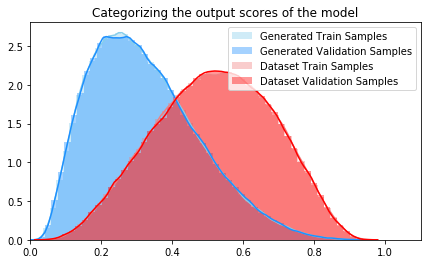

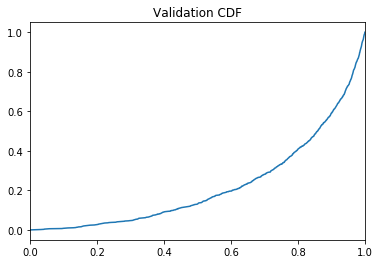

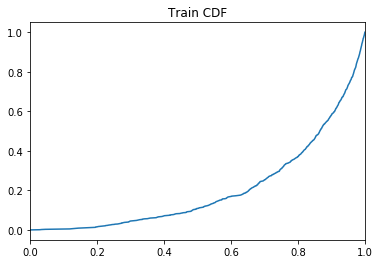

 95%|█████████▌| 467286/491198 [53:03<8:30:56,  1.28s/it] 

Training Accuracy at epoch 19: 70.67439795918368
Validation Accuracy epoch 19: 70.65337755102041
Training AUC at epoch 19: 0.2054368181818182
Validation AUC epoch 19: 0.22209163636363638
Train: Sensitivity: 0.8033110134453468 Specificity: 0.3430129449407859
Val: Sensitivity: 0.8043403499005538 Specificity: 0.34439370630520866


  0%|          | 36/491198 [00:00<23:06, 354.20it/s]

Saving to:  model_checkpoints/binary/BlosumLinearNet/07292020.pth
Starting epoch: 20  with learning rate:  [0.000295245]


  5%|▌         | 26038/491198 [01:34<30:05, 257.59it/s]

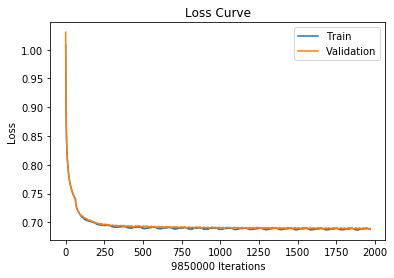

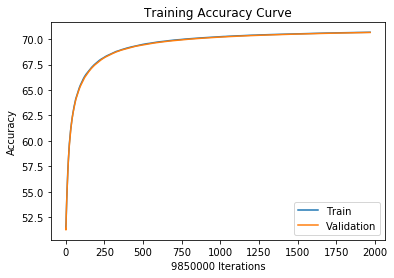

  5%|▌         | 26038/491198 [01:50<30:05, 257.59it/s]

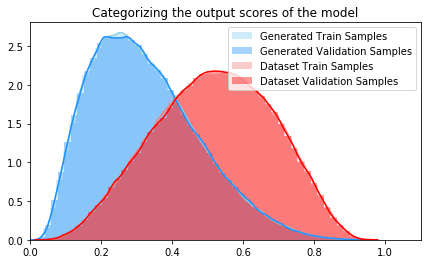

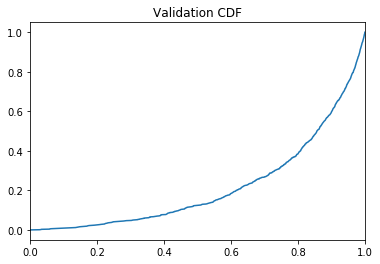

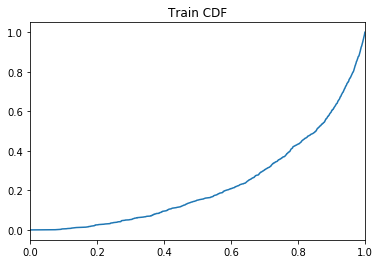

  5%|▌         | 26076/491198 [03:56<1917:47:44, 14.84s/it]

Training Accuracy at epoch 20: 70.67663959390863
Validation Accuracy epoch 20: 70.65514720812183
Training AUC at epoch 20: 0.23056681818181818
Validation AUC epoch 20: 0.21741300000000002
Train: Sensitivity: 0.8033163880669022 Specificity: 0.3429851615102597
Val: Sensitivity: 0.8043415547755354 Specificity: 0.34437074436870646


 15%|█▌        | 76038/491198 [07:07<27:51, 248.41it/s]    

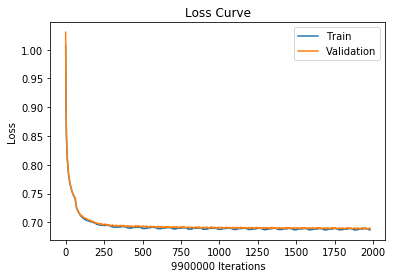

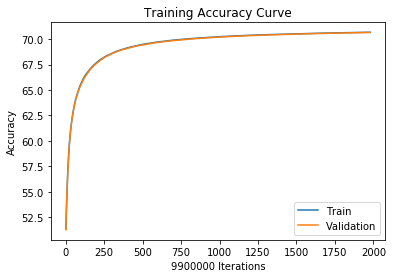

 15%|█▌        | 76038/491198 [07:20<27:51, 248.41it/s]

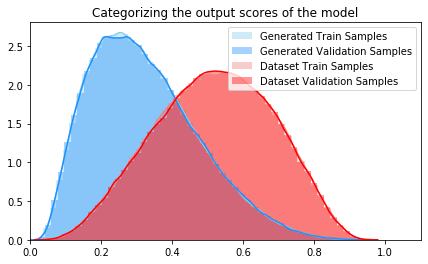

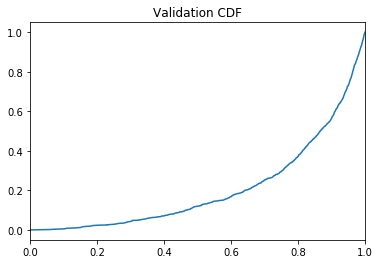

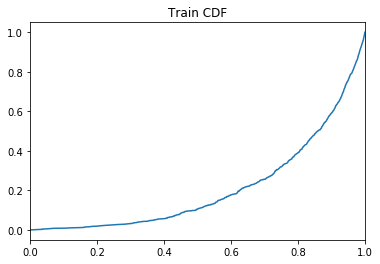

 15%|█▌        | 76072/491198 [09:29<1725:33:22, 14.96s/it]

Training Accuracy at epoch 20: 70.67984848484849
Validation Accuracy epoch 20: 70.65821212121212
Training AUC at epoch 20: 0.20973990909090912
Validation AUC epoch 20: 0.20685954545454546
Train: Sensitivity: 0.8033360429314387 Specificity: 0.34295633661755315
Val: Sensitivity: 0.8043584192176318 Specificity: 0.344338671967409


 26%|██▌       | 126015/491198 [12:34<23:37, 257.56it/s]   

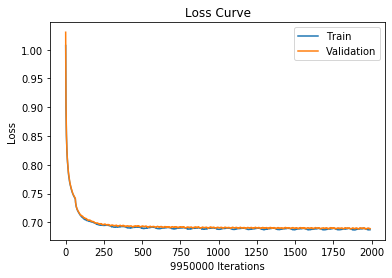

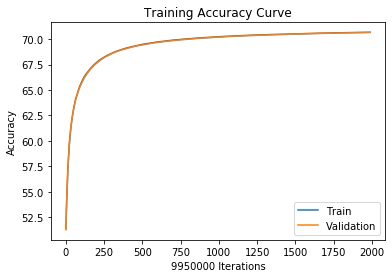

 26%|██▌       | 126015/491198 [12:50<23:37, 257.56it/s]

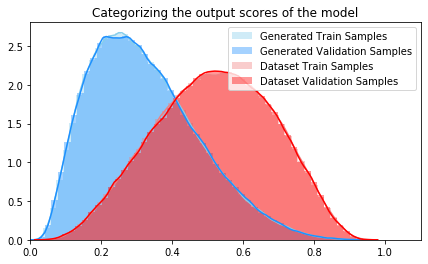

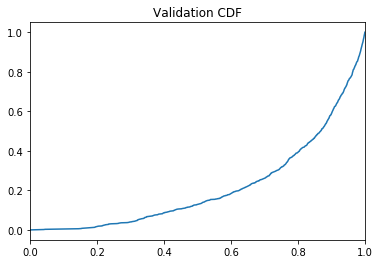

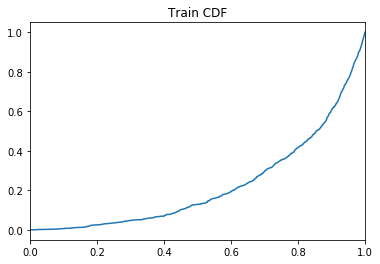

 26%|██▌       | 126056/491198 [14:59<123:42:55,  1.22s/it]

Training Accuracy at epoch 20: 70.68165829145728
Validation Accuracy epoch 20: 70.66170854271357
Training AUC at epoch 20: 0.223447
Validation AUC epoch 20: 0.21504590909090912
Train: Sensitivity: 0.8033442847514479 Specificity: 0.34293968054082613
Val: Sensitivity: 0.8043773040546667 Specificity: 0.34430689365222344


 36%|███▌      | 176024/491198 [18:08<19:01, 276.21it/s]   

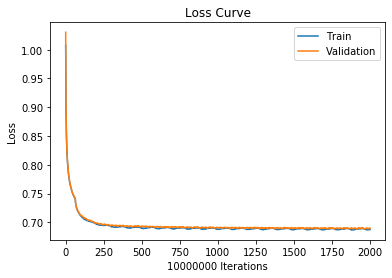

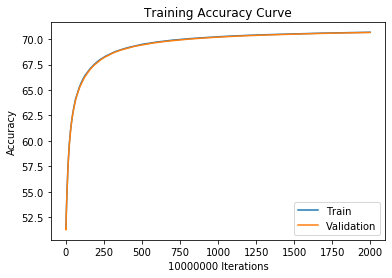

 36%|███▌      | 176024/491198 [18:20<19:01, 276.21it/s]

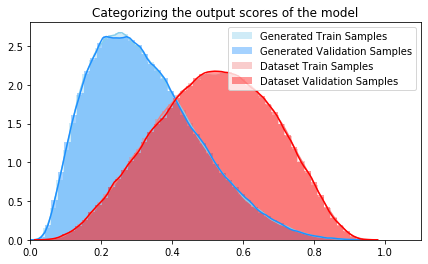

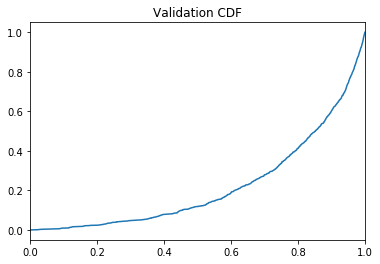

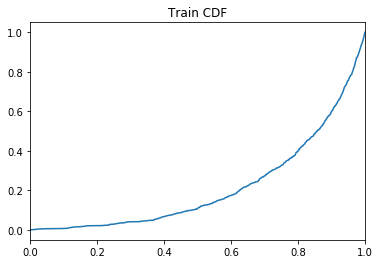

 36%|███▌      | 176078/491198 [20:34<167:52:58,  1.92s/it]

Training Accuracy at epoch 20: 70.68436
Validation Accuracy epoch 20: 70.66388
Training AUC at epoch 20: 0.2142699090909091
Validation AUC epoch 20: 0.21940036363636364
Train: Sensitivity: 0.8033501142819346 Specificity: 0.34290899584364215
Val: Sensitivity: 0.8043723817428743 Specificity: 0.3442769811216296


 46%|████▌     | 226020/491198 [23:45<16:10, 273.24it/s]   

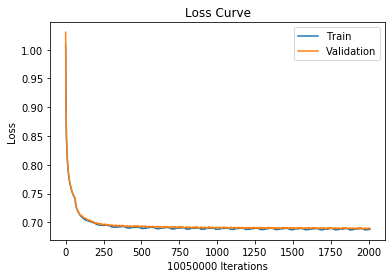

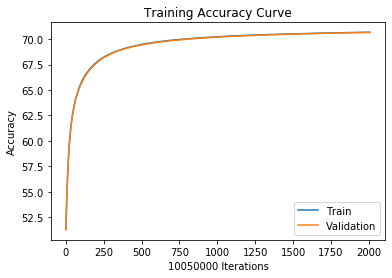

 46%|████▌     | 226020/491198 [24:00<16:10, 273.24it/s]

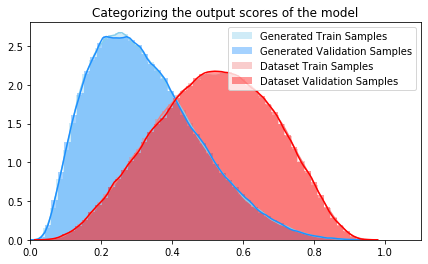

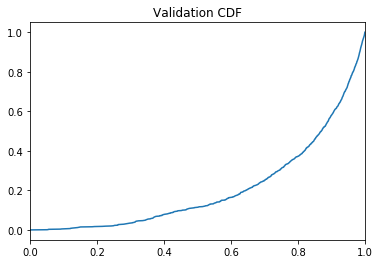

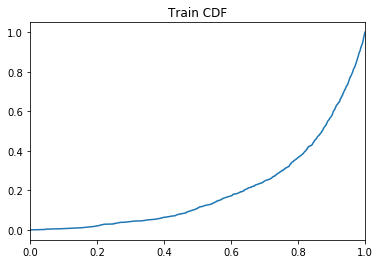

 46%|████▌     | 226074/491198 [26:11<112:27:58,  1.53s/it]

Training Accuracy at epoch 20: 70.6845671641791
Validation Accuracy epoch 20: 70.66639800995024
Training AUC at epoch 20: 0.2046588181818182
Validation AUC epoch 20: 0.20616236363636364
Train: Sensitivity: 0.8033442648268374 Specificity: 0.34290691242460564
Val: Sensitivity: 0.804421333953056 Specificity: 0.344265240026636


 56%|█████▌    | 276013/491198 [29:13<13:48, 259.74it/s]   

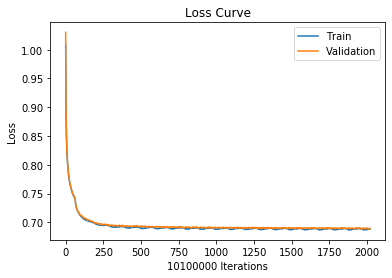

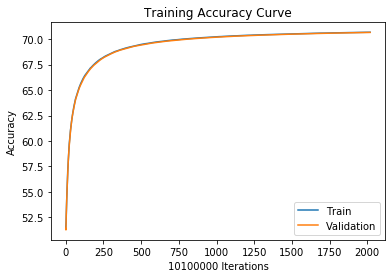

 56%|█████▌    | 276013/491198 [29:30<13:48, 259.74it/s]

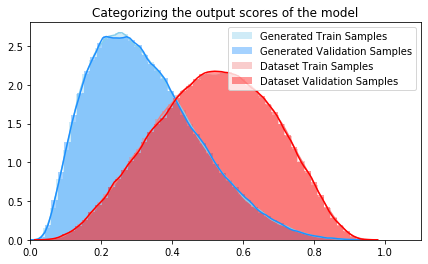

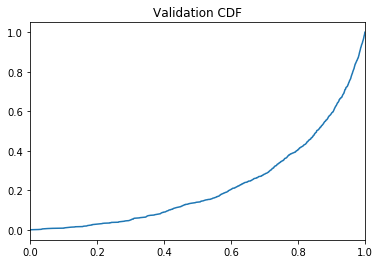

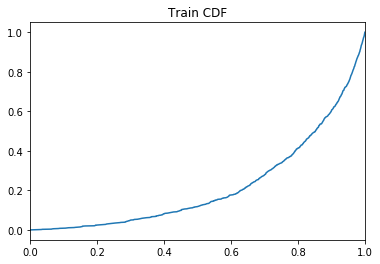

 56%|█████▌    | 276071/491198 [31:46<71:30:47,  1.20s/it] 

Training Accuracy at epoch 20: 70.68654455445545
Validation Accuracy epoch 20: 70.66939603960397
Training AUC at epoch 20: 0.21973145454545456
Validation AUC epoch 20: 0.22537736363636365
Train: Sensitivity: 0.803351865890443 Specificity: 0.34289002889533676
Val: Sensitivity: 0.8044157208935605 Specificity: 0.3442263334399591


 66%|██████▋   | 326004/491198 [34:58<11:04, 248.69it/s]  

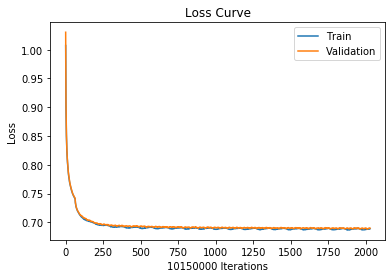

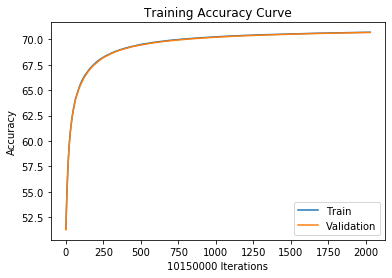

 66%|██████▋   | 326004/491198 [35:10<11:04, 248.69it/s]

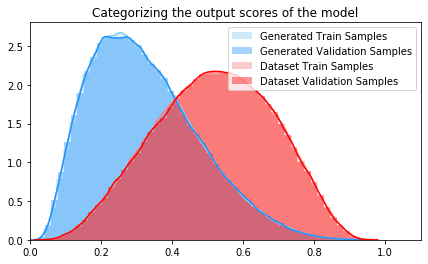

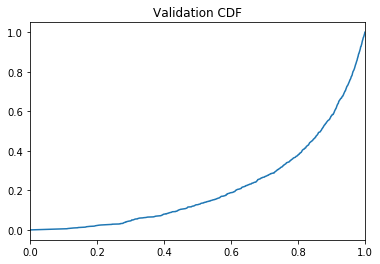

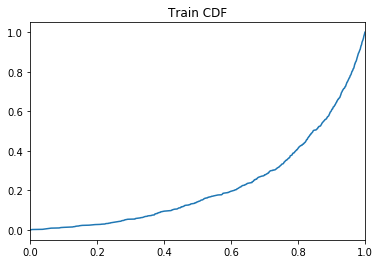

 66%|██████▋   | 326056/491198 [37:29<40:40:51,  1.13it/s]

Training Accuracy at epoch 20: 70.69073891625615
Validation Accuracy epoch 20: 70.67248275862069
Training AUC at epoch 20: 0.22672745454545457
Validation AUC epoch 20: 0.21409490909090909
Train: Sensitivity: 0.8033808599376638 Specificity: 0.34285338803147186
Val: Sensitivity: 0.8044292136466389 Specificity: 0.34419470957324666


 77%|███████▋  | 376037/491198 [40:42<07:17, 263.03it/s]  

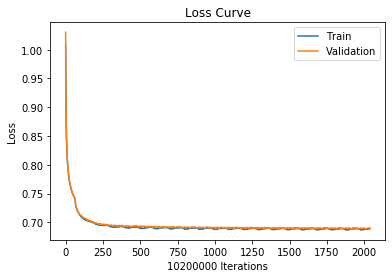

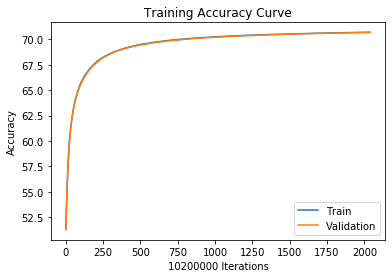

 77%|███████▋  | 376037/491198 [41:00<07:17, 263.03it/s]

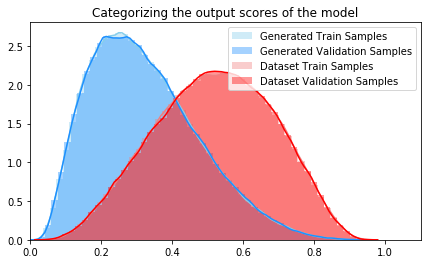

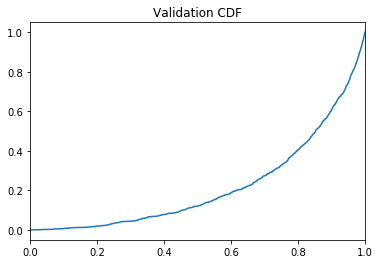

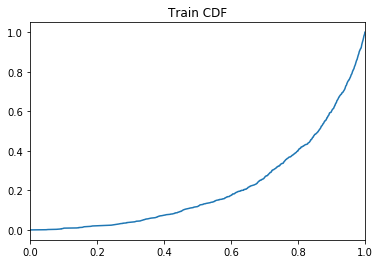

 77%|███████▋  | 376076/491198 [43:13<338:57:15, 10.60s/it]

Training Accuracy at epoch 20: 70.69237254901961
Validation Accuracy epoch 20: 70.67496078431373
Training AUC at epoch 20: 0.21446145454545457
Validation AUC epoch 20: 0.2179777272727273
Train: Sensitivity: 0.8033921022280857 Specificity: 0.3428335101505044
Val: Sensitivity: 0.8044511095583341 Specificity: 0.3441734502219625


 87%|████████▋ | 426026/491198 [46:24<04:36, 235.73it/s]   

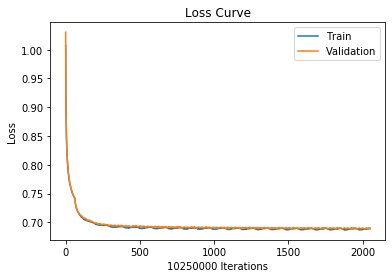

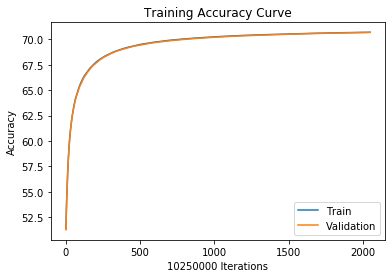

 87%|████████▋ | 426026/491198 [46:40<04:36, 235.73it/s]

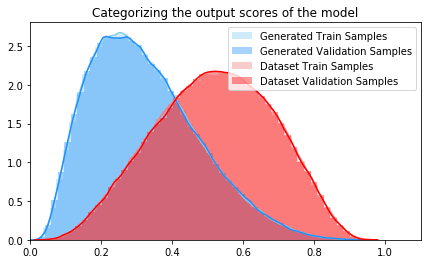

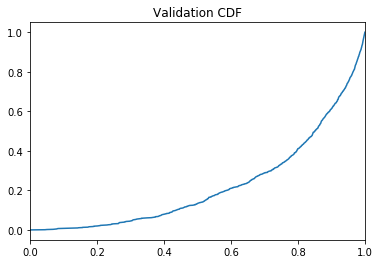

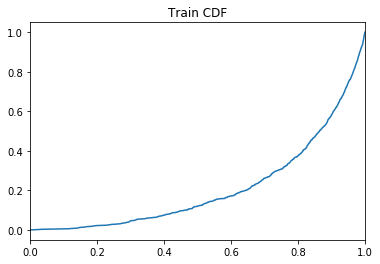

 87%|████████▋ | 426075/491198 [48:55<40:54:38,  2.26s/it]

Training Accuracy at epoch 20: 70.69563902439025
Validation Accuracy epoch 20: 70.6770731707317
Training AUC at epoch 20: 0.20979399999999998
Validation AUC epoch 20: 0.22397818181818183
Train: Sensitivity: 0.8034103129326358 Specificity: 0.34279827972267696
Val: Sensitivity: 0.8044515777808908 Specificity: 0.34414602754705803


 91%|█████████▏| 448372/491198 [50:20<02:57, 241.51it/s]  

In [ ]:
model = BlosumLinearNet()
model_name = model.name
model_id = "07292020"
model.to(device)
checkpoint = None
save_path = 'model_checkpoints/binary/%s/%s.pth' % (model_name, model_id)
NUM_EPOCHS = 50
BATCH_SIZE = 64
cdf=False
if cdf:
   # For the CDF functions, we need to generate a dataset of new examples
    S_new = GeneratedDataset(10*m) 
gamma = 5e-4
classifier(model, binary_train, binary_val, gamma, model_id, NUM_EPOCHS, BATCH_SIZE, model.single_alphabet, checkpoint, save_path, cdf=cdf)

## Evaluate the model